In [1]:
##### This code is from Updated Testing Reddit - No Con- bias (Fictitious Play)-01092022
##### This code replace the big real datanetwork with small sythetic network 
import scipy
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from itertools import combinations
import time
import random
from scipy.stats import beta
import pandas as pd
import copy
%matplotlib inline
#%run pure_strategy_selection.ipynb  #include simple selection algorithm
import scipy.io
import collections
import sys
from itertools import count


save_path = 'C:/Users/xzhan176/OneDrive/Misinfo Paper/K Nodes - All/Sythetic Network - less memory version/'

## Mathmatic Functions

In [2]:

# centers the opinion vector around 0\n",
def mean_center(op, n):
    ones = np.ones((n, 1))
    x = op - (np.dot(np.transpose(op),ones)/n) * ones
    return x
    
# compute number of edges, m\n
def num_edges(L, n):
    m = 0
    for i in range(n):
        for j in range(n):
            if i > j and L[i,j] < 0:
                m += 1            
    return m

# maximizing polarization only: \\bar{z}^T \\bar{z}   
def obj_polarization(A, L, op, n):
    op_mean = mean_center(op, n)
    z_mean = np.dot(A, op_mean) 
    return np.dot(np.transpose(z_mean), z_mean)[0,0] 

# def obj_polarization_1(A, L, op, n):  #z_mean is the same as s_mean - according to Stanford paper theory
#     z = np.dot(A, op) 
#     z_mean = mean_center(z, n)
#     return np.dot(np.transpose(z_mean), z_mean)[0,0] 

# Calculate innate polarization
def obj_innate_polarization(s, n):  
#     np.set_printoptions(precision=5)
    op_mean = mean_center(s, n)
    return np.dot(np.transpose(op_mean), op_mean)[0,0]
# Parameters for the network

np.set_printoptions(precision=3)

#### 1.Creating Network


In [11]:
%run Karate.ipynb
#%run Reddit.ipynb
# %run Twitter.ipynb
#%run Synthetic_network.ipynb

There are 34 agents
[[0. 1. 1. ... 1. 0. 0.]
 [1. 0. 1. ... 0. 0. 0.]
 [1. 1. 0. ... 0. 1. 0.]
 ...
 [1. 0. 0. ... 0. 1. 1.]
 [0. 0. 1. ... 1. 0. 1.]
 [0. 0. 0. ... 1. 1. 0.]]


#### 2. Visualize Network


In [4]:
############################ Make Innate Opinion ################################
##create two set of weights connected with density 1) inviduals  2) individual & informaton Source
c1 = np.sort(np.random.choice(n, n, replace=False)) #assume (1-r) are individuals
# print('c1')
# print(c1)
l1 = len(c1)
n = l1
print('There are ' + str(n) + ' agents')

##### Import Innate opinion
# df = pd.read_csv ('Karate Innate Opinion.csv')
# s_1 = np.array(df[df.columns[1]])
# s = np.reshape(s_1, (34, -1))


# print(s)
s_use = s.flatten()   # Convert array to a list for later operation
s_use = s_use.tolist()
new_s = [i * 30 for i in s_use]
df = pd.DataFrame(new_s, columns=['Opinion']) #create a datafram with index at column 1, opinion at column 2

######################### Calculate Key Values & Visualization #######################################3
L = scipy.sparse.csgraph.laplacian(G, normed=False)  # Return the Laplacian matrix
A = np.linalg.inv(np.identity(n) + L)  # A = (I + L)^(-1)\n  Stanford paper theory
m = num_edges(L, n)                    # call the function to calculate the number of edges
columnsum_ij = np.sum(A, axis=0)
nxG = nx.from_numpy_matrix(G)          
plt.figure(figsize=(20, 20))

########## Create Node color
# create color map
min_equi = [6,29]
max_equi = [11,16]

color_map = []
for node in nxG:
    if node in min_equi:
        color_map.append('orange')
    elif node in max_equi: 
        color_map.append('Red')  
    else:
        #color_map.append('#1f77b4')  
        color_map.append('grey') 



There are 34 agents


<Figure size 2000x2000 with 0 Axes>

<class 'list'>


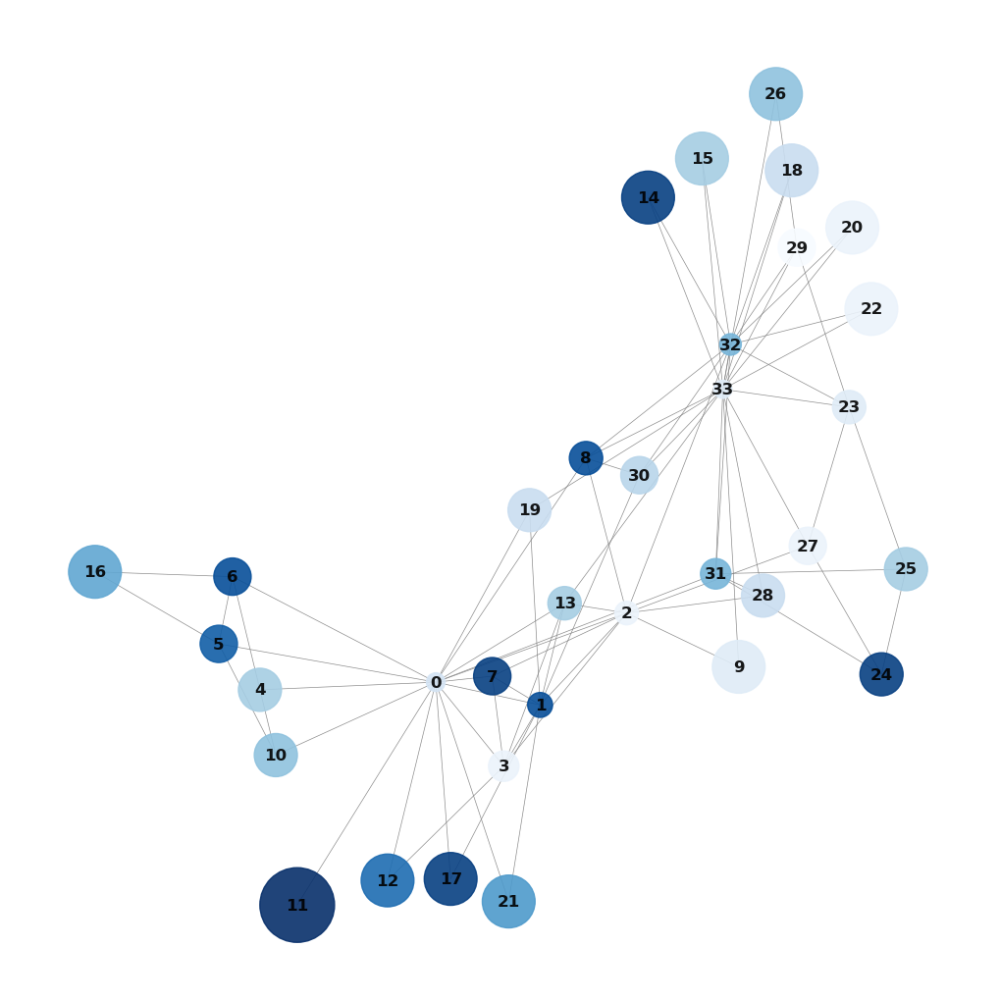

In [5]:
def node_edge(G, n):
    edges =[]
    for v in range(n):
        a = np.array(np.nonzero(G[v])[0])
        edge = len(a)
#         print(edge)
        edges.append(edge)
        
    return edges

node_edges = node_edge(G, n)
node_sizes = node_edges*10
print(type(node_edges))

min_equi = [6,29] #fill in minimizer selected nodes
max_equi = [11,16] #fill in maximizer selected nodes


plt.figure(figsize=(10, 10))

# nxG = nx.from_numpy_matrix(G)

# create color map
color_map = []
for node in nxG:
    if node in min_equi:
        color_map.append('orange')
    elif node in max_equi: 
        color_map.append('Red')  
    else:
        #color_map.append('#1f77b4')  
        color_map.append('grey') 


# create node color map value
s_use = s.flatten()
s_use = s_use.tolist()
new_s = [i * 30 for i in s_use]
df = pd.DataFrame(new_s, columns=['Opinion'])

# create node size map
# def node_edge(G, n):
#     edges =[]
#     for v in range(n):
#         a = np.array(np.nonzero(G[v])[0])
#         edge = len(a)
# #         print(edge)
#         edges.append(edge)
        
#     return edges

# node_edges = node_edge(G, n)

node_sizes =[]
for i in node_edges:
    node_size = 1/i*3000
    node_sizes.append(node_size)


# draw graph
my_pos = nx.spring_layout(nxG, seed = 2)
nx.draw(nxG, pos= my_pos,with_labels=True, node_color=df['Opinion'].astype(int), cmap=plt.cm.Blues,node_size= node_sizes, edge_color='grey', width=0.5, font_color='black',font_size=12, font_weight='bold', alpha=0.9)
# draw subgraph for highlights
#nx.draw(nxG, pos = my_pos, with_labels=False, node_color=color_map, node_size= node_sizes, edge_color='grey', width=0.5, font_color='white',font_size=9, font_weight='bold')

# sm = plt.cm.ScalarMappable(cmap=plt.cm.Blues, norm=plt.Normalize(vmin = 0, vmax=1))
# cbar = plt.colorbar(sm, shrink = 0.5)
# tick_font_size = 16
# cbar.ax.tick_params(labelsize=tick_font_size)
# plt.show()
# # vmin = min(s)
# # vmax = max(s)
# #sm = plt.cm.ScalarMappable(cmap=plt.cm.Blues, norm=plt.Normalize(vmin = vmin, vmax=vmax))

# # # #net.show('Reddit.html')
# # # # plt.show()


#### 3. Node/Network Analysis

In [ ]:
node = 11 # index of node number, start with 0
network_anl(s,n,G,node)

11 opinion: [0.77]
11 neighbors: (array([0], dtype=int64), array([0], dtype=int64))


NameError: name 'agent' is not defined

In [6]:
print("___________________Max Analyze__________________________________________")

nxG = nx.from_numpy_matrix(G) 
# G = nx.karate_club_graph()
print("_______________Degree Centrality_____________________________")  
plt.figure(figsize =(15, 15))
deg_centrality = nx.degree_centrality(nxG)
sortedDict = sorted(deg_centrality.items(), key=lambda x:x[1])
converted_dict = dict(sortedDict)
print(converted_dict)
print("                           ")
print("_______________Closeness Rank_____________________________")
close_centrality = nx.closeness_centrality(nxG)
sortedDict1 = sorted(close_centrality.items(), key=lambda x:x[1])
converted_dict1 = dict(sortedDict1)
print(converted_dict1)
print("                           ")
print("_______________Page Rank_____________________________")
pr = nx.eigenvector_centrality(nxG)
sortedDict3 = sorted(pr.items(), key=lambda x:x[1])
converted_dict3 = dict(sortedDict3)
print(converted_dict3)

print("                           ")

def gap(op, n):
    ones = np.ones((n, 1))
    x = op - (np.dot(np.transpose(op),ones)/n) * ones
    return abs(x)

gap = gap(s,n)
my_gap = {index: value for index, value in enumerate(gap)}
sorting_gap = sorted(my_gap.items(), key=lambda x:x[1])
sorted_gap = dict(sorting_gap)
print(sorted_gap)



___________________Max Analyze__________________________________________
_______________Degree Centrality_____________________________
{11: 0.030303030303030304, 9: 0.06060606060606061, 12: 0.06060606060606061, 14: 0.06060606060606061, 15: 0.06060606060606061, 16: 0.06060606060606061, 17: 0.06060606060606061, 18: 0.06060606060606061, 20: 0.06060606060606061, 21: 0.06060606060606061, 22: 0.06060606060606061, 26: 0.06060606060606061, 4: 0.09090909090909091, 10: 0.09090909090909091, 19: 0.09090909090909091, 24: 0.09090909090909091, 25: 0.09090909090909091, 28: 0.09090909090909091, 5: 0.12121212121212122, 6: 0.12121212121212122, 7: 0.12121212121212122, 27: 0.12121212121212122, 29: 0.12121212121212122, 30: 0.12121212121212122, 8: 0.15151515151515152, 13: 0.15151515151515152, 23: 0.15151515151515152, 3: 0.18181818181818182, 31: 0.18181818181818182, 1: 0.2727272727272727, 2: 0.30303030303030304, 32: 0.36363636363636365, 0: 0.48484848484848486, 33: 0.5151515151515151}
                         

<Figure size 1500x1500 with 0 Axes>

### 4. Equilibrium & Polarization  - based on derivation
$$P(z) = z ^T * z $$


In [7]:
# Make Random innate opinion array
## s =  make_innat_opinions(n, c1)
# print('Innate Opinion')
# print(s)
# print('Equilibrium Opinion')
# print(np.dot(A, s))

op = s
y = mean_center(s,n)
# print(y)
innat_pol = np.dot(np.transpose(y), y)[0,0] 
print('Innate_polarization:')
print(innat_pol)

# Test equilibrium polarization
equ_pol = obj_polarization(A, L, s, n)
print('Equi_polarization:')
print(equ_pol)

di = equ_pol-innat_pol
print("Difference:")
print(di)

Innate_polarization:
1.1743186020487546
Equi_polarization:
0.1596752692429051
Difference:
-1.0146433328058495


### Testing players' behavior

In [8]:
def random_play(s,n):  # player randomly choose an agent and randomly change the agent
    
    op = copy.copy(s)
  
    v = random.randint(0,n-1)  # randomly select an agent index
#     print(v)
    new_op = random.randint(0, 1)  # randomly select an opininon between 0 and 1
#     print(new_op)
    
    # Store old opinion
    old_opinion = op[v,0]
    
    #update the opinion
    op[v,0] = new_op 
#     print('Only 1 opinion changed')
#     print(op)
    print("    "+"Agent" + str(v) +" 's opinion " + str(old_opinion) + " changed to "+ str(new_op))
    por = obj_polarization(A, L, op, n)
    
    #restore op op array to innate opinion
    op[v] = old_opinion
    print("Network reaches equilibrium Polarization: " + str(por))
#     print('Should be restored')
#     print(op)
    return (v, new_op, por)





In [9]:
def random_play1(s,n):  # player randomly choose an agent and randomly change the agent
    
    op = copy.copy(s)
#     max_opi_option = random.uniform(0, 1)   # options that maximizer have
    
    v = random.randint(0,n-1)  # randomly select an agent index
#     print(v)
#     v = 1
    new_op = random.uniform(0, 1)  # randomly select an opininon between 0 and 1
    #new_op = 0
#     print(new_op)
    
    # Store old opinion
    old_opinion = op[v,0]
    
    #update the opinion
    op[v,0] = new_op 
#     print('Only 1 opinion changed')
#     print(op)
    print("    "+"Agent" + str(v) +" 's opinion " + str(old_opinion) + " changed to "+ str(new_op))
    por = obj_polarization(A, L, op, n)
    
    #restore op op array to innate opinion
    op[v] = old_opinion
    print("Network reaches equilibrium Polarization: " + str(por))
#     print('Should be restored')
#     print(op)
    return (v, new_op, por)





In [10]:
## Testing to see if random_play works -- NO NEED TO RUN
# min_touched =[]
# (v1, maxmize_op, innat_equi_por, max_por) = choose_max_vertex(s, n, min_touched)
# print(v1, maxmize_op, innat_equi_por, max_por)

In [11]:
## Testing to see if random_play works -- NO NEED TO RUN
# (v1, max_opinion, max_pol) = random_play(s,n)
# (v2, min_opinion, min_pol) = random_play(s,n)

In [12]:
def maximizer_fir_play(s,n,min_touched):    # maxmizer first-time play, greedy algorithm
    op = copy.copy(s)

    print('Maximizer Play')

    max_champion = choose_max_vertex(op, n, min_touched) # The best choice among all opinions and vertexs, function is in "pure_strategy_selection.ipynb"
    (v1, max_opinion, innate_obj, max_pol) = max_champion # find agent v1, and max_opinion that can maxmize the equi_polarization(max_pol)

    if v1 == None:   # if maximizer cannot find one
        print('Maximizer fail')

    else:
        print("                                ")
        print("Maximizer finds its target agent:")
#         print('v1', 'changed_opinion', 'innate_obj', 'obj')
#         print(max_champion)

        #Store innate_op of the max_selected vertex
        old_opinion_max = op[v1, 0]
        ##### change the agent's opinion with best action(agent v1, max_op)
        op[v1,0] = max_opinion
        ## check if agent's opinionis is changed or not
        print("    "+"Agent" + str(v1) +" 's opinion " + str(old_opinion_max) + " changed to "+ str(max_opinion))
        print("Network reaches equilibrium Polarization: " + str(max_pol))


    return(v1, max_opinion, max_pol)

In [13]:
# max_touched = []
# min_touched = []
# (v1, max_opinion, max_pol) = maximizer_fir_play(s,n,min_touched)
# print(v1, max_opinion, max_pol)

In [14]:
##### minimizer first-time play, greedy algorithm
def minimizer_fir_play(s,n,max_touched): 
    
    op = copy.copy(s)
    print('_______________________')
    print('Minimizer Play')
#     print('Only 1 opinion changed')
#     print(op)
    
    min_champion = choose_min_vertex(op, n, max_touched)
    (v2, min_opinion, innat_equi_por, min_pol) = min_champion
    
   #Store innate_op of the min_selected vertex
    old_opinion_min = op[v2,0]
    
    if v2 == None:
        print('Minimizer fail')

    else:
        print("                                ")
        print("Minimizer finds its target agent:")

        ##### change the agent's opinion
        op[v2,0] = min_opinion   #-------------------------------------------------> store minimize strategy


        print("    "+"Agent" + str(v2) +" 's opinion " + str(old_opinion_min) + " changed to "+ str(min_opinion))

        print("Network reaches equilibrium Polarization: " + str(min_pol))
#         print('2 opinion changed')
#         print(op)

    return (v2,min_opinion, min_pol)

In [15]:
# max_touched = []
# min_touched = []
# (v2, min_opinion, min_pol) = minimizer_fir_play(s,n,max_touched)
# print(v2, min_opinion, min_pol)

In [16]:
## Testing above functions
# min_touched=[]
# max_touched=[]
# # Game start from maximizer random play
# print('Maximizer random selection')
# (v1, max_opinion, max_pol) = random_play(s,n)
# max_touched.append(v1)
# # print('v1, max_opinion, max_pol')
# # print(v1, max_opinion, max_pol)
# # store maximizer play history, using agent(row) and changed opinion(column) as indicator to locate history




# # Game start from minimizer random play 
# print('Minimizer random selection')
# (v2, min_opinion, min_pol) = minimizer_fir_play(s,n,max_touched)
# min_touched.append(v2)



In [17]:
# Row are Column are depended on min and max's choice: agent v and opinion 
def row_index(v2, min_opinion):
    row = 11*v2 + min_opinion*10 
    return int(row)
def column_index(v1,max_opinion):
    column = 2*v1 + max_opinion
    return int(column)  #the python dataframe index

### Mixed Strategy Payoff


In [18]:
def make_payoff_row(op1,v2):
    payoff_row = np.zeros(2*n)

#     print('one opinion changed -min')
#     print(op1)
    for column in range(2*n):
#         print(column)
        v1 = int(column/2)  #i.e., column 11 is agent 5, opinion 1
        max_opinion = column%2
#         print(v1, max_opinion)
        # update the maximizer's change to the opinion array that has changed by minimizer(op1)
        op2 = copy.copy(op1)
#         temp = op1[v1]
        op2[v1,0] = max_opinion

        # calculate the polarization with both max and min's action
        payoff_row[column] = obj_polarization(A, L, op2, n)
#         op1[v1,0] = temp # restore
#         print(op2,payoff_row[column])
        
    # when v1 == v2, the polarization should be negative for max, infinet for min. 
    #######################ZERO SUM when v1==v2, the polarization is innate polarization########################
    j_1 = 2*v2 + 0
    j_2 = 2*v2 + 1
    O_P = obj_polarization(A,L, s, n)
    payoff_row[j_1] = O_P 
    payoff_row[j_2] = O_P
    
    return payoff_row

In [19]:
# #(1,0) (2,0.3928571428571428)
# op1=copy.copy(s)
# print(op1)

op1 = copy.copy(s)
# print(op1)
v2 = 1
payoff_row_1 = make_payoff_row(op1,v2)
print(payoff_row_1)


[0.143 0.201 0.16  0.16  0.164 0.157 0.156 0.199 0.148 0.238 0.127 0.201
 0.127 0.197 0.156 0.175 0.184 0.159 0.194 0.161 0.147 0.233 0.161 0.218
 0.168 0.202 0.165 0.174 0.226 0.168 0.211 0.16  0.144 0.264 0.147 0.194
 0.205 0.155 0.17  0.185 0.193 0.145 0.161 0.213 0.195 0.147 0.185 0.126
 0.223 0.164 0.195 0.169 0.228 0.151 0.178 0.146 0.186 0.156 0.182 0.122
 0.178 0.161 0.181 0.154 0.192 0.134 0.178 0.123]


### Minimizer Mixed Strategy

In [20]:
#NEEDDDDDDD UPDAE

# Calculate polarization of minimizer's Mixed Strategy
def mixed_min_polarization(s,v2,weight_op,fla_max_fre):

    op1 =  copy.copy(s) # make a copy of the innate opinion array 
    op1[v2,0] = weight_op # then only updated by minimizer's current change
#     print('Min update')
#     print(v2, weight_op)
    # calculate the polarization with both min(did here) and max's action(in make_payoff_row)
    payoff_row = make_payoff_row(op1,v2)  # the vector list out 2*n payoffs after min's action combine with 2*n possible max's actions
    #print(payoff_row)

    # Replace the the column_index of agent v2 with 100 for min - NO NEED TO REPLACE NOW
    
#     print('Min Payoff Row')
#     print(payoff_row)
    #calculate fictitious payoff - equi_min  
    payoff_cal = payoff_row * fla_max_fre # fla_max_fre recorded the frequency of each maximizer's action, frequency sum = 1
                                             # payoff (2*n array) * maximizer_action_frequency (2*n array)
# can DELETE - use to check if function works as expected
#     if v2 ==6 and v1==16:
#         print('Payoff row')
#         column = column_index(16,1)
#         print(payoff_row[column],column)
#         print('fla_max_fre')
#         print(np.nonzero(fla_max_fre))
#         print(fla_max_fre [np.nonzero(fla_max_fre)])
#         print('compare to: '+str(fla_max_fre[column]))
    
    mixed_pol = np.sum(payoff_cal) # add up all, calculate average/expected payoff


#     print('min_mixed_polarization')
#     print(mixed_pol)
        # Replace the the column_index of agent v2 with 100 for min

    return (mixed_pol,payoff_row)


In [76]:
# # op2=op
# # op2[0,0]=1
# # min_opinion1 = derivate_s(op2,n,1)
# # # print(min_opinion1)
# # min_opinion2 = derivate_s1(op2,n,1)
# # print(min_opinion2)
# v2 = 254
# min_opinion = 0
# (mixed_pol, payoff_row) = mixed_min_polarization(s,v2,min_opinion,fla_max_fre)
# print(np.nonzero(fla_max_fre))

In [21]:
def derivate_s(op,n,v2):
               #op - opinion array that updated by maximizer
    c = [1/n] * n
#     print(c)
    sum_term = 0
    j = 0

    sum_term = np.dot(np.dot((A-c),(A[v2]-c)),op)  # sum up all terms
    
    term_out = op[v2]*np.dot((A[v2]-c),(A[v2]-c)) # exclude the term that j = v2
    sum_s = sum_term - term_out    # numerator
    
    s_star = -sum_s/np.dot((A[v2]-c),(A[v2]-c))
    s_star = s_star[0] #take value out of array
    min_opinion =min(max(0,s_star),1)
    
#     print('Min opinion-should be unique')
#     print(min_opinion)
    return min_opinion

# def derivate_s1(op,n,v2):
#                #op - opinion array that updated by maximizer
#     c = [1/n] * n
# #     print(c)
#     sum_term = 0
#     j = 0
#     for j in range(0,n):
#         term = op[j]*np.dot(np.transpose(A[j]-c),(A[v2]-c))
# #             print(A[j])
# #             print(A[v])
#         sum_term = sum_term + term  # sum up all terms
    
#     term_out = op[v2]*np.dot(np.transpose(A[v2]-c),(A[v2]-c)) # exclude the term that j = v2
#     sum_s = sum_term - term_out    # numerator
    
#     s_star = -sum_s/np.dot(np.transpose(A[v2]-c),(A[v2]-c))
#     s_star = s_star[0] #take value out of array
#     min_opinion =min(max(0,s_star),1)
            
#     return min_opinion

## Print out weighted opinion proved that we need to do this step insetead of min_mixed_opinion - we are weighting
# different min_opinion here
from joblib import Parallel, delayed

def min_mixed_opinion_1(s, n, v2, fla_max_fre):

    weight_op = 0
    # define a function to calculate min_s_star for a given max_action
    def calculate_min_s_star(column):
        if fla_max_fre[column] != 0:
            v1 = int(column/2)
            max_opinion = column % 2
            op = copy.copy(s)
            op[v1] = max_opinion
            min_opinion = derivate_s(op, n, v2)
            return fla_max_fre[column] * min_opinion
        return 0

    # parallelize the loop for each max_action
    min_opinions = Parallel(n_jobs=-1)(delayed(calculate_min_s_star)(column) for column in range(2*n))

    # sum up p_i*s_i
    weight_op = sum(min_opinions)

    (mixed_por, payoff_row) = mixed_min_polarization(s, v2, weight_op, fla_max_fre)

    return (weight_op, payoff_row, mixed_por)

In [1]:
# op=copy.copy(s)
# op[21] = 1
# print(op)
# # print(21,fla_max_fre)
# v2 = 6
# (weight_op_1,payoff_row,min_por) = min_mixed_opinion_1(s, n, v2, fla_max_fre)


In [23]:
# a = obj_polarization(A, L, s, n) #min_por- set a standard to compare with pol after min's action
# # maxup_por = min_por # store innate max updated polarization
# print(a)
# print(s[253])
# op = copy.copy(s)
# op[253] = 0
# b = obj_polarization(A, L, op, n)
# print(b)


In [29]:
def mixed_choose_min_vertex(s, n, v1, max_opinion, max_touched, fla_max_fre):
    op = copy.copy(s)
    op[v1,0] = max_opinion
    maxup_por = obj_polarization(A, L, op, n)
    min_por = 1000
    champion = (None, None, 0, None)

    all = list(range(n))
    C1 = [x for x in all]

    def process_vertex(v2):
        if v2 == v1:
            (por, payoff_row) = mixed_min_polarization(s, v2, s[v2], fla_max_fre)
            changed_opinion = s[v2,0]
        else:
            (changed_opinion, payoff_row, por) =  min_mixed_opinion_1(s, n, v2, fla_max_fre)
        if por < min_por:
            return (v2, changed_opinion, payoff_row, por)
        else:
            return None

    results = Parallel(n_jobs=-1)(delayed(process_vertex)(v2) for v2 in C1)
    results = [r for r in results if r is not None]
    if results:
        champion = min(results, key=lambda x: x[3])

    return champion

In [30]:
# print('v1,max_opinion')
# print(v1,max_opinion)
# v1 = 3
# max_opinion = 1
# champion = mixed_choose_min_vertex(s, n, v1, max_opinion, max_touched, fla_max_fre)
# # print(champion)

NameError: name 'max_touched' is not defined

In [31]:
####Op has been updated by maximizer, fla_max_fre includes max's hisotry, so minimizer react to the innate op after that
def mixed_min_play(s,v1,max_opinion,n, max_touched,fla_max_fre): 

    print('_______________________')
    print('Minimizer Play')
#     print('Only 1 opinion changed')
#     print(op)
    
    min_champion = mixed_choose_min_vertex(s, n, v1, max_opinion, max_touched, fla_max_fre)
    (v2, min_opinion, payoff_row, min_pol) = min_champion
    
    if v2 == None:    # if minimizer cannot find a action to minimize polarization after maximizer's action
        print('Minimizer fail')
        

    else:
        print("                                ")
        print("Minimizer finds its target agent:")
#         print('v2', 'changed_opinion', 'innate_obj', 'obj')
#         print(v2, min_opinion, innat_equi_por, min_pol)

        # Store innate_op of the min_selected vertex
        old_opinion_min = op[v2,0]

        print("    "+"Agent" + str(v2) +" 's opinion " + str(old_opinion_min) + " changed to "+ str(min_opinion))
        print('fla_max_fre')
        print(np.nonzero(fla_max_fre))
        print(fla_max_fre [np.nonzero(fla_max_fre)])


#         print("Payoff row")
#         print(payoff_row)
#         print("Network reaches equilibrium Polarization: " + str(min_pol))
#         print('2 opinion changed')
    return (v2, payoff_row, min_opinion, min_pol)                 

In [2]:
# print(max_touched)
# (v2, payoff_row, min_opinion, polarization) = mixed_min_play(s,v1,max_opinion,n, max_touched,fla_max_fre)
# print('v2, payoff_row, min_opinion, polarization')
# print(v2, payoff_row, min_opinion, polarization)

### Maximizer Mixed Strategy

In [33]:
####Op has been updated by minimizer, fla_min_fre includes min's hisotry, so maxmizer react to the innate op after that
def mixed_max_polarization(payoff_matrix,v1,max_opinion,fla_min_fre):

    # create payoff matrix for maxmizer
    column = int(column_index(v1,max_opinion))
#     print(payoff_matrix)
#     print("column"+str(column))
    payoff_vector = payoff_matrix[:,column]
    
#     print('payoff vector')
#     print(payoff_vector)

    #calculate fictitious payoff - equi_max   
    payoff_cal = payoff_vector * fla_min_fre #payoff * frequency
    
#     print('max_payoff_calculation')
#     print(payoff_cal)
    mixed_pol = np.sum(payoff_cal) # add up
#     print("Max_mixed_polarization")
#     print(mixed_pol)

    return mixed_pol


In [34]:
# mixed_pol = mixed_max_polarization(payoff_matrix,v1,max_opinion, fla_min_fre)

In [35]:
# determines if value of opinion at v should be set to 0 or 1 to maximize equilibrium polarization 
def max_mixed_opinion(payoff_matrix, n, v1, fla_min_fre):
    
    por_arr = np.zeros(2)  # create a two_element array to store polarization value of each option


    max_opi_option = [0, 1.0]   # Maximizer has two options to change agent v1's opinion
    
    # objective if set opinion to 0, 1.0
    j = 0
    for new_op in max_opi_option:
#         print('change op to '+ str(i/10))
        max_opinion = new_op

        por_arr[j] = mixed_max_polarization(payoff_matrix,v1,max_opinion, fla_min_fre)
    
        j = j + 1   # index increase 1, put the polarization in array

#     print('Polarization Options')
#     print(por_arr)
    
    maxmize_op = np.argmax(por_arr)  # the index of maximum polarization = max_opinion --[0,1]
    max_por = np.max(por_arr)        # find the maximum polarization in the record
 
#     print('new_op', 'innat_equi_por', 'max_por')
#     print(maxmize_op, innat_equi_por, max_por)

    return (maxmize_op, max_por)

In [36]:
# fla_min_fre = [0, 0, 0, 0, 0.65, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.35, 0, 0, 0]
# v1 = 2
# champion = max_mixed_opinion(payoff_matrix, n, v1, v2, fla_min_fre)
# print(champion)

In [37]:
# determine which agent maximizer should select to maximizer the equilibrium polarization
def mixed_choose_max_vertex(payoff_matrix,op, n, min_touched, fla_min_fre):
#     print('Check if op has been updated by minimizer')
#     print(op)
    max_por = obj_polarization(A, L, op, n)  # use "innate"(after min action) polarization as a comparable standard to find max_por
    minup_por = max_por # store innate min_update polarization
#     print('check minup por')
#     print(minup_por)
    champion = (None, None, max_por)  # assume champion is the best action

    all = list(range(n))    # for all agent 
    C1 = [x for x in all]  # for all vertices
    for v1 in C1:  
            print('Maximizer start from agent'+str(v1))
            (changed_opinion, por) = max_mixed_opinion(payoff_matrix, n, v1, fla_min_fre)
            print('changed_opinion, minup_por, por')
            print(changed_opinion, minup_por,por)
            
            if por > max_por: # if the polarization of most recent action > maximum polarization of previous actions
                max_por = por
                champion = (v1, changed_opinion,max_por)   # save the this action as champion    
#             else:
#                 print('Innate polarization is bigger than max action')
 
    return (champion)


In [3]:
# print(payoff_matrix)
# champion = mixed_choose_max_vertex(payoff_matrix,op, n, min_touched, fla_min_fre)

In [40]:
def mixed_max_play(payoff_matrix,s,v2,min_opinion,n,min_touched,fla_min_fre): 
    op = copy.copy(s)   # op is a copy of innate opinion
    
    #update innat opinion 
    op[v2,0] = min_opinion  # Op has been updated by minimizer, so maximizer react to the innate op after that
    

    max_champion = mixed_choose_max_vertex(payoff_matrix,op, n, min_touched, fla_min_fre) # The best choice among all opinions and vertexs
    (v1, max_opinion, max_pol) = max_champion

    if v1 == None:
        print('Maximizer fail')

    else:
        print("                                ")
        print("Maximizer finds its target agent:")
        #Store innate_op of the max_selected vertex
        old_opinion_max = op[v1, 0]
        
    if v1 == v2:
        max_opinion = s[v1,0] #If select the same agent, doesn't change the opinion
        
        ## check if agent's opinionis is changed or not
    print("    "+"Agent" + str(v1) +" 's opinion " + str(old_opinion_max) + " changed to "+ str(max_opinion))
#         print("Network reaches equilibrium Polarization: " + str(max_pol))
#         print('2 opinion changed')
#         print(op)

    return(v1, max_opinion, max_pol)

In [41]:
# # # Testing function -- NO NEED TO RUN
# min_touched = []
# v2 = 0
# min_opinion = 0
# # payoff_matrix = np.empty((0, 2*n), float)
# b = mixed_max_play(payoff_matrix,s,v2,min_opinion,n,min_touched,fla_min_fre)
# print('v1,max_opinion,max_pol')
# print(b)

NameError: name 'payoff_matrix' is not defined

### Testing Player's Behavior

# 5. Innate Op and Game

# Fictitious Play Start !


In [42]:
op = s
y = mean_center(s,n)
# print(y)
innat_pol = np.dot(np.transpose(y), y)[0,0] 
print('Innate_polarization:')
print(innat_pol)

# Test equilibrium polarization
equ_pol = obj_polarization(A, L, op, n)
print('Equi_polarization:')
print(equ_pol)

di = equ_pol-innat_pol
print("Difference:")
print(di)



Innate_polarization:
1.1743186020487546
Equi_polarization:
0.1596752692429051
Difference:
-1.0146433328058495


In [43]:
Network = 'Karate'
# memory = 1


# with open('Network_'+str(Network)+'.txt', "a") as fi:
#     print('Innate Opinion', file=fi)
#     print(s, file=fi)
#     print('Adjacency Matrix', file=fi)
#     print(G,file=fi)

# Game Preparation
def push(obj, element):
    if len(obj) >= memory:
        obj.pop(0)
        print('pop')
    obj.append(element)
    return obj


In [44]:
# Game Parameters
Game_rounds =2001 # Rounds + 1- use for printing data
memory = 100
# def all_fre_limited_touch(s, n):
# Preparation for the game
op = copy.copy(s)
payoff_matrix = np.empty((0, 2*n), float)
max_history = np.zeros([n, 2])  # n*2 matrix, agent i & opinion options
min_history = []  # append a list of (agent i, min_opinion), min_opinion can be any value
#     print(type(min_history))

max_history_last_100 = np.zeros([n, 2]) 
min_history_last_100= []

max_touched = []
min_touched = []
min_touched_all = []
min_touched_last_100 =[]
print('min_touched')
print(min_touched)


# Game start from maximizer random play
print('Maximizer first selection')
(v1, max_opinion, max_pol) = random_play(op,n)   # Maximizer does random action 
#(v1, max_opinion, max_pol) = maximizer_fir_play(s,n,min_touched)
#(v1, max_opinion, max_pol) = (11, 1, 0.14833274000237331)
First_max = (v1, max_opinion, max_pol) 


#     (v1, max_opinion, max_pol) = maximizer_fir_play(s,n,max_touched)

# Maximizer start with greedy play
# (v1, max_opinion, max_pol) = maximizer_fir_play(s,n,min_touched)   # Maximizer choose action greedily
max_touched.append(v1)    # save Maximizer's action history

# store maximizer play history, using agent(row) and changed opinion(column) as indicator to locate history
max_history[v1,int(max_opinion)] = max_history[v1,int(max_opinion)] +1
# print('max_history')
# print(max_history)
print('history at spot')
print(max_history[v1,int(max_opinion)])

max_frequency = max_history/1  # its frequency, only played  1 time so far, divided by 1 
# print('fre_max at spot')
# print(max_frequency[v1,int(max_opinion)])

fla_max_fre = max_frequency.flatten()   # flatten the n*2 matrix to a 2n*1 matrix
                                        # so we can multiply the freuency (2n*1)with payoff array (1*2n) 
                                        # to get average payoff of fictitious play
print('fre_max at spot')
print(fla_max_fre)

column = int(column_index(v1,max_opinion))    # the frequency of maximizer's most recent action (v1,max_opinion)

print(fla_max_fre[column])

# print(np.shape(fla_max_fre.shape))


# if game start from minimizer random play - make sure two random play are not same agent!!!
print('Minimizer first selection')
(v2, min_opinion, min_pol) = random_play(op,n) 
#(v2, min_opinion, min_pol) = minimizer_fir_play(s,n,min_touched)

#(v2, min_opinion, min_pol) = (29, 1, 0.5933309600094931)
First_min = (v2, min_opinion, min_pol)

if v1==v2:   # if Max and Min randomly selected the same agent, then we need to restart - cannot choose same agent
    sys.exit()

# Minimizer start with greedy play
# (v2, min_opinion, min_pol) = minimizer_fir_play(s,n,max_touched)

min_touched.append(v2)


# store minimizer play history
min_history.append((v2,min_opinion))
print('min_history')
print(min_history)


counter=collections.Counter(min_history)  #return a dictionary include {'min_option': count of this choice}
print(counter)
fla_min_fre = np.array(list(counter.values()))/1 #return only frequency of all min options in order
#     print('fla_min_fre')
#     print(fla_min_fre)


(a,payoff_row) = mixed_min_polarization(s,v2,min_opinion,fla_max_fre)
payoff_matrix = np.vstack([payoff_matrix, payoff_row])
#     print('Payoff Matrix')
#     print(payoff_matrix)
print('fla_min_fre at the spot')
min_counter = dict(counter)
print(min_counter) 
print(min_counter[(v2,min_opinion)]) 
#     print(min_counter[(v2,min_opinion)]/(i+1)) #get the value from dictionary by using key (v2,opinion)


equi_min = min_pol
equi_max = max_pol
# print(equi_min)
# print(equi_max)



Flag = 0

i = 0
while Flag == 0: 
    i = i + 1
    print("Game " + str(i))
    print("_____________________")

#     if max_pol == min_pol:
    if i == Game_rounds:            # i == # of iterations you want to run + 2
                            # because Game 101 is skipped for collecting data, to get 200 game result, we need to run 201 iteration
        print('min_recent_'+str(memory)+'_touched')# then stop at Game 202
        print(min_touched)
        print('max_recent_'+str(memory)+'_touched')
        print(max_touched)
#         print('Min last 100 action')
#         print(min_touched_last_100)

        break

    elif equi_min == equi_max:
        print("Reached Nash Equilibrium at game"+ str(i) + "and Equi_Por = " + str(equi_min))
        print('max_distribution')
        print(max_frequency)
        print('min_distribution')
        print(fla_min_fre)
        Flag = 1
        break
    ############################## maximizer play  
    else:
        if i == Game_rounds-100:    #if Game_round = 200, after 100 iteration, Game 101 print previous historical result
#             max_touched_100 = max_touched 
#             min_touched_100 = min_touched
#             max_fre_100 = max_frequency  # store the max_frequency of first 100 iterataions
#             print('max_history')
#             print(max_history)
#             min_fre_100 = fla_min_fre  # max_frequency of first 100 iterations
#             print('min_history')
#             print(min_history)
# Remove max frequncy less than 0.1--
            max_history_last_100 = np.zeros([n, 2]) 
            min_history_last_100 = [] 
            min_touched_last_100 =[]

        (v1, max_opinion, equi_max) = mixed_max_play(payoff_matrix,s,v2,min_opinion,n,min_touched,fla_min_fre)
        max_touched = push(max_touched, v1)
#         print('min_touched')
#         print(min_touched)
#         print('max_touched')
#         print(max_touched)
#             print('equi_max')
#             print(equi_max)
#         print(v1, max_opinion, max_pol)
        # cumulate strategy 
        max_history[v1,int(max_opinion)] = max_history[v1,int(max_opinion)] +1

        max_history_last_100[v1,int(max_opinion)] = max_history_last_100[v1,int(max_opinion)] +1
#         print('max_history')
#         print(max_history)
#________________________________________________________________
        max_frequency = max_history/(i+1)  # its frequency 
#         print('max_distribution')
#         print(max_frequency)
    #     print(i+1) 
        fla_max_fre = max_frequency.flatten() #flaten max_frequency to calculate average payoff
#             print('fla_max_fre')
#             print(fla_max_fre)
        print('fre_max at spot')
        print(fla_max_fre[column])
        # create payoff matrix for maxmizer
        row = int(row_index(v2, min_opinion))
        column = int(column_index(v1,max_opinion))

# _________________________________________________________________
#         ######################Visualize Maximizer's selection
#         La = scipy.sparse.csgraph.laplacian(G, normed=False)

#         nxG = nx.from_numpy_matrix(G)

#         color_map = []
#         for node in nxG:
#             if node == v1:
#                 color_map.append('Red')
#             else: 
#                 color_map.append('Grey')  

#         #nxG1 = nx.DiGraph(G)
#         nx.draw(nxG, node_color=color_map, with_labels=True,node_size = 50)
#         plt.figure(figsize=(200, 200))
#         plt.show()



############################### minimizer play
        (v2, payoff_row, min_opinion, equi_min) = mixed_min_play(s,v1,max_opinion,n, max_touched,fla_max_fre)
        min_touched = push(min_touched, v2)
        min_touched_all.append(v2) 
        min_touched_last_100.append(v2)
#         print('min_touched')
#         print(min_touched)
#         print('equi_min')
#         print(equi_min)
#         print('max_touched')
#         print(max_touched)
        #         print(v2, min_opinion, min_pol)
        if (v2,min_opinion) in counter.keys():
            payoff_matrix = payoff_matrix # if this min_option is in min_history, no need to update paryoff matrix, only update frequency
            print("Same history")
            print((str(v2),str(min_opinion)))
        else:
            payoff_matrix = np.vstack([payoff_matrix, payoff_row]) # if this is a new option, append to previous matrix
            print('payoff_row')
            print(payoff_row.shape)
            print('payoff_matrix')
            print(payoff_matrix.shape)
        min_history.append((v2,min_opinion))
        min_history_last_100.append((v2,min_opinion))
        #         print('min_history')
        #         print(min_history)
        counter=collections.Counter(min_history)  #return a dictionary include {'min_option': count of this choice}
        #print(counter)
#         print('counter.keys')
#         print(counter.keys())
        fla_min_fre = np.array(list(counter.values()))/(i+1) #return only frequency of all min options in order
#         print('fla_min_fre')
#         print(fla_min_fre)

#         print('fla_min_fre at the spot')
#         min_counter = dict(counter)
#         print(min_counter[(v2,min_opinion)]/(i+1)) #get the value from dictionary by using key (v2,opinion)

        # create payoff matrix for minimizer
        row = row_index(v2, min_opinion)
        column = column_index(v1,max_opinion)
        #     print('row, column')
        #     print(row, column)

        print("Not Reached Nash Equilibrium at Equi_Min = " + str(equi_min) + " and Equi_Max = "+ str(equi_max)) 
#         print('min_distribution')
#         print(fla_min_fre)

        ######################Visualize Minimizer selection
#         La = scipy.sparse.csgraph.laplacian(G1, normed=False)

#         nxG = nx.from_numpy_matrix(G1)

#         color_map = []
#         for node in nxG:
#             if node == v2:
#                 color_map.append('Blue')
#             else: 
#                 color_map.append('Grey')  

#         #nxG1 = nx.DiGraph(G)
#         nx.draw(nxG, node_color=color_map, with_labels=True)
#         plt.figure(figsize=(25, 25))
#         plt.show()
#     return (First_max, First_min, max_touched, min_touched, payoff_matrix, min_history, fla_min_fre, min_history_last_100, min_touched_last_100, min_touched_all, max_history, fla_max_fre, max_history_last_100)



min_touched
[]
Maximizer first selection
    Agent19 's opinion 0.3657317039639005 changed to 1
Network reaches equilibrium Polarization: 0.18509326857224673
history at spot
1.0
fre_max at spot
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
1.0
Minimizer first selection
    Agent7 's opinion 0.7377757624061752 changed to 0
Network reaches equilibrium Polarization: 0.15597519920133174
min_history
[(7, 0)]
Counter({(7, 0): 1})
fla_min_fre at the spot
{(7, 0): 1}
1
Game 1
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.15597519920133174 0.18906846933028337
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.15597519920133174 0.16101517868696627
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.15597519920133174 0.16461094992176234
Maximizer start from agent3
changed_o

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.027692015983884734
fla_max_fre
(array([ 9, 33, 39, 52], dtype=int64),)
[0.2 0.4 0.2 0.2]
payoff_row
(68,)
payoff_matrix
(5, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17047846470691974 and Equi_Max = 0.20181744660258166
Game 5
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12625374521612004 0.17211592688266777
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12625374521612004 0.1494162994399293
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12625374521612004 0.14266368668783494
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12625374521612004 0.1750839124245597
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12625374521612004 0.19267257744584987
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12625374521612004 0.166255491587316
Maximizer start f

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.033443724012379
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.1 0.2 0.3 0.1 0.3]
payoff_row
(68,)
payoff_matrix
(10, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17607013254732093 and Equi_Max = 0.18971913742337324
Game 10
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261810920323669 0.16385591869153993
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261810920323669 0.14309233490707016
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1261810920323669 0.1354422030263394
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261810920323669 0.16971623111486558
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261810920323669 0.17962720564252793
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261810920323669 0.15589949307661052
Maximizer sta

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03315116401698538
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.077 0.231 0.385 0.077 0.231]
payoff_row
(68,)
payoff_matrix
(12, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17668990343889893 and Equi_Max = 0.18790572299589345
Game 13
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12618464599016005 0.16178074168655823
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12618464599016005 0.14131662552924276
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12618464599016005 0.13376706596706658
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12618464599016005 0.16785061207701846
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12618464599016005 0.17731350520582273
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12618464599016005 0.153880842485

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04503430053199186
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.062 0.375 0.312 0.062 0.188]
payoff_row
(68,)
payoff_matrix
(15, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1782371396943648 and Equi_Max = 0.1866107989152514
Game 16
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260524980485625 0.16084246952430184
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260524980485625 0.14077981647646726
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1260524980485625 0.1326975008041786
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260524980485625 0.16787974611712214
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260524980485625 0.17468192287264298
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260524980485625 0.15197383421996782
Max

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.053 0.474 0.263 0.053 0.158]
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.17913018949644405 and Equi_Max = 0.18609223243681366
Game 19
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.15990649347946076
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.1399102865065716
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12203079559107444 0.13197463463917355
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16687067381311582
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17395790148621745
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.15125106769155325
Maximizer start from a

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.054154840045582894
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.042 0.5   0.292 0.042 0.125]
payoff_row
(68,)
payoff_matrix
(22, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17963704714501566 and Equi_Max = 0.18559586867619024
Game 24
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12596804850449558 0.15902955738630828
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12596804850449558 0.13919464724293198
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12596804850449558 0.1311599279404262
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12596804850449558 0.1662756916779928
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12596804850449558 0.1726497718459542
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12596804850449558 0.15017331614187

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04813763559607368
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.037 0.444 0.37  0.037 0.111]
payoff_row
(68,)
payoff_matrix
(25, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17928281317780712 and Equi_Max = 0.184676250188332
Game 27
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12602210858201723 0.15878473243380867
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12602210858201723 0.13910086288199947
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12602210858201723 0.13081020811440583
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12602210858201723 0.16645475032167759
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12602210858201723 0.17165680325794305
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12602210858201723 0.14947929761657

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05569861317434653
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.031 0.531 0.312 0.031 0.094]
payoff_row
(68,)
payoff_matrix
(30, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1800888080718132 and Equi_Max = 0.18435671712765142
Game 32
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12595521327616388 0.1584817614336762
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12595521327616388 0.13897881798541828
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12595521327616388 0.1303766017229025
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12595521327616388 0.16667294788624654
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12595521327616388 0.1704385319652242
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12595521327616388 0.1486234805727879

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.06121608329903213
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.027 0.595 0.27  0.027 0.081]
payoff_row
(68,)
payoff_matrix
(35, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18063491455615102 and Equi_Max = 0.18422680427260274
Game 37
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12591279263695124 0.15826711530341794
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12591279263695124 0.13888119840378593
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12591279263695124 0.1304591909271339
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12591279263695124 0.16682206788665127
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12591279263695124 0.16959383252703064
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12591279263695124 0.1480218761010

                                
Minimizer finds its target agent:
    Agent11 's opinion 0.7704062562620455 changed to 0.38891571925003016
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.024 0.619 0.262 0.024 0.071]
payoff_row
(68,)
payoff_matrix
(38, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18000588007536045 and Equi_Max = 0.1837468883878062
Game 42
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1226413024212813 0.157809827504894
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1226413024212813 0.13826495255372223
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1226413024212813 0.12977638189835447
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1226413024212813 0.16588330653995828
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1226413024212813 0.1706838003499411
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1226413024212813 0.14851887526076185
Ma

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05891348112116152
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.022 0.578 0.311 0.022 0.067]
payoff_row
(68,)
payoff_matrix
(41, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18062473502993465 and Equi_Max = 0.18450290001584874
Game 45
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12592983999527163 0.1577493534507711
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12592983999527163 0.13826366355423245
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12592983999527163 0.12965597618341526
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12592983999527163 0.1660086557151924
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12592983999527163 0.17025474473657098
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12592983999527163 0.14823115491428

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.055231388551088924
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.021 0.542 0.354 0.021 0.062]
payoff_row
(68,)
payoff_matrix
(44, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18038429131076622 and Equi_Max = 0.18408899139232568
Game 48
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12595905329678514 0.15769449799416227
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12595905329678514 0.13826486306529423
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12595905329678514 0.12974012919944983
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12595905329678514 0.16612110335001953
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12595905329678514 0.16986660588082203
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12595905329678514 0.14797277287

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05098282020100516
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.019 0.5   0.404 0.019 0.058]
payoff_row
(68,)
payoff_matrix
(48, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18008064829993647 and Equi_Max = 0.18359048781450604
Game 52
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12599574692933052 0.15762899384394594
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12599574692933052 0.138269360313948
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12599574692933052 0.1298463724717957
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12599574692933052 0.16625451218517218
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12599574692933052 0.16940310726402613
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12599574692933052 0.147666586435840

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04906490254552301
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.018 0.482 0.429 0.018 0.054]
payoff_row
(68,)
payoff_matrix
(52, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17995441235997156 and Equi_Max = 0.18316579630373625
Game 56
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12601335951746576 0.15757119564134253
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12601335951746576 0.13827590600784032
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12601335951746576 0.1299425954032758
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12601335951746576 0.1663720009366979
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12601335951746576 0.16899320795445757
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12601335951746576 0.14739772108642

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05222910184895614
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.017 0.517 0.4   0.017 0.05 ]
payoff_row
(68,)
payoff_matrix
(56, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1802677693868955 and Equi_Max = 0.18318705564862767
Game 60
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12598465157101985 0.157521976854669
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12598465157101985 0.13828010912631697
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12598465157101985 0.13002318823854625
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12598465157101985 0.16647211333457168
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12598465157101985 0.16864474920737135
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12598465157101985 0.147168149711938

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05499777623946013
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.016 0.547 0.375 0.016 0.047]
payoff_row
(68,)
payoff_matrix
(60, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18053129295963014 and Equi_Max = 0.18320409909567287
Game 64
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259609878164194 0.1574801880666695
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259609878164194 0.13828183732085572
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1259609878164194 0.1300899246115119
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259609878164194 0.16655742966369944
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259609878164194 0.1683492723719649
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259609878164194 0.14697209568279726
Max

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05800720492479055
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.014 0.58  0.348 0.014 0.043]
payoff_row
(68,)
payoff_matrix
(65, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18080644288753378 and Equi_Max = 0.18322098309245394
Game 69
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12593680734815282 0.15743632443469036
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12593680734815282 0.13828160841983433
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12593680734815282 0.13015827454111217
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12593680734815282 0.16664767970156258
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12593680734815282 0.1680389164060724
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12593680734815282 0.1467645778797

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05961223355696677
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.014 0.597 0.333 0.014 0.042]
payoff_row
(68,)
payoff_matrix
(68, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18094838134951605 and Equi_Max = 0.18322929165053445
Game 72
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12592456745201958 0.15741367697408085
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12592456745201958 0.1382805714821573
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12592456745201958 0.13019286945400974
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12592456745201958 0.1666947270369014
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12592456745201958 0.16787833368109367
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12592456745201958 0.14665647224851

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.061555162953811686
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.013 0.618 0.316 0.013 0.039]
payoff_row
(68,)
payoff_matrix
(72, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18111572640223622 and Equi_Max = 0.18323870375284781
Game 76
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12591036163540564 0.15738703326091963
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12591036163540564 0.13827844875678258
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12591036163540564 0.1302329491121102
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12591036163540564 0.1667506427170261
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12591036163540564 0.16768885360077293
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12591036163540564 0.1465281788344

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.06371397339475045
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.012 0.642 0.296 0.012 0.037]
payoff_row
(68,)
payoff_matrix
(77, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18129591679488255 and Equi_Max = 0.1832483349841644
Game 81
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12589536211898616 0.15735851709871804
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12589536211898616 0.13827495585286192
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12589536211898616 0.13027508563767648
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12589536211898616 0.1668114079766537
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12589536211898616 0.16748501822171702
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12589536211898616 0.14638915850694

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.06562175936581262
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.012 0.663 0.279 0.012 0.035]
payoff_row
(68,)
payoff_matrix
(82, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18145011822418217 and Equi_Max = 0.18325612448379547
Game 86
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12588279426797283 0.1573343697194817
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12588279426797283 0.1382708547583512
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12588279426797283 0.13031013414199152
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12588279426797283 0.16686388018072068
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12588279426797283 0.16731115639066202
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12588279426797283 0.14626962605860

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.06666353912079714
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.011 0.674 0.27  0.011 0.034]
payoff_row
(68,)
payoff_matrix
(85, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18153232775108546 and Equi_Max = 0.18326009300782709
Game 89
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12587620368709695 0.1573216380388721
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12587620368709695 0.138268205881786
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12587620368709695 0.1303283729946638
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12587620368709695 0.16689203514304687
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12587620368709695 0.16721885120769978
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12587620368709695 0.1462057561259797

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.0676373767178479
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.011 0.685 0.261 0.011 0.033]
payoff_row
(68,)
payoff_matrix
(88, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18160790149003977 and Equi_Max = 0.18326362101903443
Game 92
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12587021687857658 0.1573100471614411
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12587021687857658 0.13826546411478394
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12587021687857658 0.1303448295165877
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12587021687857658 0.16691802891346597
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12587021687857658 0.16713433079817863
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12587021687857658 0.146146994647762

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.06912657854151655
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.01  0.701 0.247 0.01  0.031]
payoff_row
(68,)
payoff_matrix
(93, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18172108835082837 and Equi_Max = 0.18326867723169296
Game 97
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12586138685027692 0.15729293937444852
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12586138685027692 0.13826076747506888
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12586138685027692 0.13036885443380425
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12586138685027692 0.16695715944183706
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12586138685027692 0.1670085283893229
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12586138685027692 0.1460589839185

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.01 0.71 0.24 0.01 0.03]
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18148316010703186 and Equi_Max = 0.1830748873445662
Game 100
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.1571071490664394
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.1379860411555398
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.12990173710624414
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16640872905167292
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.16748610980461354
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.1463082384307964
Maximizer start from agent6
c

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.01  0.718 0.233 0.01  0.029]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18125449275922725 and Equi_Max = 0.18279716265303209
Game 103
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.15693218149481916
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.1377273183109347
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.12946183049679438
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16589224606287747
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.16793587094328527
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14654297326271118
Maximizer start f

                                
Minimizer finds its target agent:
    Agent11 's opinion 0.7704062562620455 changed to 0.3903858289275705
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.009 0.694 0.259 0.009 0.028]
pop
payoff_row
(68,)
payoff_matrix
(97, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17833596690071252 and Equi_Max = 0.18420160808480665
Game 108
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12264138546243303 0.15684785610128657
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12264138546243303 0.1375045180669648
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12264138546243303 0.1290891178555849
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12264138546243303 0.16558328676373285
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12264138546243303 0.16923098081540042
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12264138546243303 0.14725139

                                
Minimizer finds its target agent:
    Agent11 's opinion 0.7704062562620455 changed to 0.390602599859371
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.009 0.67  0.286 0.009 0.027]
pop
payoff_row
(68,)
payoff_matrix
(101, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18010944893044295 and Equi_Max = 0.18577976731042967
Game 112
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12264149106301339 0.15682179700352308
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12264149106301339 0.13737463226875915
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12264149106301339 0.12887388593562368
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12264149106301339 0.16545011725988004
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12264149106301339 0.17029976624621893
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12264149106301339 0.147839

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.06362908071729521
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.009 0.647 0.31  0.009 0.026]
pop
payoff_row
(68,)
payoff_matrix
(105, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18141405836865804 and Equi_Max = 0.18724811949730039
Game 116
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12589593635472657 0.15680464969416127
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12589593635472657 0.1372911821835297
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12589593635472657 0.12874103310555104
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12589593635472657 0.16537676024372125
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12589593635472657 0.1709954735494872
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12589593635472657 0.14821941

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.06202498624543063
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.008 0.63  0.328 0.008 0.025]
pop
payoff_row
(68,)
payoff_matrix
(108, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18130665154541842 and Equi_Max = 0.18702327846395217
Game 119
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259070269584217 0.15680761414646152
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259070269584217 0.13731471593796496
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1259070269584217 0.12879600530552124
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259070269584217 0.16543629855744937
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259070269584217 0.17082843498857475
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259070269584217 0.148119777665

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.06049978166562497
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.008 0.615 0.344 0.008 0.025]
pop
payoff_row
(68,)
payoff_matrix
(111, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18120101156910615 and Equi_Max = 0.186806796045894
Game 122
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12591799509265317 0.15681010219840177
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12591799509265317 0.13733743826843944
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12591799509265317 0.12884900418122316
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12591799509265317 0.16549332443686832
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12591799509265317 0.17066757282433181
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12591799509265317 0.14802396

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05857915367624004
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.008 0.595 0.365 0.008 0.024]
pop
payoff_row
(68,)
payoff_matrix
(115, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1810631087955586 and Equi_Max = 0.18653035810935764
Game 126
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12593239332246556 0.15681278006847235
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12593239332246556 0.13736656092256982
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12593239332246556 0.12891680067267663
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12593239332246556 0.16556574352989378
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12593239332246556 0.17046211536892283
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12593239332246556 0.1479017

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.057216847776792604
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.008 0.581 0.38  0.008 0.023]
pop
payoff_row
(68,)
payoff_matrix
(118, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18096199988846529 and Equi_Max = 0.186331631965022
Game 129
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12594300236339417 0.15681437403329296
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12594300236339417 0.1373875819893937
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12594300236339417 0.12896563355815222
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12594300236339417 0.1656175438639142
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12594300236339417 0.17031438768908846
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12594300236339417 0.147814100

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05591646487277459
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.008 0.568 0.394 0.008 0.023]
pop
payoff_row
(68,)
payoff_matrix
(121, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18086293650043106 and Equi_Max = 0.18613984234297742
Game 132
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12595343602518672 0.15681566075922596
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12595343602518672 0.13740794522240177
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12595343602518672 0.12901284683496483
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12595343602518672 0.16566734216340567
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12595343602518672 0.17017179595281504
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12595343602518672 0.147729

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05427186296475181
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.007 0.551 0.412 0.007 0.022]
pop
payoff_row
(68,)
payoff_matrix
(125, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1807340830630098 and Equi_Max = 0.1858942879769694
Game 136
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12596706075700842 0.15681696203672235
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12596706075700842 0.13743413679536484
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12596706075700842 0.12907342978774614
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12596706075700842 0.16573083916304585
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12596706075700842 0.16998920428573763
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12596706075700842 0.14762150

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05234732881706557
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.007 0.532 0.433 0.007 0.021]
pop
payoff_row
(68,)
payoff_matrix
(130, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18057823777000992 and Equi_Max = 0.18560257760721208
Game 141
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12598361331998761 0.15681802641277226
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12598361331998761 0.1374654445986369
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12598361331998761 0.12914561691153104
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12598361331998761 0.1658059172802504
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12598361331998761 0.16977225626007325
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12598361331998761 0.14749335

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05125675946671004
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.007 0.521 0.444 0.007 0.021]
pop
payoff_row
(68,)
payoff_matrix
(133, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18048750350504983 and Equi_Max = 0.185435135242789
Game 144
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259932845059611 0.1568184120742226
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259932845059611 0.13748351853551094
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1259932845059611 0.1291871683490209
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259932845059611 0.1658488510938278
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259932845059611 0.1696477122626855
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259932845059611 0.1474199165479675
M

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04953673398124998
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.007 0.503 0.463 0.007 0.02 ]
pop
payoff_row
(68,)
payoff_matrix
(138, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18034083839282278 and Equi_Max = 0.18516781827862622
Game 149
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260089661366162 0.15681870368964324
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260089661366162 0.13751254205537597
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1260089661366162 0.1292536939616309
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260089661366162 0.1659171690977587
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260089661366162 0.16944886103391318
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260089661366162 0.14730285774204

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.048241655968668265
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.007 0.49  0.477 0.007 0.02 ]
pop
payoff_row
(68,)
payoff_matrix
(142, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1802275320863569 and Equi_Max = 0.18496387288360183
Game 153
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260211195270795 0.15681866981007153
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260211195270795 0.13753483419843912
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1260211195270795 0.12930461631833462
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260211195270795 0.16596911903073622
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260211195270795 0.16929713589021828
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260211195270795 0.147213705473

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.046715021286115474
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.006 0.475 0.494 0.006 0.019]
pop
payoff_row
(68,)
payoff_matrix
(147, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18009079401367395 and Equi_Max = 0.18472043470829586
Game 158
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260358276659176 0.15681835326457147
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260358276659176 0.13756162373685155
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1260358276659176 0.129365602738874
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260358276659176 0.16603095030471907
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260358276659176 0.16911601621938743
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260358276659176 0.1471074709683

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.045282045173044454
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.006 0.46  0.509 0.006 0.018]
pop
payoff_row
(68,)
payoff_matrix
(152, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1799593210027311 and Equi_Max = 0.1844888711017775
Game 163
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12605000930928922 0.1568177867561861
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12605000930928922 0.13758730010396278
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12605000930928922 0.12942383221928727
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12605000930928922 0.16608960100208403
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12605000930928922 0.16894371988155849
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12605000930928922 0.14700660

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04419744528866015
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.006 0.449 0.521 0.006 0.018]
pop
payoff_row
(68,)
payoff_matrix
(156, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17985779967588378 and Equi_Max = 0.18431158205284914
Game 167
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12606098518381437 0.15681718644557446
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12606098518381437 0.13760709293694517
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12606098518381437 0.12946856521454758
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12606098518381437 0.16613440628351916
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12606098518381437 0.16881180097305498
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12606098518381437 0.146929

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04341749037180144
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.006 0.441 0.529 0.006 0.018]
pop
payoff_row
(68,)
payoff_matrix
(159, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17978372274612353 and Equi_Max = 0.18418299006341102
Game 170
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12606900700697363 0.15681666427415197
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12606900700697363 0.13762152528729002
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12606900700697363 0.12950109686516628
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12606900700697363 0.16616685534814582
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12606900700697363 0.16871611456789232
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12606900700697363 0.146873

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04217699064689283
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.006 0.429 0.543 0.006 0.017]
pop
payoff_row
(68,)
payoff_matrix
(164, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1796640590656812 and Equi_Max = 0.18397653099697836
Game 175
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12608198764191408 0.15681567933838925
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12608198764191408 0.13764483603714728
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12608198764191408 0.12955348426371144
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12608198764191408 0.16621887388664158
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12608198764191408 0.1685624834980179
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12608198764191408 0.14678411

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.041466142489922725
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.006 0.421 0.551 0.006 0.017]
pop
payoff_row
(68,)
payoff_matrix
(167, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17959446605581547 and Equi_Max = 0.1838571307516041
Game 178
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260895489099222 0.15681503023165555
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260895489099222 0.13765839802534255
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1260895489099222 0.12958387219802142
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260895489099222 0.16624891616435808
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260895489099222 0.16847363382377845
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260895489099222 0.146732403510

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04077885836025549
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.006 0.414 0.558 0.006 0.017]
pop
payoff_row
(68,)
payoff_matrix
(170, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17952647222833024 and Equi_Max = 0.18374091760827171
Game 181
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260969446849047 0.15681434449603626
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260969446849047 0.1376716566555517
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1260969446849047 0.12961351506916394
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260969446849047 0.1662781298302863
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260969446849047 0.16838715540424679
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260969446849047 0.14668212209877

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04011398566959916
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.005 0.408 0.565 0.005 0.016]
pop
payoff_row
(68,)
payoff_matrix
(173, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17946003341700414 and Equi_Max = 0.18362776190261715
Game 184
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12610417896426573 0.15681362712692765
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12610417896426573 0.1376846233783187
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12610417896426573 0.1296424421893646
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12610417896426573 0.16630655134764627
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12610417896426573 0.1683029520976306
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12610417896426573 0.146633212

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.039470445792546764
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.005 0.401 0.572 0.005 0.016]
pop
payoff_row
(68,)
payoff_matrix
(176, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17939510613954512 and Equi_Max = 0.18351754097522965
Game 187
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261112557476059 0.15681288258439074
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261112557476059 0.13769730900846439
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261112557476059 0.1296706812671654
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261112557476059 0.166334214971178
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261112557476059 0.1682209329245959
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261112557476059 0.146585619367492

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.038442569600032526
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.005 0.391 0.583 0.005 0.016]
pop
payoff_row
(68,)
payoff_matrix
(181, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17929013743741756 and Equi_Max = 0.183340048546131
Game 192
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12612271119410884 0.15681159192303104
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12612271119410884 0.13771785460417732
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12612271119410884 0.12971628799210805
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12612271119410884 0.1663787234454474
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12612271119410884 0.16808885597377732
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12612271119410884 0.14650907

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03746686986399109
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.005 0.381 0.594 0.005 0.015]
pop
payoff_row
(68,)
payoff_matrix
(186, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17918905720859968 and Equi_Max = 0.18316988753063873
Game 197
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261337583891675 0.15681025259885734
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261337583891675 0.13773769163624827
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261337583891675 0.12976016875464208
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261337583891675 0.16642135317757567
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261337583891675 0.16796223693752987
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261337583891675 0.146435814459

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03653947209508042
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.005 0.371 0.604 0.005 0.015]
pop
payoff_row
(68,)
payoff_matrix
(191, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1790916809807986 and Equi_Max = 0.1830065994535922
Game 202
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12614441510231225 0.15680887782828445
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12614441510231225 0.13775686044845314
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12614441510231225 0.12980242702432795
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12614441510231225 0.16646222915206327
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12614441510231225 0.16784073535114746
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12614441510231225 0.14636562

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03565687615075481
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.005 0.362 0.614 0.005 0.014]
pop
payoff_row
(68,)
payoff_matrix
(196, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17899783227353852 and Equi_Max = 0.182849763701181
Game 207
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12615469856912118 0.15680747858384655
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12615469856912118 0.13777539808195527
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12615469856912118 0.12984315775626773
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12615469856912118 0.16650146503390506
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12615469856912118 0.1677240387342369
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12615469856912118 0.146298302

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03514749220574402
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.005 0.357 0.619 0.005 0.014]
pop
payoff_row
(68,)
payoff_matrix
(199, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17894314590498228 and Equi_Max = 0.18275859723273918
Game 210
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12616069643513597 0.15680663114674817
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12616069643513597 0.13778623199394077
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12616069643513597 0.1298668996006478
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12616069643513597 0.166524262813682
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12616069643513597 0.16765620665652314
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12616069643513597 0.146259218

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03433010866607557
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.005 0.349 0.628 0.005 0.014]
pop
payoff_row
(68,)
payoff_matrix
(204, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17885459458008157 and Equi_Max = 0.18261129396691259
Game 215
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12617041702484327 0.15680521103332468
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12617041702484327 0.13780382955892367
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12617041702484327 0.1299053650467794
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12617041702484327 0.16656108635857902
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12617041702484327 0.16754660990774795
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12617041702484327 0.1461961

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.033549878923664754
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.005 0.341 0.636 0.005 0.014]
pop
payoff_row
(68,)
payoff_matrix
(209, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17876915019287598 and Equi_Max = 0.18246950036730497
Game 220
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12617980623556285 0.15680378700870756
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12617980623556285 0.13782087923828362
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12617980623556285 0.1299425160700893
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12617980623556285 0.16659652112605056
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12617980623556285 0.16744111736326506
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12617980623556285 0.146135

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.033098535261014556
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.004 0.336 0.641 0.004 0.013]
pop
payoff_row
(68,)
payoff_matrix
(212, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1787193132974646 and Equi_Max = 0.18238693763565347
Game 223
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12618528692326544 0.1568029330833747
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12618528692326544 0.13783085771085607
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12618528692326544 0.12996420548792376
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12618528692326544 0.16661714994151278
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12618528692326544 0.16737969425889104
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12618528692326544 0.1461002

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.032659174173478966
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.004 0.332 0.646 0.004 0.013]
pop
payoff_row
(68,)
payoff_matrix
(215, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1786705112604341 and Equi_Max = 0.18230618179937416
Game 226
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261906567868416 0.1568020808127008
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261906567868416 0.13784065464253997
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261906567868416 0.12998546174145376
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261906567868416 0.16663732521856056
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261906567868416 0.16731961731085665
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261906567868416 0.1460657883500

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03195226564158548
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.004 0.325 0.654 0.004 0.013]
pop
payoff_row
(68,)
payoff_matrix
(220, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17859139455041875 and Equi_Max = 0.18217544076067832
Game 231
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12619936842055676 0.15680066648898028
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12619936842055676 0.13785659402146577
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12619936842055676 0.13001996333485766
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12619936842055676 0.1666699854364212
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12619936842055676 0.16722235900644244
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12619936842055676 0.1460100

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.0315426212102831
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.004 0.321 0.658 0.004 0.013]
pop
payoff_row
(68,)
payoff_matrix
(223, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17854521053760203 and Equi_Max = 0.18209921445413466
Game 234
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12620445723473595 0.15679982285255983
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12620445723473595 0.137865932664118
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12620445723473595 0.1300401301198836
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12620445723473595 0.16668902657536128
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12620445723473595 0.1671656568513071
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12620445723473595 0.14597759756

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17206237693196064
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.004 0.321 0.658 0.004 0.013]
pop
payoff_row
(68,)
payoff_matrix
(226, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17243452483752023 and Equi_Max = 0.18202486188404013
Game 237
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854551902897355 0.15688212465538154
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854551902897355 0.13792781596741394
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854551902897355 0.13010249912563734
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854551902897355 0.1667642599938623
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854551902897355 0.16727553293294106
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854551902897355 0.14603

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17214813344053506
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.004 0.335 0.645 0.004 0.012]
pop
payoff_row
(68,)
payoff_matrix
(231, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17294656922827062 and Equi_Max = 0.18234007060704333
Game 242
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385455330067512 0.15728617238937023
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385455330067512 0.13819964181105265
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385455330067512 0.1303420856965084
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385455330067512 0.16707027759102727
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385455330067512 0.16799242392277935
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385455330067512 0.14638944709

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1722304180256854
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.004 0.348 0.632 0.004 0.012]
pop
payoff_row
(68,)
payoff_matrix
(236, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17343787931969948 and Equi_Max = 0.1826424634194787
Game 247
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385455489404771 0.15767387965283758
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385455489404771 0.1384604553209252
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385455489404771 0.13057194252458243
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385455489404771 0.16736388771305383
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385455489404771 0.16868036537776307
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385455489404771 0.1467343785812

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17227820891274073
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.004 0.356 0.624 0.004 0.012]
pop
payoff_row
(68,)
payoff_matrix
(239, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17372323057045413 and Equi_Max = 0.18281806870262782
Game 250
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854555932855733 0.15789906817004806
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854555932855733 0.13861193251445508
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854555932855733 0.1307054297137576
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854555932855733 0.16753440820837706
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854555932855733 0.16907995584413638
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854555932855733 0.14693

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17232486641907535
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.004 0.364 0.617 0.004 0.012]
pop
payoff_row
(68,)
payoff_matrix
(242, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1740018134504907 and Equi_Max = 0.18298949209584897
Game 253
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385455702739936 0.15811892211594986
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385455702739936 0.13875981500599466
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385455702739936 0.13083574138451912
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385455702739936 0.1677008788054738
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385455702739936 0.16947009438239963
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385455702739936 0.147130402845

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1723853819914938
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.004 0.374 0.607 0.004 0.012]
pop
payoff_row
(68,)
payoff_matrix
(246, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17436313848354737 and Equi_Max = 0.18321180561438827
Game 257
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854558565328218 0.15840408515784576
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854558565328218 0.13895161759061442
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854558565328218 0.1310047431970004
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854558565328218 0.1679167851424399
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854558565328218 0.1699761472385138
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854558565328218 0.14738420

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17242954672174923
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.004 0.381 0.6   0.004 0.012]
pop
payoff_row
(68,)
payoff_matrix
(249, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17462683510931618 and Equi_Max = 0.18337403354678058
Game 260
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854559772039599 0.1586122056824065
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854559772039599 0.13909159407512753
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854559772039599 0.13112807147023078
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854559772039599 0.16807434887835776
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854559772039599 0.1703454949465148
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854559772039599 0.147569

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1724727038916186
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.004 0.388 0.593 0.004 0.011]
pop
payoff_row
(68,)
payoff_matrix
(252, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1748845149107609 and Equi_Max = 0.18353254564174476
Game 263
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854561019953837 0.15881558345713156
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854561019953837 0.1392283751099912
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854561019953837 0.1312485774677979
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854561019953837 0.16822831275319922
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854561019953837 0.1707064383147364
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854561019953837 0.147750515

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17251488759149086
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.004 0.395 0.586 0.004 0.011]
pop
payoff_row
(68,)
payoff_matrix
(255, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17513638150929783 and Equi_Max = 0.18368746812078995
Game 266
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854562305377538 0.15901437884105785
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854562305377538 0.1393620688657778
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854562305377538 0.13136635688258086
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854562305377538 0.1683787986918504
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854562305377538 0.17105926121904894
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854562305377538 0.147927

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17256967432268303
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.004 0.404 0.578 0.004 0.011]
pop
payoff_row
(68,)
payoff_matrix
(259, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.175463495868927 and Equi_Max = 0.18388865519484254
Game 270
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854564071736103 0.159272575014673
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854564071736103 0.1395357027285564
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854564071736103 0.13151931216996943
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854564071736103 0.16857423706680746
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854564071736103 0.17151752698044748
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854564071736103 0.148157419

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1726097107800927
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.004 0.41  0.571 0.004 0.011]
pop
payoff_row
(68,)
payoff_matrix
(262, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17570254008393887 and Equi_Max = 0.1840356615951708
Game 273
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854565431776344 0.15946126234221752
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854565431776344 0.13966258687559968
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854565431776344 0.1316310781190383
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854565431776344 0.16871705195605052
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854565431776344 0.17185243634970504
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854565431776344 0.1483254

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17264887687973257
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.004 0.417 0.565 0.004 0.011]
pop
payoff_row
(68,)
payoff_matrix
(265, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17593638696715103 and Equi_Max = 0.18417946001217977
Game 276
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385456681882683 0.15964585233517453
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385456681882683 0.13978671091046532
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385456681882683 0.13174040687834387
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385456681882683 0.16885675766247737
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385456681882683 0.17218008399156615
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385456681882683 0.1484898602

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17269979280926442
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.004 0.425 0.557 0.004 0.011]
pop
payoff_row
(68,)
payoff_matrix
(269, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17624038687033824 and Equi_Max = 0.18436637992998592
Game 280
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385456870564462 0.1598858261666568
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385456870564462 0.1399480695300626
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385456870564462 0.13188252305776696
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385456870564462 0.1690383683390543
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385456870564462 0.17260605423955344
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385456870564462 0.1487036177997

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1727614278818556
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.004 0.435 0.547 0.004 0.011]
pop
payoff_row
(68,)
payoff_matrix
(274, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17660838520307615 and Equi_Max = 0.18459262415261524
Game 285
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854571116208192 0.16017633131891193
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854571116208192 0.1401433943746658
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854571116208192 0.13205454125433713
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854571116208192 0.16925820251606483
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854571116208192 0.17312174589590346
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854571116208192 0.148962

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17282093760711606
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.445 0.538 0.003 0.01 ]
pop
payoff_row
(68,)
payoff_matrix
(279, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17696369236312015 and Equi_Max = 0.18481103852906333
Game 290
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854573575134427 0.1604568301828036
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854573575134427 0.14033197966389913
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854573575134427 0.13222060966026977
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854573575134427 0.16947044531549918
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854573575134427 0.17361970102327545
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854573575134427 0.14921

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1728670880062976
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.452 0.531 0.003 0.01 ]
pop
payoff_row
(68,)
payoff_matrix
(283, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17723923564959748 and Equi_Max = 0.1849804019539892
Game 294
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854575570991648 0.16067436758105735
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854575570991648 0.14047822659600778
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854575570991648 0.13234938495427534
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854575570991648 0.16963503430046967
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854575570991648 0.17400590190628248
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854575570991648 0.149406

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17290088501579928
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.458 0.525 0.003 0.01 ]
pop
payoff_row
(68,)
payoff_matrix
(286, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17744102183346644 and Equi_Max = 0.1851044201135928
Game 297
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854577081883945 0.16083367958596706
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854577081883945 0.14058532500853438
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854577081883945 0.132443683106349
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854577081883945 0.16975556244698964
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854577081883945 0.17428874354574186
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854577081883945 0.1495482

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17293400608511095
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.463 0.52  0.003 0.01 ]
pop
payoff_row
(68,)
payoff_matrix
(289, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17763877183635482 and Equi_Max = 0.18522594920683585
Game 300
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385457860298182 0.1609898089346582
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385457860298182 0.14069028011873302
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385457860298182 0.13253608950281967
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385457860298182 0.16987367655813568
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385457860298182 0.17456594309188656
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385457860298182 0.14968737918

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1729664712916639
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.469 0.515 0.003 0.01 ]
pop
payoff_row
(68,)
payoff_matrix
(292, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17783260556439567 and Equi_Max = 0.18534506342320034
Game 303
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854580132793334 0.16114285009487123
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854580132793334 0.1407931556191889
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854580132793334 0.13262666045229185
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854580132793334 0.16998944841013305
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854580132793334 0.17483766784559926
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854580132793334 0.149823

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1730191745490551
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.477 0.506 0.003 0.01 ]
pop
payoff_row
(68,)
payoff_matrix
(297, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17814726980944728 and Equi_Max = 0.18553841303588373
Game 308
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854582698119206 0.16139130097627172
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854582698119206 0.14096015855744704
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854582698119206 0.13277367923777356
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854582698119206 0.17017738255601644
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854582698119206 0.1752788099985701
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854582698119206 0.150045

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17304998307700917
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.482 0.502 0.003 0.01 ]
pop
payoff_row
(68,)
payoff_matrix
(300, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17833121129618854 and Equi_Max = 0.18565142852997293
Game 311
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854584244646245 0.16153654121501654
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854584244646245 0.141057781196643
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854584244646245 0.1328596144663341
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854584244646245 0.17028723829692288
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854584244646245 0.175536704388472
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854584244646245 0.150174817

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1730802029069769
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.487 0.497 0.003 0.01 ]
pop
payoff_row
(68,)
payoff_matrix
(303, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1785116376207928 and Equi_Max = 0.18576227725379624
Game 314
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854585795258176 0.16167900930153814
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854585795258176 0.1411535372882486
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854585795258176 0.1329439025882303
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854585795258176 0.17039499187320192
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854585795258176 0.17578968372071674
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854585795258176 0.15030186

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17310985075278112
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.492 0.492 0.003 0.009]
pop
payoff_row
(68,)
payoff_matrix
(306, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17868864859750105 and Equi_Max = 0.18587102092871516
Game 317
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854587348893083 0.1618187838845391
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854587348893083 0.1412474798504014
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854587348893083 0.13302659046449236
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854587348893083 0.17050070302748266
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854587348893083 0.17603788730074804
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854587348893083 0.150426

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1731485191788769
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.498 0.486 0.003 0.009]
pop
payoff_row
(68,)
payoff_matrix
(310, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17891951600009878 and Equi_Max = 0.18601284031916104
Game 321
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854589423413005 0.16200109053442482
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854589423413005 0.14137000347783998
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854589423413005 0.1331344294041694
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854589423413005 0.17063857320607856
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854589423413005 0.17636162749567072
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854589423413005 0.150589

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17318623576679176
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.505 0.48  0.003 0.009]
pop
payoff_row
(68,)
payoff_matrix
(314, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1791446999802429 and Equi_Max = 0.18615115746672925
Game 325
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854591499412156 0.16217891471425966
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854591499412156 0.14148950930659082
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854591499412156 0.13323960574932084
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854591499412156 0.17077304481988903
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854591499412156 0.17667741945530913
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854591499412156 0.15074

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17322303523402785
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.511 0.474 0.003 0.009]
pop
payoff_row
(68,)
payoff_matrix
(318, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17936440786418156 and Equi_Max = 0.18628610052136452
Game 329
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385459357494337 0.16235241980204154
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385459357494337 0.14160610745875324
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385459357494337 0.13334221681745587
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385459357494337 0.17090424195164935
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385459357494337 0.1769855525902712
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385459357494337 0.15090252826

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17309183749866294
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.515 0.467 0.003 0.012]
pop
payoff_row
(68,)
payoff_matrix
(323, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17963924063837783 and Equi_Max = 0.18645570887651575
Game 334
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854586401122895 0.162563457957947
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854586401122895 0.14174792750590318
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854586401122895 0.13346702303014835
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854586401122895 0.1710638184630135
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854586401122895 0.1773603439332958
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854586401122895 0.15109080

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17243327332436398
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.509 0.462 0.003 0.024]
pop
payoff_row
(68,)
payoff_matrix
(327, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17987713348320605 and Equi_Max = 0.18661329696409484
Game 338
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854559877116468 0.1627277248153164
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854559877116468 0.14185838786387778
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854559877116468 0.13356431952719372
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854559877116468 0.17118814641095104
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854559877116468 0.17765191297392585
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854559877116468 0.15123

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17194948937814136
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.504 0.457 0.003 0.032]
pop
payoff_row
(68,)
payoff_matrix
(330, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18005174177032082 and Equi_Max = 0.18672895314374127
Game 341
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854550471885016 0.16284834303851148
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854550471885016 0.14193955342811027
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854550471885016 0.13363588178505081
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854550471885016 0.17127953125965084
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854550471885016 0.17786588046295862
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854550471885016 0.1513

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17116182572774052
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.497 0.451 0.003 0.046]
pop
payoff_row
(68,)
payoff_matrix
(335, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18033576030117146 and Equi_Max = 0.18691705965176908
Game 346
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854553424141602 0.16304463048663984
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854553424141602 0.14207174213037055
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854553424141602 0.13375255775273143
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854553424141602 0.1714284171480971
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854553424141602 0.1782138457222219
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854553424141602 0.151518

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.047911458836299874
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.491 0.446 0.003 0.057]
pop
payoff_row
(68,)
payoff_matrix
(339, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18052914769531841 and Equi_Max = 0.18706350608038855
Game 350
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12602426575265807 0.1631415139403869
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12602426575265807 0.14213847694810067
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12602426575265807 0.13381362010857797
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12602426575265807 0.17150547210300743
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12602426575265807 0.17837528158319016
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12602426575265807 0.151598

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.047257222627410625
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.485 0.439 0.003 0.07 ]
pop
payoff_row
(68,)
payoff_matrix
(344, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18053177073823926 and Equi_Max = 0.18699131763655674
Game 355
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12603055660409734 0.16305233593645774
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12603055660409734 0.14208552729224916
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12603055660409734 0.13377719509259792
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12603055660409734 0.17145497658396783
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12603055660409734 0.17816695229202822
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12603055660409734 0.15148

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04687345278420743
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.48  0.436 0.003 0.078]
pop
payoff_row
(68,)
payoff_matrix
(347, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18053350566644072 and Equi_Max = 0.18694893961965894
Game 358
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260342820708274 0.1629999984229624
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260342820708274 0.14205451782790224
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1260342820708274 0.1337559224606306
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260342820708274 0.1714254146078022
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260342820708274 0.17804452772796386
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260342820708274 0.151425134144493

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04649606138715166
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.476 0.432 0.003 0.086]
pop
payoff_row
(68,)
payoff_matrix
(350, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18053535329161535 and Equi_Max = 0.18690724226840708
Game 361
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12603797107520237 0.16294851181694597
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12603797107520237 0.14202406073339296
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12603797107520237 0.13373507214058644
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12603797107520237 0.17139638670732293
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12603797107520237 0.1779239777214171
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12603797107520237 0.1513620

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04588082404586767
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.47  0.426 0.003 0.098]
pop
payoff_row
(68,)
payoff_matrix
(355, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1805386662542665 and Equi_Max = 0.1868392153793388
Game 366
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12604403914664142 0.16286453626817152
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12604403914664142 0.14197448842512572
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12604403914664142 0.13370122939066978
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12604403914664142 0.17134915670308962
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12604403914664142 0.17772710914347412
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12604403914664142 0.15125914

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.045519684728463565
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.466 0.423 0.003 0.106]
pop
payoff_row
(68,)
payoff_matrix
(358, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18054078466816145 and Equi_Max = 0.18679925509102185
Game 369
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12604763230355848 0.1628152201784301
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12604763230355848 0.14194543683967087
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12604763230355848 0.13368145072983956
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12604763230355848 0.17132148725132923
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12604763230355848 0.17761134884428328
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12604763230355848 0.151198

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.045047202189875894
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.461 0.418 0.003 0.115]
pop
payoff_row
(68,)
payoff_matrix
(362, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1805437502749685 and Equi_Max = 0.18674694215310372
Game 373
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12605236817538337 0.1627506736612147
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12605236817538337 0.14190748174000103
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12605236817538337 0.13365567244776339
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12605236817538337 0.17128534856626162
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12605236817538337 0.1774596728415459
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12605236817538337 0.15111930

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04469943744904042
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.457 0.415 0.003 0.122]
pop
payoff_row
(68,)
payoff_matrix
(365, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1805460736176433 and Equi_Max = 0.18670841438188818
Game 376
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12605587923266834 0.1627031464415186
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12605587923266834 0.14187958463068792
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12605587923266834 0.13363677077709735
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12605587923266834 0.17125879436445668
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12605587923266834 0.177347869068866
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12605587923266834 0.1510608561

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04510968906894528
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.462 0.412 0.003 0.121]
pop
payoff_row
(68,)
payoff_matrix
(368, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18057989152523196 and Equi_Max = 0.1866807927613368
Game 379
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12605173957527535 0.16265637875234346
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12605173957527535 0.141852114032739
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12605173957527535 0.1336181405720212
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12605173957527535 0.1712326431217007
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12605173957527535 0.17723789857248767
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12605173957527535 0.15100336014

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04564669380030898
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.467 0.407 0.003 0.12 ]
pop
payoff_row
(68,)
payoff_matrix
(372, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18062386617945916 and Equi_Max = 0.18664771910155914
Game 383
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12604636599106878 0.1625951898201916
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12604636599106878 0.14181609671587878
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12604636599106878 0.13359364526957607
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12604636599106878 0.1711983437697856
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12604636599106878 0.17709420053529373
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12604636599106878 0.15092822

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04630237934536968
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.474 0.402 0.003 0.119]
pop
payoff_row
(68,)
payoff_matrix
(377, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1806771108857867 and Equi_Max = 0.18660726871505565
Game 388
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12603987412096535 0.16252052251656104
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12603987412096535 0.14177202800843258
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12603987412096535 0.1335635677191974
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12603987412096535 0.17115635868700255
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12603987412096535 0.1769191327079473
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12603987412096535 0.150836677

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04668774133579156
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.478 0.399 0.003 0.118]
pop
payoff_row
(68,)
payoff_matrix
(380, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18070817394874433 and Equi_Max = 0.1865834605518125
Game 391
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260360942473025 0.16247666230603994
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260360942473025 0.1417460807826239
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1260360942473025 0.13354580336830574
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260360942473025 0.1711316287896925
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260360942473025 0.17681644279253464
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260360942473025 0.150782974035389

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04731703616863535
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.485 0.394 0.003 0.116]
pop
payoff_row
(68,)
payoff_matrix
(385, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18075853357115235 and Equi_Max = 0.18654452698407453
Game 396
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12602997831218293 0.16240507724607017
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12602997831218293 0.14170363403859093
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12602997831218293 0.13351665475531233
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12602997831218293 0.17109115824265098
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12602997831218293 0.17664907561960852
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12602997831218293 0.150695

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04768704260418711
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.003 0.489 0.391 0.003 0.115]
pop
payoff_row
(68,)
payoff_matrix
(388, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18078793142674193 and Equi_Max = 0.18652160341954482
Game 399
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260264150935343 0.162363010201927
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260264150935343 0.14167863309007794
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1260264150935343 0.13349943502113845
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260264150935343 0.17106731240193565
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260264150935343 0.17655085909173301
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260264150935343 0.15064406794064

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04829150856325682
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.495 0.386 0.002 0.114]
pop
payoff_row
(68,)
payoff_matrix
(393, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18083561975510526 and Equi_Max = 0.18648410338233476
Game 404
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12602064619440428 0.16229432413290895
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12602064619440428 0.1416377204016637
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12602064619440428 0.1334711735199305
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12602064619440428 0.1710282757599163
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12602064619440428 0.17639071346949742
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12602064619440428 0.150560298

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04876441428417607
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.5   0.382 0.002 0.113]
pop
payoff_row
(68,)
payoff_matrix
(397, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1808726366120229 and Equi_Max = 0.18645472131271565
Game 408
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260161780309522 0.16224062043788584
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260161780309522 0.14160565192333757
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1260161780309522 0.133448949707638
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260161780309522 0.1709976653925107
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260161780309522 0.1762656918316656
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260161780309522 0.15049489647216055

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04922813736973766
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.505 0.379 0.002 0.112]
pop
payoff_row
(68,)
payoff_matrix
(401, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18090868555917247 and Equi_Max = 0.186425872429979
Game 412
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260118351190878 0.1621879884256499
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260118351190878 0.14157415457295577
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1260118351190878 0.13342706017252096
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260118351190878 0.17096758955138455
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260118351190878 0.17614332979330255
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260118351190878 0.150430881792775

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04968294270365384
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.51  0.375 0.002 0.111]
pop
payoff_row
(68,)
payoff_matrix
(405, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18094380163453694 and Equi_Max = 0.18639754242435597
Game 416
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260076127461396 0.16213639699121302
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260076127461396 0.14154321322249797
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1260076127461396 0.1334054974922086
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260076127461396 0.17093803432277738
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260076127461396 0.1760235465617903
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260076127461396 0.15036821238438

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.050129085078828746
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.514 0.371 0.002 0.11 ]
pop
payoff_row
(68,)
payoff_matrix
(409, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18097801827275822 and Equi_Max = 0.18636971749066872
Game 420
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260035064204587 0.16208581620980372
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260035064204587 0.14151281327183593
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1260035064204587 0.1333842544538672
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260035064204587 0.17090898627006335
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260035064204587 0.17590626452785443
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260035064204587 0.150306847992

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05056680967333999
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.519 0.368 0.002 0.108]
pop
payoff_row
(68,)
payoff_matrix
(413, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18101136739331464 and Equi_Max = 0.1863423843064297
Game 424
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259995118590545 0.16203621728175216
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259995118590545 0.1414829406260268
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1259995118590545 0.13336332404744078
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259995118590545 0.1708804324136075
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259995118590545 0.17579140911182514
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259995118590545 0.150246749922112

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.050996352499729516
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.523 0.364 0.002 0.107]
pop
payoff_row
(68,)
payoff_matrix
(417, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18104387948305745 and Equi_Max = 0.1863155300110637
Game 428
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12599562497603137 0.16198757248042225
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12599562497603137 0.14145358167376018
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12599562497603137 0.13334269945910826
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12599562497603137 0.17085236021162437
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12599562497603137 0.17567890861866828
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12599562497603137 0.150187

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05131327736931623
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.527 0.362 0.002 0.107]
pop
payoff_row
(68,)
payoff_matrix
(420, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1810677318222152 and Equi_Max = 0.18629569607383573
Game 431
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12599277812512155 0.16195169892450648
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12599277812512155 0.1414318916446572
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12599277812512155 0.13332742771931677
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12599277812512155 0.17083161483837972
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12599277812512155 0.17559603709127228
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12599277812512155 0.15014451

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05162582078909299
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.53  0.359 0.002 0.106]
pop
payoff_row
(68,)
payoff_matrix
(423, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18109114155744277 and Equi_Max = 0.18627611943571748
Game 434
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259899880664661 0.16191633612206194
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259899880664661 0.14141047778103005
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1259899880664661 0.13331232154613298
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259899880664661 0.17081112860409553
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259899880664661 0.17551442325682176
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259899880664661 0.150101804200

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05203588536724757
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.534 0.356 0.002 0.105]
pop
payoff_row
(68,)
payoff_matrix
(427, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1811216857330029 and Equi_Max = 0.18625040895353495
Game 438
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12598635370124658 0.1618699619383968
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12598635370124658 0.1413823465050591
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12598635370124658 0.13329243292379628
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12598635370124658 0.17078420837958347
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12598635370124658 0.1754075141219394
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12598635370124658 0.1500458543

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05253805248609376
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.54  0.352 0.002 0.104]
pop
payoff_row
(68,)
payoff_matrix
(432, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1811588275195568 and Equi_Max = 0.18621888441882317
Game 443
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12598194363598436 0.16181320763060725
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12598194363598436 0.14134784137499634
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12598194363598436 0.13326797000554427
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12598194363598436 0.1707511769154572
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12598194363598436 0.17527685858711056
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12598194363598436 0.14997747

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.0530290105174657
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.545 0.348 0.002 0.103]
pop
payoff_row
(68,)
payoff_matrix
(437, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18119486057035095 and Equi_Max = 0.1861880216775823
Game 448
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259776752195339 0.16175775907223308
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259776752195339 0.14131404727917346
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1259776752195339 0.13324393826118325
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259776752195339 0.17071881348624238
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259776752195339 0.17514940598670095
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259776752195339 0.14991076619424

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.053318360062340794
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.548 0.346 0.002 0.102]
pop
payoff_row
(68,)
payoff_matrix
(440, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18121596739190485 and Equi_Max = 0.18616981311470576
Game 451
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12597517960738033 0.1617250984682542
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12597517960738033 0.1412941030195755
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12597517960738033 0.13322972146372694
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12597517960738033 0.170699707674766
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12597517960738033 0.17507442508068433
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12597517960738033 0.149871520

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05379214879079122
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.553 0.342 0.002 0.101]
pop
payoff_row
(68,)
payoff_matrix
(445, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18125032087445997 and Equi_Max = 0.1861399668747321
Game 456
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12597112526711352 0.161671649163321
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12597112526711352 0.14126140163874815
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12597112526711352 0.1332063562654412
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12597112526711352 0.17066837155099024
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12597112526711352 0.17495186658982148
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12597112526711352 0.1498073695

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05425566010647699
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.557 0.338 0.002 0.1  ]
pop
payoff_row
(68,)
payoff_matrix
(450, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1812836799616297 and Equi_Max = 0.18611073075411794
Game 461
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259671973746169 0.1616193960959792
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259671973746169 0.1412293564679421
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1259671973746169 0.13318339366336596
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259671973746169 0.17063765275344261
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259671973746169 0.17483223056263952
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259671973746169 0.149744746002444

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05452897195124343
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.56  0.336 0.002 0.099]
pop
payoff_row
(68,)
payoff_matrix
(453, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18130323480669952 and Equi_Max = 0.1860934742340598
Game 464
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12596489911911804 0.16158860220251092
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12596489911911804 0.14121043616557824
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12596489911911804 0.13316980503488463
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12596489911911804 0.17061951021656382
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12596489911911804 0.17476181023741327
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12596489911911804 0.1497078

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05488793708069452
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.564 0.333 0.002 0.098]
pop
payoff_row
(68,)
payoff_matrix
(457, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18132878776319364 and Equi_Max = 0.18607079020262443
Game 468
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12596190072640634 0.16154817775443162
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12596190072640634 0.14118555851558257
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12596190072640634 0.13315190277163064
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12596190072640634 0.17059564914523326
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12596190072640634 0.1746694616423396
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12596190072640634 0.1496595

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05532810573837237
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.569 0.33  0.002 0.097]
pop
payoff_row
(68,)
payoff_matrix
(462, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1813599194319312 and Equi_Max = 0.1860429444926045
Game 473
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259582552229569 0.16149864012089277
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259582552229569 0.1411550097937877
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1259582552229569 0.13312986488813167
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259582552229569 0.1705663392601587
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259582552229569 0.17455644267608714
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259582552229569 0.1496003758038938

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05567359660930443
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.572 0.327 0.002 0.096]
pop
payoff_row
(68,)
payoff_matrix
(466, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18138419915768655 and Equi_Max = 0.18602106493805232
Game 477
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259554179016677 0.16145978247324239
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259554179016677 0.1411309983822667
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1259554179016677 0.13311250058935398
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259554179016677 0.17054329421543638
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259554179016677 0.1744679052671168
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259554179016677 0.14955402565562

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05592893595610265
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.575 0.325 0.002 0.096]
pop
payoff_row
(68,)
payoff_matrix
(469, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18140205539314475 and Equi_Max = 0.18600488141227106
Game 480
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259533345396774 0.1614310784489739
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259533345396774 0.14111323344158355
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1259533345396774 0.1330996294177934
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259533345396774 0.17052624005842296
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259533345396774 0.17440256863884745
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259533345396774 0.14951982067096

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05634748189569974
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.579 0.322 0.002 0.095]
pop
payoff_row
(68,)
payoff_matrix
(474, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18143116310718826 and Equi_Max = 0.18597832957093874
Game 485
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259499445398501 0.1613840540680771
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259499445398501 0.14108407856169447
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1259499445398501 0.13307846131319168
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259499445398501 0.1704982439337821
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259499445398501 0.17429565244169765
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259499445398501 0.14946384685698

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05659449261415047
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.582 0.32  0.002 0.094]
pop
payoff_row
(68,)
payoff_matrix
(477, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18144824713041877 and Equi_Max = 0.18596264552368558
Game 488
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12594795845340045 0.16135631767596503
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12594795845340045 0.14106685194051596
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12594795845340045 0.13306592765997033
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12594795845340045 0.17048169744230773
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12594795845340045 0.17423266135468024
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12594795845340045 0.149430

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.056838484871683276
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.585 0.318 0.002 0.094]
pop
payoff_row
(68,)
payoff_matrix
(480, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18146505366963625 and Equi_Max = 0.18594714285475356
Game 491
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12594600725367058 0.1613289318306206
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12594600725367058 0.14104982088337395
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12594600725367058 0.13305351714215902
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12594600725367058 0.17046533546797699
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12594600725367058 0.17417051865943062
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12594600725367058 0.149398

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.057159207354312264
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.588 0.315 0.002 0.093]
pop
payoff_row
(68,)
payoff_matrix
(484, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18148704160886733 and Equi_Max = 0.1859267493951159
Game 495
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259434584949922 0.1612929515162929
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259434584949922 0.14102741129267143
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1259434584949922 0.13303715819409664
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259434584949922 0.17044380120778233
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259434584949922 0.17408895326258528
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259434584949922 0.1493556301665

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05739636810577436
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.59  0.313 0.002 0.092]
pop
payoff_row
(68,)
payoff_matrix
(487, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18150322487070492 and Equi_Max = 0.1859116579397806
Game 498
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12594158552063617 0.1612663587471475
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12594158552063617 0.14101082377418608
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12594158552063617 0.13302502798764484
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12594158552063617 0.17042785789661244
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12594158552063617 0.17402872729249405
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12594158552063617 0.14932409

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05763068860871595
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.593 0.311 0.002 0.092]
pop
payoff_row
(68,)
payoff_matrix
(490, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1815191509508765 and Equi_Max = 0.18589673774214194
Game 501
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12593974476770786 0.16124009557967334
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12593974476770786 0.14099442104389492
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12593974476770786 0.1330130149956993
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12593974476770786 0.17041208908393973
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12593974476770786 0.17396929680360146
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12593974476770786 0.14929298

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.057862219581860615
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.595 0.31  0.002 0.091]
pop
payoff_row
(68,)
payoff_matrix
(493, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18153482556678568 and Equi_Max = 0.1858819859127823
Game 504
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12593793548703328 0.16121415605356038
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12593793548703328 0.14097820002376366
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12593793548703328 0.13300111751518914
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12593793548703328 0.17039649190600345
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12593793548703328 0.17391064676826834
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12593793548703328 0.149262

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.058166673696153214
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.598 0.307 0.002 0.091]
pop
payoff_row
(68,)
payoff_matrix
(497, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18155534346772065 and Equi_Max = 0.18586257383949922
Game 508
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12593557081553364 0.16118006342330007
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12593557081553364 0.140956849464061
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12593557081553364 0.13298543100930008
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12593557081553364 0.17037595782287773
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12593557081553364 0.17383363547627181
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12593557081553364 0.1492219

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.058391886328643616
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.601 0.305 0.002 0.09 ]
pop
payoff_row
(68,)
payoff_matrix
(500, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.181570452669544 and Equi_Max = 0.18584820399129956
Game 511
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.125933832177816 0.16115485666782925
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.125933832177816 0.14094104084224415
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.125933832177816 0.13297379661305375
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.125933832177816 0.17036075033603126
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.125933832177816 0.1737767501116094
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.125933832177816 0.14919217035657012
Ma

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05876142126825966
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.605 0.302 0.002 0.089]
pop
payoff_row
(68,)
payoff_matrix
(505, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18159511818787144 and Equi_Max = 0.18582460670707288
Game 516
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12593099885135192 0.1611135200189362
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12593099885135192 0.14091507382287355
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12593099885135192 0.13295464976475127
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12593099885135192 0.17033576441241519
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12593099885135192 0.17368356330103424
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12593099885135192 0.1491433

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05897972456784788
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.607 0.301 0.002 0.089]
pop
payoff_row
(68,)
payoff_matrix
(508, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1816096157699401 and Equi_Max = 0.18581065557105314
Game 519
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259293364320611 0.1610891141013897
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259293364320611 0.1408997174965601
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1259293364320611 0.13294330540386917
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259293364320611 0.17032098457496575
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259293364320611 0.1736286026595442
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259293364320611 0.1491146030172223

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.059266899845317654
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.61  0.298 0.002 0.088]
pop
payoff_row
(68,)
payoff_matrix
(512, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1816286038944867 and Equi_Max = 0.18579229057579533
Game 523
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12592716240438895 0.16105702421453583
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12592716240438895 0.14087949798975338
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12592716240438895 0.13292834413901083
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12592716240438895 0.17030151990398498
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12592716240438895 0.17355640486279536
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12592716240438895 0.149076

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.059549715725785976
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.613 0.296 0.002 0.087]
pop
payoff_row
(68,)
payoff_matrix
(516, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1816472113082939 and Equi_Max = 0.1857741905419313
Game 527
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12592503566489371 0.16102543922481036
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12592503566489371 0.14085956488667886
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12592503566489371 0.13291356770575824
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12592503566489371 0.17028232623243977
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12592503566489371 0.17348541749358765
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12592503566489371 0.1490396

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.059828270726699224
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.616 0.294 0.002 0.087]
pop
payoff_row
(68,)
payoff_matrix
(520, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1816654486888794 and Equi_Max = 0.185756349792577
Game 531
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12592295482450383 0.1609943475613269
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12592295482450383 0.14083991212843006
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12592295482450383 0.13289897266677014
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12592295482450383 0.1702633979087088
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12592295482450383 0.17341561158710433
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12592295482450383 0.1490030836

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.06003444837484709
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.618 0.292 0.002 0.086]
pop
payoff_row
(68,)
payoff_matrix
(523, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18167889009793697 and Equi_Max = 0.18574313606170745
Game 534
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12592142350874197 0.16097134579467742
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12592142350874197 0.14082535298705712
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12592142350874197 0.13288814340715338
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12592142350874197 0.17024937248881325
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12592142350874197 0.17336401557646958
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12592142350874197 0.148976

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.06037297753739044
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.622 0.289 0.002 0.085]
pop
payoff_row
(68,)
payoff_matrix
(528, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18170085417242346 and Equi_Max = 0.18572142423684673
Game 539
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12591892553777412 0.16093359965316095
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12591892553777412 0.14080142425304948
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12591892553777412 0.13287031343946712
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12591892553777412 0.17022631547350353
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12591892553777412 0.17327943276799523
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12591892553777412 0.148931

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.06070528373738704
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.625 0.287 0.002 0.085]
pop
payoff_row
(68,)
payoff_matrix
(533, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18172228662680065 and Equi_Max = 0.18570009241436033
Game 544
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12591649324092785 0.1608965732945282
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12591649324092785 0.14077790672177615
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12591649324092785 0.13285275156497595
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12591649324092785 0.17020364801313187
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12591649324092785 0.17319656850521956
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12591649324092785 0.1488883

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.060901751424917015
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.627 0.285 0.002 0.084]
pop
payoff_row
(68,)
payoff_matrix
(536, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18173489843701102 and Equi_Max = 0.1856874716044946
Game 547
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12591506441308037 0.16087469464138102
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12591506441308037 0.14076398918073652
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12591506441308037 0.13284234059308736
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12591506441308037 0.1701902304132929
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12591506441308037 0.1731476540770932
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12591506441308037 0.14886278

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.06116038039531341
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.63  0.283 0.002 0.083]
pop
payoff_row
(68,)
payoff_matrix
(540, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18175143304024996 and Equi_Max = 0.18567084755094343
Game 551
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12591319394279807 0.1608459077628705
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12591319394279807 0.14074565299914749
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12591319394279807 0.13282860381806755
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12591319394279807 0.17017254933627307
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12591319394279807 0.1730833513377868
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12591319394279807 0.14882911

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.061415281380550926
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.632 0.281 0.002 0.083]
pop
payoff_row
(68,)
payoff_matrix
(544, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18176765422288485 and Equi_Max = 0.18565445190294394
Game 555
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12591136203461728 0.16081755164772393
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12591136203461728 0.1407275641734923
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12591136203461728 0.13281502949191648
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12591136203461728 0.17015510279640095
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12591136203461728 0.1730200740207407
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12591136203461728 0.1487959

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.06166653440893354
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.635 0.279 0.002 0.082]
pop
payoff_row
(68,)
payoff_matrix
(548, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18178357031337308 and Equi_Max = 0.1856382799971311
Game 559
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12590956761348698 0.16078961690495577
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12590956761348698 0.14070971771681207
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12590956761348698 0.13280161471549906
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12590956761348698 0.17013788612999362
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12590956761348698 0.1729577987909699
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12590956761348698 0.14876338

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.06185262706563151
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.637 0.278 0.002 0.082]
pop
payoff_row
(68,)
payoff_matrix
(551, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1817953120153276 and Equi_Max = 0.1856262951643107
Game 562
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259082457730152 0.16076893687577293
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259082457730152 0.14069648900419343
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1259082457730152 0.13279165663220194
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259082457730152 0.17012512174860406
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259082457730152 0.1729117363405316
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259082457730152 0.148739263512319

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.06209768194217842
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.64  0.276 0.002 0.081]
pop
payoff_row
(68,)
payoff_matrix
(555, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18181071339369154 and Equi_Max = 0.18561050396194628
Game 566
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12590651447937404 0.16074171773901808
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12590651447937404 0.14067905509135933
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12590651447937404 0.1327785142957804
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12590651447937404 0.17010829650629983
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12590651447937404 0.1728511606734445
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12590651447937404 0.14870754

changed_opinion, minup_por, por
1 0.12590481790522612 0.1607148955042312
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12590481790522612 0.14066185050677543
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12590481790522612 0.13276552388223767
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12590481790522612 0.17009168893427035
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12590481790522612 0.17279152640304773
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12590481790522612 0.14867632589534893
Maximizer start from agent6
changed_opinion, minup_por, por
1 0.12590481790522612 0.15985137201153848
Maximizer start from agent7
changed_opinion, minup_por, por
1 0.12590481790522612 0.1446210684367606
Maximizer start from agent8
changed_opinion, minup_por, por
0 0.12590481790522612 0.1447472715025579
Maximizer start from agent9
changed_opinion, minup_por, por
0 0.12590481790522612 0.15736273580355953
Maximizer s

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.06251829532975937
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.644 0.272 0.002 0.08 ]
pop
payoff_row
(68,)
payoff_matrix
(562, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1818369877927794 and Equi_Max = 0.18558337587050713
Game 573
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12590356769128708 0.16069503421334752
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12590356769128708 0.14064909484759455
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12590356769128708 0.13275587917301834
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12590356769128708 0.17007937355691227
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12590356769128708 0.17274740591133533
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12590356769128708 0.1486532

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.0627540637648877
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.646 0.27  0.002 0.08 ]
pop
payoff_row
(68,)
payoff_matrix
(566, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18185162674031075 and Equi_Max = 0.18556815637037472
Game 577
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12590192962845323 0.16066888640730714
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12590192962845323 0.1406322808064593
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12590192962845323 0.13274314827684083
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12590192962845323 0.17006313681201812
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12590192962845323 0.17268936921678052
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12590192962845323 0.14862284

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.649 0.269 0.002 0.079]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18183613491638753 and Equi_Max = 0.185536313664707
Game 581
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.16062305825722395
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.14058429721740773
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.13267508663702954
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16998150242610394
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17269602740758158
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14862764989033556
Maximizer start fr

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.651 0.267 0.002 0.079]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.1817939916608191 and Equi_Max = 0.18547505775133324
Game 584
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.1605741380732355
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.14052531909894891
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.13258325371003352
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.1698720571042388
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17274858844264027
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14865713525559004
Maximizer start fro

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 0.9999999999999999
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.653 0.265 0.002 0.078]
pop
Same history
('29', '0.9999999999999999')
Not Reached Nash Equilibrium at Equi_Min = 0.18173846959395912 and Equi_Max = 0.18539435717266933
Game 588
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.1605096876721079
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.14044761776828102
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.13246226747288004
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16972786723574987
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17281783552057475
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14869

Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.1604461082223469
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.14037096645559513
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.13234291618487726
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16958562587899728
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17288614682718584
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14873430190970194
Maximizer start from agent6
changed_opinion, minup_por, por
1 0.12203079559107444 0.15965823219740732
Maximizer start from agent7
changed_opinion, minup_por, por
1 0.12203079559107444 0.14432593386203751
Maximizer start from agent8
changed_opinion, minup_por, por
0 0.12203079559107444 0.14471768481337383
Maximizer start from agent9
changed_opinion, minup_por, por
0 0.12203079559107444 0

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.657 0.262 0.002 0.077]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18164310227911734 and Equi_Max = 0.18525574645653825
Game 595
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.1603989846301711
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.1403141543061926
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.1322544558184752
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.1694801999322277
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17293677756032108
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14876270442608933
Maximizer start from

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.659 0.261 0.002 0.077]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18160291404610707 and Equi_Max = 0.1851973369157135
Game 598
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.1603523338499569
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.14025791217835604
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.13216688301427781
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16937583177087717
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.1729869002927894
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.1487908219673959
Maximizer start from

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.661 0.259 0.002 0.076]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18154995280880673 and Equi_Max = 0.1851203646090026
Game 602
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.16029085607758164
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.14018379464554814
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.13205147699324254
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16923829233343857
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17305295350611977
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.1488278760915984
Maximizer start fr

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.663 0.257 0.002 0.076]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18149769072975458 and Equi_Max = 0.18504441011791767
Game 606
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.16023018989296048
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.14011065556201824
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.13193759448403614
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16910256859814435
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17311813472983523
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14886444105244506
Maximizer start 

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.666 0.256 0.002 0.075]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18144611405501787 and Equi_Max = 0.18496945338697834
Game 610
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.16017031933043271
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.14003847567958377
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.13182520551593402
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16896862484626382
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17318246111782984
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14890052647282162
Maximizer start 

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.667 0.254 0.002 0.075]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.1814078732741568 and Equi_Max = 0.18491387884994614
Game 613
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.16012592916620946
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13998495894782775
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.13174187633811613
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16886931418520396
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17323015498951588
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14892728148678763
Maximizer start f

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.669 0.253 0.002 0.075]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18135746403304331 and Equi_Max = 0.18484062150567637
Game 617
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.16006741376874606
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13991441285086137
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.1316320312846986
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16873840223869607
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.1732930253552176
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14896255011675896
Maximizer start fr

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.671 0.252 0.002 0.074]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18132008395465313 and Equi_Max = 0.18478629982389966
Game 620
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.16002402271393346
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13986210064428028
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.13155057763420072
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16864132680739446
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17333964575946179
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14898870294358046
Maximizer start 

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.674 0.25  0.002 0.074]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18125858126567515 and Equi_Max = 0.18469692440730112
Game 625
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.1599526299650818
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13977602962705216
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.1314165592279149
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16848160536442625
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17341635186457816
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.1490317330613108
Maximizer start fro

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.676 0.248 0.002 0.073]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.1812100831198356 and Equi_Max = 0.18462644876032724
Game 629
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.15989633298029576
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.1397081580458993
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.13131087857685322
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16835565650001882
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17347683871376374
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14906566460088827
Maximizer start fr

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.678 0.246 0.002 0.073]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18115032101189057 and Equi_Max = 0.1845396067308808
Game 634
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.1598269607100054
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13962452291533833
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.13118065301117196
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.1682004553165515
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.1735513739675906
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14910747692785184
Maximizer start from

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.68  0.245 0.002 0.072]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18110318575684678 and Equi_Max = 0.18447111468128286
Game 638
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.1597722457783281
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.1395585586556231
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.13107794218883523
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.1680780458564876
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17361016102045218
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14914045492617167
Maximizer start fro

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 0.9999999999999999
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.683 0.243 0.002 0.072]
pop
Same history
('29', '0.9999999999999999')
Not Reached Nash Equilibrium at Equi_Min = 0.18104509137174224 and Equi_Max = 0.18438669983043487
Game 643
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.15970480941230286
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13947725744905348
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.13095135070096303
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.1679271757210279
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.1736826162916696
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.149181

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.684 0.241 0.002 0.071]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18101066640174535 and Equi_Max = 0.1843366791234673
Game 646
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.1596648486678532
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13942908082076422
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.13087633642610627
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16783777465623845
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17372555108705973
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14920518573401936
Maximizer start fr

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.686 0.24  0.002 0.071]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18097655969033083 and Equi_Max = 0.18428712157119384
Game 649
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.15962525736017813
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13938134958503234
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.13080201565764263
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16774920010360417
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17376808895059723
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14922904836233608
Maximizer start 

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.688 0.239 0.002 0.07 ]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18093157156256404 and Equi_Max = 0.184221754247643
Game 653
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.159573034828768
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13931839016025888
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.13070398356692792
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16763236669676046
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17382419810801478
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14926052413138682
Maximizer start from

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.69  0.237 0.002 0.07 ]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18087610557677258 and Equi_Max = 0.1841411643966899
Game 658
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.1595086495269345
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13924076731322627
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.1305831195341129
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16748832246985776
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17389337524168494
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14929933069315343
Maximizer start fro

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0000000000000002
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.692 0.236 0.002 0.069]
pop
Same history
('29', '1.0000000000000002')
Not Reached Nash Equilibrium at Equi_Min = 0.18083233604357396 and Equi_Max = 0.1840775703478894
Game 662
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.15945784154856918
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13917951327200292
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.13048774284114825
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16737465373249522
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17394796456891953
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14932

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.002 0.693 0.235 0.002 0.069]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18079985444262134 and Equi_Max = 0.18403037762568086
Game 665
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.15942013668041388
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13913405632562142
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12203079559107444 0.13041696329531663
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16729029956424202
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.1739884755959726
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14935267950332937
Maximizer start f

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.695 0.234 0.001 0.069]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18076766459257546 and Equi_Max = 0.18398360942571113
Game 668
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.15938277047873906
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13908900767516547
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12203079559107444 0.1303792432651494
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.1672067030681587
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17402862275152514
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14937520100702645
Maximizer start fr

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 0.9999999999999999
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.696 0.232 0.001 0.069]
pop
Same history
('29', '0.9999999999999999')
Not Reached Nash Equilibrium at Equi_Min = 0.18073576258023488 and Equi_Max = 0.18393726004544259
Game 671
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.1593457384010732
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13904436184423674
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12203079559107444 0.13037006729876213
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16712385408172745
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17406841091611897
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14939

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0000000000000002
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.698 0.231 0.001 0.068]
pop
Same history
('29', '1.0000000000000002')
Not Reached Nash Equilibrium at Equi_Min = 0.18069366767802553 and Equi_Max = 0.18387610270293198
Game 675
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.15929687434600004
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13898545139473467
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12203079559107444 0.13035795955447238
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.1670145343327179
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17412091164490645
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14942

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 0.9999999999999999
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.699 0.23  0.001 0.068]
pop
Same history
('29', '0.9999999999999999')
Not Reached Nash Equilibrium at Equi_Min = 0.18066242245746966 and Equi_Max = 0.18383070895904488
Game 678
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.15926060467680303
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13894172472259322
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12203079559107444 0.13034897250091218
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16693339102344196
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17415988065930516
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.1494

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.7   0.229 0.001 0.068]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18063145252520071 and Equi_Max = 0.18378571574819202
Game 681
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.15922465456416282
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13889838330747503
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12203079559107444 0.1303400646284406
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16685296263319052
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17419850633436995
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14947050125150066
Maximizer start f

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.702 0.228 0.001 0.067]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18059058125692157 and Equi_Max = 0.18372633874283656
Game 685
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.159177210911861
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.1388411852939468
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12203079559107444 0.1303283088376168
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.1667468206408003
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17424948094788612
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14949909667578312
Maximizer start from 

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.704 0.226 0.001 0.067]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.1805501845461842 and Equi_Max = 0.18366765216777592
Game 689
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.1591303181292521
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.138784651408297
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12203079559107444 0.13031668954363856
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16664191106631882
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17429986369361108
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14952736007772266
Maximizer start from

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.706 0.225 0.001 0.066]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18050034350357771 and Equi_Max = 0.18359524665309068
Game 694
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.159072462300565
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13871490048670093
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12203079559107444 0.13030235377927418
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.1665124747217226
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17436202540258366
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14956223116981304
Maximizer start fro

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.708 0.223 0.001 0.066]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18046098478912975 and Equi_Max = 0.18353807018927043
Game 698
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.15902677443126362
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13865981924317122
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12203079559107444 0.1302910330438621
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.1664102608060472
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17441111356015632
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14958976834167584
Maximizer start fr

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.709 0.222 0.001 0.066]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18042207460704013 and Equi_Max = 0.1834815462385893
Game 702
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.1589816072214415
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.1386053657061205
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12203079559107444 0.13027984131967985
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16630921172131966
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17445964230852587
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.1496169916996143
Maximizer start from

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.711 0.221 0.001 0.065]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18039318172714808 and Equi_Max = 0.1834395747965175
Game 705
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.1589480681656374
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.1385649310583956
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12203079559107444 0.13027153086916995
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16623417740095814
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17449567748550665
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.1496372064909345
Maximizer start from

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.713 0.22  0.001 0.065]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18034556951662173 and Equi_Max = 0.18337041170086085
Game 710
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.15889279958072078
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13849829931496158
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12203079559107444 0.13025783618311854
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16611052929557368
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17455505939686938
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14967051818930732
Maximizer start 

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.714 0.219 0.001 0.065]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18031732272131648 and Equi_Max = 0.18332938011152747
Game 713
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.15886001050439574
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13845876884164798
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12203079559107444 0.13024971156572754
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16603717284595565
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17459028877766375
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.149690280950053
Maximizer start fr

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.715 0.218 0.001 0.064]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18028002802179677 and Equi_Max = 0.1832752061881804
Game 717
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.15881671855796944
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13840657612002522
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12203079559107444 0.13023898450231966
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16594031914213647
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17463680269744813
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14971637404187904
Maximizer start f

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.717 0.216 0.001 0.064]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.18024314713308998 and Equi_Max = 0.18322163419731502
Game 721
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.15877390696601107
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13835496251320548
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12203079559107444 0.1302283764631937
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16584454009799904
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17468280051271343
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14974217761257524
Maximizer start f

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0000000000000002
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.719 0.215 0.001 0.063]
pop
Same history
('29', '1.0000000000000002')
Not Reached Nash Equilibrium at Equi_Min = 0.18020667320591377 and Equi_Max = 0.18316865416214975
Game 725
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.1587315677778261
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13830391843584028
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12203079559107444 0.13021788547829258
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.1657498179260728
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17472829076587917
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.149767

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0000000000000002
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.721 0.214 0.001 0.063]
pop
Same history
('29', '1.0000000000000002')
Not Reached Nash Equilibrium at Equi_Min = 0.18016164289513634 and Equi_Max = 0.18310324671132844
Game 730
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.15867929628008398
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13824089997731237
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12203079559107444 0.13020493342330336
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.1656328749706638
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.17478445253391434
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14979

                                
Minimizer finds its target agent:
    Agent29 's opinion 0.2065732769497216 changed to 1.0
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.722 0.213 0.001 0.063]
pop
Same history
('29', '1.0')
Not Reached Nash Equilibrium at Equi_Min = 0.1801349195865576 and Equi_Max = 0.18306443114215254
Game 733
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12203079559107444 0.15864827567774042
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12203079559107444 0.13820350157422967
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12203079559107444 0.1301972470059496
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12203079559107444 0.16556347499030513
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12203079559107444 0.1748177818232667
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12203079559107444 0.14981789859561417
Maximizer start fro

                                
Minimizer finds its target agent:
    Agent11 's opinion 0.7704062562620455 changed to 0.38896711401621403
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.719 0.216 0.001 0.062]
pop
payoff_row
(68,)
payoff_matrix
(573, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.175979976765391 and Equi_Max = 0.1831656801432314
Game 737
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1226412867090534 0.15862760145255006
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1226412867090534 0.1381735075227279
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1226412867090534 0.13017878885614464
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1226412867090534 0.16552546125105866
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1226412867090534 0.17492782955464076
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1226412867090534 0.14988063081896

                                
Minimizer finds its target agent:
    Agent11 's opinion 0.7704062562620455 changed to 0.3890075366936865
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.715 0.22  0.001 0.062]
pop
payoff_row
(68,)
payoff_matrix
(577, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17626079807808767 and Equi_Max = 0.18340803123627347
Game 741
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1226412752987347 0.1586138824282813
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1226412752987347 0.1381502678590456
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1226412752987347 0.1301577764788963
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1226412752987347 0.16550564163350412
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1226412752987347 0.1750585814693158
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1226412752987347 0.149955297459327

                                
Minimizer finds its target agent:
    Agent11 's opinion 0.7704062562620455 changed to 0.38905745544921133
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.71  0.225 0.001 0.062]
pop
payoff_row
(68,)
payoff_matrix
(582, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1766075877215199 and Equi_Max = 0.18370730928318882
Game 746
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12264126235925907 0.15859694675744268
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12264126235925907 0.1381215685014837
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12264126235925907 0.13013182871823842
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12264126235925907 0.16548116601633758
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12264126235925907 0.1752200509061369
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12264126235925907 0.1500475

                                
Minimizer finds its target agent:
    Agent11 's opinion 0.7704062562620455 changed to 0.38910670950759196
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.706 0.23  0.001 0.061]
pop
payoff_row
(68,)
payoff_matrix
(587, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17694975741122337 and Equi_Max = 0.18400259570489774
Game 751
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1226412508391517 0.15858024338304771
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1226412508391517 0.1380932510364835
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1226412508391517 0.13010622738524746
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1226412508391517 0.16545701633193619
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1226412508391517 0.17537937175054846
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1226412508391517 0.15013848517

                                
Minimizer finds its target agent:
    Agent11 's opinion 0.7704062562620455 changed to 0.3891456430467198
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.702 0.234 0.001 0.061]
pop
payoff_row
(68,)
payoff_matrix
(591, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17722022851876304 and Equi_Max = 0.18423600425158493
Game 755
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12264124260949955 0.1585670447808162
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12264124260949955 0.1380708669362274
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12264124260949955 0.13008599111894584
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12264124260949955 0.16543792690972406
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12264124260949955 0.17550531011784315
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12264124260949955 0.1502104

                                
Minimizer finds its target agent:
    Agent11 's opinion 0.7704062562620455 changed to 0.3891841662191639
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.698 0.238 0.001 0.061]
pop
payoff_row
(68,)
payoff_matrix
(595, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17748784745662322 and Equi_Max = 0.18446694861921498
Game 759
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12264123522838397 0.1585539895002598
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12264123522838397 0.13804871861941223
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12264123522838397 0.13006596872347734
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12264123522838397 0.16541903871863306
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12264123522838397 0.17562992198745986
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12264123522838397 0.150281

                                
Minimizer finds its target agent:
    Agent11 's opinion 0.7704062562620455 changed to 0.38922228547892185
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.695 0.242 0.001 0.06 ]
pop
payoff_row
(68,)
payoff_matrix
(599, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17775265911146104 and Equi_Max = 0.18469546762572273
Game 763
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12264122867054143 0.15854107524728894
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12264122867054143 0.1380268023832792
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12264122867054143 0.1300461568331245
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12264122867054143 0.16540034859750163
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12264122867054143 0.17575322821611677
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12264122867054143 0.150351

changed_opinion, minup_por, por
0 0.12264122291148283 0.16511513476496037
Maximizer start from agent19
changed_opinion, minup_por, por
1 0.12264122291148283 0.15408480208581743
Maximizer start from agent20
changed_opinion, minup_por, por
0 0.12264122291148283 0.1554481218126758
Maximizer start from agent21
changed_opinion, minup_por, por
1 0.12264122291148283 0.17854247756492925
Maximizer start from agent22
changed_opinion, minup_por, por
0 0.12264122291148283 0.15719654928123206
Maximizer start from agent23
changed_opinion, minup_por, por
0 0.12264122291148283 0.1451203175552665
Maximizer start from agent24
changed_opinion, minup_por, por
0 0.12264122291148283 0.1779075947158324
Maximizer start from agent25
changed_opinion, minup_por, por
0 0.12264122291148283 0.1541504134603046
Maximizer start from agent26
changed_opinion, minup_por, por
0 0.12264122291148283 0.17919552741135797
Maximizer start from agent27
changed_opinion, minup_por, por
0 0.12264122291148283 0.14084248229135066
Max

payoff_row
(68,)
payoff_matrix
(607, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17827403545733123 and Equi_Max = 0.18514538079284898
Game 771
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12264121792746681 0.15851566088857233
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12264121792746681 0.13798365172550034
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12264121792746681 0.130007151453987
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12264121792746681 0.16536355024789212
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12264121792746681 0.17599600501343532
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12264121792746681 0.15049060871871833
Maximizer start from agent6
changed_opinion, minup_por, por
1 0.12264121792746681 0.1581024987707405
Maximizer start from agent7
changed_opinion, minup_por, por
1 0.12264121792746681 0.1419139515815655
Maximizer start fr

                                
Minimizer finds its target agent:
    Agent11 's opinion 0.7704062562620455 changed to 0.3893342823233977
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.684 0.254 0.001 0.059]
pop
payoff_row
(68,)
payoff_matrix
(611, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17853068533255914 and Equi_Max = 0.18536684861764124
Game 775
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12264121369547454 0.1585031564317148
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12264121369547454 0.1379624102758884
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12264121369547454 0.12998795157745857
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12264121369547454 0.1653454360194528
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12264121369547454 0.1761155151650542
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12264121369547454 0.150558853

                                
Minimizer finds its target agent:
    Agent11 's opinion 0.7704062562620455 changed to 0.3893708478314571
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.68  0.258 0.001 0.059]
pop
payoff_row
(68,)
payoff_matrix
(615, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1787846983395884 and Equi_Max = 0.18558603844986732
Game 779
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.122641210193185 0.15849078429780333
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.122641210193185 0.13794138684721802
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.122641210193185 0.12996894942708753
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.122641210193185 0.16532750785779904
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.122641210193185 0.17623379886316393
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.122641210193185 0.15062639700628183


                                
Minimizer finds its target agent:
    Agent11 's opinion 0.7704062562620455 changed to 0.38940703974556456
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.677 0.262 0.001 0.059]
pop
payoff_row
(68,)
payoff_matrix
(619, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1790361149153077 and Equi_Max = 0.1858029852564388
Game 783
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12264120739895167 0.15847854242256545
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12264120739895167 0.13792057810285263
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12264120739895167 0.12995014197043167
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12264120739895167 0.16530976291437255
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12264120739895167 0.17635087489863707
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12264120739895167 0.150693

                                
Minimizer finds its target agent:
    Agent11 's opinion 0.7704062562620455 changed to 0.3894428637621969
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.673 0.266 0.001 0.058]
pop
payoff_row
(68,)
payoff_matrix
(623, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1792849746738584 and Equi_Max = 0.18601772329225974
Game 787
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12264120529177966 0.15846642878419592
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12264120529177966 0.13789998077386711
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12264120529177966 0.1299315262366797
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12264120529177966 0.1652921983984288
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12264120529177966 0.17646676168034964
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12264120529177966 0.15075942

                                
Minimizer finds its target agent:
    Agent11 's opinion 0.7704062562620455 changed to 0.3894871349191148
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.669 0.27  0.001 0.058]
pop
payoff_row
(68,)
payoff_matrix
(628, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17959251290117517 and Equi_Max = 0.18628309081648778
Game 792
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12264120359302821 0.15845146405613833
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12264120359302821 0.13787452654221183
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12264120359302821 0.12990852175109488
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12264120359302821 0.16527049231922603
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12264120359302821 0.1766099752122382
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12264120359302821 0.150841

payoff_row
(68,)
payoff_matrix
(632, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17983576053921807 and Equi_Max = 0.18649298079629334
Game 796
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12264120295821068 0.15843963177115974
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12264120295821068 0.13785439328502133
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12264120295821068 0.12989032684057375
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12264120295821068 0.1652533238510732
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12264120295821068 0.1767232515669916
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12264120295821068 0.1509058874548116
Maximizer start from agent6
changed_opinion, minup_por, por
1 0.12264120295821068 0.15815537761600929
Maximizer start from agent7
changed_opinion, minup_por, por
1 0.12264120295821068 0.14179007820949346
Maximizer start f

                                
Minimizer finds its target agent:
    Agent11 's opinion 0.7704062562620455 changed to 0.3895481836809322
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.663 0.277 0.001 0.058]
pop
payoff_row
(68,)
payoff_matrix
(635, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18001659727959451 and Equi_Max = 0.18664901701900422
Game 799
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12264120289200686 0.1584308376867467
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12264120289200686 0.13783942557009382
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12264120289200686 0.12987680055683481
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12264120289200686 0.16524056034492657
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12264120289200686 0.17680746506254852
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12264120289200686 0.150953

                                
Minimizer finds its target agent:
    Agent11 's opinion 0.7704062562620455 changed to 0.3895825908108801
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.66  0.28  0.001 0.057]
pop
payoff_row
(68,)
payoff_matrix
(639, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18025561017166766 and Equi_Max = 0.18685524890048505
Game 803
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12264120333542006 0.15841921758993088
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12264120333542006 0.13781964250888
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12264120333542006 0.1298589231856927
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12264120333542006 0.16522369073759818
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12264120333542006 0.17691877161006578
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12264120333542006 0.151017533

                                
Minimizer finds its target agent:
    Agent11 's opinion 0.7704062562620455 changed to 0.3896081720424202
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.658 0.283 0.001 0.057]
pop
payoff_row
(68,)
payoff_matrix
(642, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18043331234745422 and Equi_Max = 0.18700857742806132
Game 806
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12264120405687437 0.15841058053105272
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12264120405687437 0.13780493401600316
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12264120405687437 0.12984563194433282
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12264120405687437 0.16521114845317356
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12264120405687437 0.17700152703458866
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12264120405687437 0.15106

                                
Minimizer finds its target agent:
    Agent11 's opinion 0.7704062562620455 changed to 0.3896335635491281
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.655 0.286 0.001 0.057]
pop
payoff_row
(68,)
payoff_matrix
(645, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18060969604033794 and Equi_Max = 0.18716076704600448
Game 809
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12264120510341078 0.15840200949951616
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12264120510341078 0.13779033456281686
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12264120510341078 0.12983243956771723
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12264120510341078 0.16519869922328567
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12264120510341078 0.17708366914467571
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12264120510341078 0.15111

                                
Minimizer finds its target agent:
    Agent11 's opinion 0.7704062562620455 changed to 0.38966712739399334
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.652 0.289 0.001 0.057]
pop
payoff_row
(68,)
payoff_matrix
(649, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18084284856578436 and Equi_Max = 0.18736193672389517
Game 813
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12264120699196479 0.1583906828803684
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12264120699196479 0.13777103615889572
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12264120699196479 0.12981500162860476
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12264120699196479 0.1651822432227944
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12264120699196479 0.1771922496447217
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12264120699196479 0.1511736

payoff_row
(68,)
payoff_matrix
(651, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18095856625038076 and Equi_Max = 0.18746177993700147
Game 815
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12264120814288218 0.15838506254900286
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12264120814288218 0.1377614579652004
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12264120814288218 0.1298063470380002
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12264120814288218 0.1651740758205341
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12264120814288218 0.1772461405044451
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12264120814288218 0.15120446566317547
Maximizer start from agent6
changed_opinion, minup_por, por
1 0.12264120814288218 0.15819340094555678
Maximizer start from agent7
changed_opinion, minup_por, por
1 0.12264120814288218 0.14170101738867183
Maximizer start fr

                                
Minimizer finds its target agent:
    Agent11 's opinion 0.7704062562620455 changed to 0.3897168584388577
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.647 0.294 0.001 0.056]
pop
payoff_row
(68,)
payoff_matrix
(655, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18118830544163364 and Equi_Max = 0.18766000124940674
Game 819
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12264121084776117 0.1583739067740289
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12264121084776117 0.13774244186250278
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12264121084776117 0.1297891650411916
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12264121084776117 0.1651578607335134
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12264121084776117 0.1773531331933868
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12264121084776117 0.151265559

                                
Minimizer finds its target agent:
    Agent11 's opinion 0.7704062562620455 changed to 0.3897496096251475
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.644 0.298 0.001 0.056]
pop
payoff_row
(68,)
payoff_matrix
(659, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1814158105572284 and Equi_Max = 0.18785629284855535
Game 823
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12264121407673294 0.15836286278238554
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12264121407673294 0.13772361053616028
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12264121407673294 0.12977215056126315
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12264121407673294 0.16514180333201367
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12264121407673294 0.17745908662065824
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12264121407673294 0.151326

                                
Minimizer finds its target agent:
    Agent11 's opinion 0.7704062562620455 changed to 0.38978204399222294
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.641 0.301 0.001 0.056]
pop
payoff_row
(68,)
payoff_matrix
(663, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18164111403213895 and Equi_Max = 0.18805068277699916
Game 827
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12264121781424514 0.15835192892245245
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12264121781424514 0.1377049613083247
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12264121781424514 0.1297553011653189
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12264121781424514 0.16512590132996544
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12264121781424514 0.1775640158614925
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12264121781424514 0.1513859

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.06188430584526787
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.639 0.304 0.001 0.055]
pop
payoff_row
(68,)
payoff_matrix
(666, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18172526620891166 and Equi_Max = 0.18813532347509157
Game 830
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12590802136587106 0.15834576062385153
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12590802136587106 0.1377016043165626
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12590802136587106 0.12974681080009676
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12590802136587106 0.16512827109334755
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12590802136587106 0.17755815174643386
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12590802136587106 0.1513836

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.061661433195164865
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.636 0.306 0.001 0.055]
pop
payoff_row
(68,)
payoff_matrix
(669, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18170886601171152 and Equi_Max = 0.18809990681111516
Game 833
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259096039345088 0.15834060811425055
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259096039345088 0.1377035146468119
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1259096039345088 0.1297403962130162
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259096039345088 0.16513770334601335
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259096039345088 0.17751049628837096
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259096039345088 0.1513579172069

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.06136675490032538
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.633 0.309 0.001 0.055]
pop
payoff_row
(68,)
payoff_matrix
(673, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18168706506340704 and Equi_Max = 0.18805299164373696
Game 837
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12591170989451633 0.1583337848859619
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12591170989451633 0.13770605170085315
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12591170989451633 0.12973191862373495
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12591170989451633 0.16515018801178508
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12591170989451633 0.1774474210739833
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12591170989451633 0.15132388

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.06114758791853849
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.631 0.312 0.001 0.055]
pop
payoff_row
(68,)
payoff_matrix
(676, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18167076428902068 and Equi_Max = 0.1880180333772845
Game 840
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12591328618253425 0.1583287022386153
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12591328618253425 0.13770794701443817
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12591328618253425 0.12972561617358241
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12591328618253425 0.1651594835358698
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12591328618253425 0.17740045998700554
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12591328618253425 0.151298547

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.060929980844095295
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.629 0.314 0.001 0.055]
pop
payoff_row
(68,)
payoff_matrix
(679, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18165450668444458 and Equi_Max = 0.18798326878772384
Game 843
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12591485967437194 0.15832364913060293
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12591485967437194 0.13770983597206204
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12591485967437194 0.12971936095020623
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12591485967437194 0.16516872145211858
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12591485967437194 0.17735379174488375
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12591485967437194 0.15127

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.0607139170822368
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.626 0.317 0.001 0.054]
pop
payoff_row
(68,)
payoff_matrix
(682, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18163829256267663 and Equi_Max = 0.1879486962346542
Game 846
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259164303104879 0.15831862532421614
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259164303104879 0.137711718620453
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1259164303104879 0.1297131524640151
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259164303104879 0.16517790234245477
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259164303104879 0.17730741355474056
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259164303104879 0.15124834727449143

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.06049938027275894
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.624 0.319 0.001 0.054]
pop
payoff_row
(68,)
payoff_matrix
(685, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18162212222141388 and Equi_Max = 0.18791431409610143
Game 849
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12591799803343975 0.15831363058398495
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12591799803343975 0.1377135950055879
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12591799803343975 0.1297069902318906
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12591799803343975 0.16518702678059183
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12591799803343975 0.17726132265945152
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12591799803343975 0.15122348

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.0602156786067671
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.621 0.322 0.001 0.054]
pop
payoff_row
(68,)
payoff_matrix
(689, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1816006303562116 and Equi_Max = 0.18786876467564217
Game 853
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259200837036499 0.15830701574153105
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259200837036499 0.13771608718768863
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1259200837036499 0.12969884505005522
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259200837036499 0.16519910586010383
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259200837036499 0.1772003103359076
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259200837036499 0.151190566062903

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.059864771388778944
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.618 0.326 0.001 0.054]
pop
payoff_row
(68,)
payoff_matrix
(694, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18157387663768776 and Equi_Max = 0.18781229421891202
Game 858
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12592268317914634 0.15829881843869847
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12592268317914634 0.13771918703034688
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12592268317914634 0.1296887763236645
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12592268317914634 0.16521406699889576
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12592268317914634 0.17712474669580652
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12592268317914634 0.151149

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05965618333515951
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.616 0.329 0.001 0.053]
pop
payoff_row
(68,)
payoff_matrix
(697, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1815578841052271 and Equi_Max = 0.1877786578784396
Game 861
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12592423871497052 0.15829393765248576
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12592423871497052 0.1377210388078477
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12592423871497052 0.12968279440249764
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12592423871497052 0.16522297120631113
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12592423871497052 0.17707977810392916
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12592423871497052 0.151125544

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05938031659141311
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.613 0.332 0.001 0.053]
pop
payoff_row
(68,)
payoff_matrix
(701, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.181536630851888 and Equi_Max = 0.18773409316325784
Game 865
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12592630782222558 0.15828747333279647
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12592630782222558 0.13772349844998671
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12592630782222558 0.1296748867689758
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12592630782222558 0.1652347600382832
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12592630782222558 0.17702024580146847
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12592630782222558 0.1510934305

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05910698947246529
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.61  0.335 0.001 0.053]
pop
payoff_row
(68,)
payoff_matrix
(705, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18151545820006498 and Equi_Max = 0.18768984943476347
Game 869
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12592837118410632 0.15828105812549975
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12592837118410632 0.1377259474461019
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12592837118410632 0.1296670561816684
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12592837118410632 0.1652464546471787
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12592837118410632 0.17696119461788393
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12592837118410632 0.151061577

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05883616706938412
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.607 0.338 0.001 0.053]
pop
payoff_row
(68,)
payoff_matrix
(709, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18149436661610713 and Equi_Max = 0.18764592315732634
Game 873
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259304286975686 0.15827469151077844
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259304286975686 0.13772838589315786
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1259304286975686 0.12965930160295308
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259304286975686 0.16525805625770443
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259304286975686 0.17690261861173065
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259304286975686 0.151029982354

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.058634673346543764
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.605 0.34  0.001 0.053]
pop
payoff_row
(68,)
payoff_matrix
(712, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18147860138849903 and Equi_Max = 0.1876131846787919
Game 876
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.125931967935583 0.1582699481296068
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.125931967935583 0.13773020786287896
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.125931967935583 0.12965353493542048
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.125931967935583 0.16526669715962128
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.125931967935583 0.1768589949237122
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.125931967935583 0.15100645286478026
Ma

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05843455500747707
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.603 0.342 0.001 0.052]
pop
payoff_row
(68,)
payoff_matrix
(715, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1814628821716276 and Equi_Max = 0.1875806213547417
Game 879
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12593350378928184 0.15826523157876607
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12593350378928184 0.1377320239916712
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12593350378928184 0.1296478100249529
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12593350378928184 0.16527528692608887
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12593350378928184 0.17681563280495258
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12593350378928184 0.1509830651

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.058169845811520196
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.6   0.345 0.001 0.052]
pop
payoff_row
(68,)
payoff_matrix
(719, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18144199505780195 and Equi_Max = 0.1875374735736441
Game 883
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12593554626443776 0.1582589842140468
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12593554626443776 0.13773443647788935
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12593554626443776 0.1296402410441532
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12593554626443776 0.16528666125435754
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12593554626443776 0.1767582193893698
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12593554626443776 0.150952099

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05790752407167117
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.598 0.348 0.001 0.052]
pop
payoff_row
(68,)
payoff_matrix
(723, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18142119036154072 and Equi_Max = 0.18749463127008725
Game 887
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12593758257011148 0.15825278367356907
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12593758257011148 0.13773683873974696
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12593758257011148 0.12963274457819235
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12593758257011148 0.1652979466992517
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12593758257011148 0.1767012611178893
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12593758257011148 0.15092138

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.057647557633638984
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.595 0.351 0.001 0.052]
pop
payoff_row
(68,)
payoff_matrix
(727, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18140046839359814 and Equi_Max = 0.18745209113396571
Game 891
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12593961262512518 0.15824662946634274
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12593961262512518 0.13773923086606038
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12593961262512518 0.12962531966678303
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12593961262512518 0.16530914438954553
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12593961262512518 0.17664475247618805
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12593961262512518 0.15089

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05732586367362984
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.592 0.355 0.001 0.051]
pop
payoff_row
(68,)
payoff_matrix
(732, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18137468269396292 and Equi_Max = 0.18739933592115224
Game 896
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12594214128730036 0.15823900112545924
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12594214128730036 0.13774220690346967
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12594214128730036 0.12961613771440683
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12594214128730036 0.1653230197848029
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12594214128730036 0.176574740710137
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12594214128730036 0.150853150

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.057071082057302595
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.589 0.358 0.001 0.051]
pop
payoff_row
(68,)
payoff_matrix
(736, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18135414784319892 and Equi_Max = 0.1873574638048302
Game 900
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12594415700392056 0.15823294940478255
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12594415700392056 0.1377445765410376
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12594415700392056 0.12960887037319066
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12594415700392056 0.16533402405151895
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12594415700392056 0.17651922403498313
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12594415700392056 0.1508232

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05681855514554462
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.586 0.361 0.001 0.051]
pop
payoff_row
(68,)
payoff_matrix
(740, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18133369652408687 and Equi_Max = 0.18731588342310157
Game 904
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12594616623543603 0.15822694246395733
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12594616623543603 0.13774693632052415
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12594616623543603 0.1296016715759399
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12594616623543603 0.16534494409642764
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12594616623543603 0.17646413967767016
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12594616623543603 0.1507935

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05663062166656267
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.584 0.363 0.001 0.051]
pop
payoff_row
(68,)
payoff_matrix
(743, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18131841296650075 and Equi_Max = 0.18728488771319496
Game 907
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12594766886477757 0.15822246636502463
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12594766886477757 0.1377486997352234
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12594766886477757 0.12959631692187246
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12594766886477757 0.16535307949000347
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12594766886477757 0.1764231070196609
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12594766886477757 0.15077138

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.056320146767074926
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.581 0.366 0.001 0.05 ]
pop
payoff_row
(68,)
payoff_matrix
(748, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18129304520711872 and Equi_Max = 0.18723358545495808
Game 912
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259501649921844 0.15821506106675948
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259501649921844 0.1377516266322439
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1259501649921844 0.12958747605388055
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259501649921844 0.16536653569023602
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259501649921844 0.17635524741566844
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259501649921844 0.150734794814

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05613549054816648
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.579 0.368 0.001 0.05 ]
pop
payoff_row
(68,)
payoff_matrix
(751, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18127788754997062 and Equi_Max = 0.18720301637124565
Game 915
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12595165767668187 0.15821065049542712
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12595165767668187 0.1377533755485698
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12595165767668187 0.12958222107102157
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12595165767668187 0.1653745484335114
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12595165767668187 0.1763148451161919
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12595165767668187 0.150713011

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05595204123264961
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.577 0.37  0.001 0.05 ]
pop
payoff_row
(68,)
payoff_matrix
(754, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.181262777203251 and Equi_Max = 0.18717260494748203
Game 918
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12595314658950302 0.15820626414813438
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12595314658950302 0.13775511908880958
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12595314658950302 0.12957700280158058
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12595314658950302 0.16538251595870582
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12595314658950302 0.1762746753751401
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12595314658950302 0.150691353

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05570929918825633
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.575 0.373 0.001 0.05 ]
pop
payoff_row
(68,)
payoff_matrix
(758, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18124270373956075 and Equi_Max = 0.18713229947740886
Game 922
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259551259026513 0.15820045304315028
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259551259026513 0.1377574355024419
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1259551259026513 0.12957010160610585
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259551259026513 0.16539306970238982
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259551259026513 0.17622147394099016
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259551259026513 0.1506626712096

payoff_row
(68,)
payoff_matrix
(760, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18123269860133193 and Equi_Max = 0.1871122501039073
Game 924
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259561130154192 0.15819756337755803
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259561130154192 0.13775859017061695
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1259561130154192 0.12956667498802893
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259561130154192 0.1653983170083339
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259561130154192 0.17619502539890788
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259561130154192 0.15064841246319122
Maximizer start from agent6
changed_opinion, minup_por, por
1 0.1259561130154192 0.1583697755831845
Maximizer start from agent7
changed_opinion, minup_por, por
1 0.1259561130154192 0.1416996448921915
Maximizer start from agent

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05528953051837711
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.571 0.378 0.001 0.05 ]
pop
payoff_row
(68,)
payoff_matrix
(765, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18120777796616538 and Equi_Max = 0.1870624252468837
Game 929
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259585733323922 0.15819038511423616
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259585733323922 0.1377614665950705
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1259585733323922 0.12955817756346094
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259585733323922 0.16541134999678656
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259585733323922 0.1761293431476571
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259585733323922 0.150613003661346

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05511155992657976
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.569 0.38  0.001 0.049]
pop
payoff_row
(68,)
payoff_matrix
(768, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18119288884258 and Equi_Max = 0.18703273328874567
Game 932
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12596004437705535 0.15818610936209246
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12596004437705535 0.13776318547003014
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12596004437705535 0.12955312600183239
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12596004437705535 0.16541911190263767
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12596004437705535 0.1760902319825573
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12596004437705535 0.1505919200

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05493473139205598
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.567 0.382 0.001 0.049]
pop
payoff_row
(68,)
payoff_matrix
(771, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1811780471764488 and Equi_Max = 0.18700319209395533
Game 935
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12596151154179003 0.15818185679476507
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12596151154179003 0.1377648991477332
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12596151154179003 0.12954810919983914
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12596151154179003 0.16542683087156027
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12596151154179003 0.17605134208295603
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12596151154179003 0.15057095

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.054642525374013116
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.564 0.385 0.001 0.049]
pop
payoff_row
(68,)
payoff_matrix
(776, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18115341653697778 and Equi_Max = 0.18695428861333369
Game 940
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259639481513656 0.15817482022254375
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259639481513656 0.137767743809818
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1259639481513656 0.12953982421006321
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259639481513656 0.16543960144986866
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259639481513656 0.17598701209164935
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259639481513656 0.1505362807902

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05435341148314533
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.561 0.388 0.001 0.049]
pop
payoff_row
(68,)
payoff_matrix
(781, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18112891771913725 and Equi_Max = 0.18690579529674134
Game 945
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12596637387096213 0.15816784674742923
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12596637387096213 0.137770574256876
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12596637387096213 0.12953163335054538
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12596637387096213 0.16545225558458934
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12596637387096213 0.17592328268230348
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12596637387096213 0.15050193

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05412431385834809
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.558 0.391 0.001 0.048]
pop
payoff_row
(68,)
payoff_matrix
(785, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18110941353878968 and Equi_Max = 0.18686729241567301
Game 949
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12596830656398894 0.1581623128594855
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12596830656398894 0.1377728284706088
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12596830656398894 0.12952514744341925
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12596830656398894 0.16546229620989644
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12596830656398894 0.17587272581305363
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12596830656398894 0.15047468

changed_opinion, minup_por, por
0 0.1259702322187583 0.1770794510953212
Maximizer start from agent25
changed_opinion, minup_por, por
0 0.1259702322187583 0.15363455999819842
Maximizer start from agent26
changed_opinion, minup_por, por
0 0.1259702322187583 0.179884159733133
Maximizer start from agent27
changed_opinion, minup_por, por
0 0.1259702322187583 0.14040323723870518
Maximizer start from agent28
changed_opinion, minup_por, por
0 0.1259702322187583 0.14805258830779175
Maximizer start from agent29
changed_opinion, minup_por, por
0 0.1259702322187583 0.14812812833844577
Maximizer start from agent30
changed_opinion, minup_por, por
0 0.1259702322187583 0.13927134138383584
Maximizer start from agent31
changed_opinion, minup_por, por
0 0.1259702322187583 0.14181681128373785
Maximizer start from agent32
changed_opinion, minup_por, por
0 0.1259702322187583 0.14993702365227154
Maximizer start from agent33
changed_opinion, minup_por, por
0 0.1259702322187583 0.1393865535669403
             

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.053671864003732854
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.554 0.396 0.001 0.048]
pop
payoff_row
(68,)
payoff_matrix
(793, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18107065795554178 and Equi_Max = 0.18679105344683894
Game 957
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12597215080882287 0.15815136308445377
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12597215080882287 0.137777310135695
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12597215080882287 0.12951235056478158
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12597215080882287 0.16548216063556606
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12597215080882287 0.17577273156748416
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12597215080882287 0.1504207

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.053448463945444676
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.552 0.399 0.001 0.048]
pop
payoff_row
(68,)
payoff_matrix
(797, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1810514064077454 and Equi_Max = 0.1867533121523779
Game 961
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12597406231007752 0.15814594640508983
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12597406231007752 0.13777953771987234
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12597406231007752 0.12950603814390718
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12597406231007752 0.16549198612211122
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12597406231007752 0.17572328576866947
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12597406231007752 0.1503941

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05322691590836511
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.549 0.401 0.001 0.048]
pop
payoff_row
(68,)
payoff_matrix
(801, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18103223890094486 and Equi_Max = 0.18671581957241518
Game 965
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12597596670067146 0.158140568011187
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12597596670067146 0.13778175655867875
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12597596670067146 0.12949978212160326
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12597596670067146 0.1655017415590776
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12597596670067146 0.17567420201049888
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12597596670067146 0.150367696

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05300719695724698
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.547 0.404 0.001 0.047]
pop
payoff_row
(68,)
payoff_matrix
(805, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18101315532621676 and Equi_Max = 0.1866785731911978
Game 969
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12597786396092336 0.1581352275188223
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12597786396092336 0.1377839667160519
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12597786396092336 0.12949358180163012
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12597786396092336 0.16551142775572442
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12597786396092336 0.17562547623940114
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12597786396092336 0.150341440

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05284359449750241
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.545 0.405 0.001 0.047]
pop
payoff_row
(68,)
payoff_matrix
(808, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18099889765245625 and Equi_Max = 0.18665079847901034
Game 972
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259792822161657 0.15813124679416954
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259792822161657 0.13778561867482114
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1259792822161657 0.12948896770367416
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259792822161657 0.16551864744371453
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259792822161657 0.17558916443601358
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259792822161657 0.150321874969

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05268099882212547
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.544 0.407 0.001 0.047]
pop
payoff_row
(68,)
payoff_matrix
(811, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18098468706548912 and Equi_Max = 0.1866231598223011
Game 975
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12598069644397636 0.15812728701754167
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12598069644397636 0.13778726581197323
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12598069644397636 0.12948438426749728
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12598069644397636 0.165525828963354
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12598069644397636 0.17555305009099445
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12598069644397636 0.150302416

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05241221821589014
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.541 0.41  0.001 0.047]
pop
payoff_row
(68,)
payoff_matrix
(816, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18096110722553543 and Equi_Max = 0.18657739496286585
Game 980
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12598304452429418 0.15812073351592504
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12598304452429418 0.13779000039621303
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12598304452429418 0.12947681258075702
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12598304452429418 0.1655377142311504
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12598304452429418 0.17549329385650092
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12598304452429418 0.1502702

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05214616634677394
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.538 0.413 0.001 0.047]
pop
payoff_row
(68,)
payoff_matrix
(821, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.180937657710319 and Equi_Max = 0.18653200051630336
Game 985
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12598538137633356 0.15811423705174688
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12598538137633356 0.13779272177747331
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12598538137633356 0.12946932400033653
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12598538137633356 0.16554949587391096
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12598538137633356 0.17543407406300887
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12598538137633356 0.15023831

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05193526173060904
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.536 0.416 0.001 0.047]
pop
payoff_row
(68,)
payoff_matrix
(825, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18091899171077414 and Equi_Max = 0.18649594856230545
Game 989
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12598724276004067 0.15810908047278785
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12598724276004067 0.13779488945458734
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12598724276004067 0.12946339212562943
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12598724276004067 0.16555884756113542
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12598724276004067 0.17538707951670607
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12598724276004067 0.150213

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05177819944714953
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.534 0.417 0.001 0.046]
pop
payoff_row
(68,)
payoff_matrix
(828, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18090504670032828 and Equi_Max = 0.18646906184022757
Game 992
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12598863406845956 0.15810523648328317
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12598863406845956 0.13779650975136326
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12598863406845956 0.12945897721374092
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12598863406845956 0.1655658188607756
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12598863406845956 0.17535205358955858
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12598863406845956 0.1501941

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05162208427293702
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.533 0.419 0.001 0.046]
pop
payoff_row
(68,)
payoff_matrix
(831, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18089114830597564 and Equi_Max = 0.18644230453667548
Game 995
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12599002131989323 0.15810141242391304
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12599002131989323 0.13779812539440672
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12599002131989323 0.12945459114652524
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12599002131989323 0.16557275410130956
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12599002131989323 0.17531721450312407
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12599002131989323 0.150175

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05146690766690615
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.531 0.421 0.001 0.046]
pop
payoff_row
(68,)
payoff_matrix
(834, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18087729644426032 and Equi_Max = 0.18641567569381304
Game 998
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12599140451197166 0.15809760814736495
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12599140451197166 0.13779973640790416
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12599140451197166 0.1294502336634477
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12599140451197166 0.16557965358496662
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12599140451197166 0.17528256073161122
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12599140451197166 0.1501566

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.051312661190381956
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.529 0.423 0.001 0.046]
pop
payoff_row
(68,)
payoff_matrix
(837, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18086349102870009 and Equi_Max = 0.1863891743632916
Game 1001
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259927836428189 0.1580938235076862
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259927836428189 0.13780134281579604
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1259927836428189 0.12944590450698523
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259927836428189 0.1655865176104435
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259927836428189 0.17524809076597642
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259927836428189 0.1501381321715

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.051108431693106804
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.527 0.425 0.001 0.046]
pop
payoff_row
(68,)
payoff_matrix
(841, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18084515590259476 and Equi_Max = 0.1863540359868714
Game 1005
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12599461616413182 0.1580888076179421
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12599461616413182 0.13780347756963676
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12599461616413182 0.12944017592244433
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12599461616413182 0.1655956149970001
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12599461616413182 0.17520241415472657
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12599461616413182 0.1501135

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05090582145844632
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.525 0.427 0.001 0.046]
pop
payoff_row
(68,)
payoff_matrix
(845, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1808269029684971 and Equi_Max = 0.18631912043065138
Game 1009
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12599644146102176 0.15808382604216387
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12599644146102176 0.13780560423336022
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12599644146102176 0.12943449664881643
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12599644146102176 0.1656046505615451
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12599644146102176 0.1751570581650858
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12599644146102176 0.15008910

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05070481130461237
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.523 0.429 0.001 0.045]
pop
payoff_row
(68,)
payoff_matrix
(849, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18080873199824316 and Equi_Max = 0.18628442552323132
Game 1013
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12599825953287608 0.15807887844540397
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12599825953287608 0.13780772286175696
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12599825953287608 0.12942886609987192
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12599825953287608 0.1656136249837786
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12599825953287608 0.17511201935471216
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12599825953287608 0.150064

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05055509237359481
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.522 0.431 0.001 0.045]
pop
payoff_row
(68,)
payoff_matrix
(852, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18079515741749536 and Equi_Max = 0.1862585478531883
Game 1016
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1259996183457373 0.15807518984738278
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1259996183457373 0.1378093065924284
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1259996183457373 0.12942467481611436
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1259996183457373 0.1656203160788178
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1259996183457373 0.17507844635305977
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1259996183457373 0.15004676651401

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05035683710938465
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.52  0.433 0.001 0.045]
pop
payoff_row
(68,)
payoff_matrix
(856, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1807771293108258 and Equi_Max = 0.1862242339411357
Game 1020
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12600142377636683 0.15807030092021593
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12600142377636683 0.13781141128870616
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12600142377636683 0.1294191281514656
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12600142377636683 0.1656291851063424
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12600142377636683 0.17503395447205414
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12600142377636683 0.150022807

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.05016013071442611
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.518 0.436 0.001 0.045]
pop
payoff_row
(68,)
payoff_matrix
(860, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1807591824999759 and Equi_Max = 0.1861901348511451
Game 1024
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12600322198713193 0.15806544507189538
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12600322198713193 0.13781350809670173
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12600322198713193 0.12941362864483202
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12600322198713193 0.1656379948076736
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12600322198713193 0.17498977055711915
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12600322198713193 0.14999901

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04991639830084775
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.515 0.438 0.001 0.045]
pop
payoff_row
(68,)
payoff_matrix
(865, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18073686291716035 and Equi_Max = 0.18614780993491978
Game 1029
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12600545960419635 0.15805942129166192
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12600545960419635 0.1378161180932596
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12600545960419635 0.12940681973484944
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12600545960419635 0.1656489244835575
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12600545960419635 0.17493496877757667
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12600545960419635 0.1499695

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.049723111182548234
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.513 0.44  0.001 0.045]
pop
payoff_row
(68,)
payoff_matrix
(869, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18071909807365275 and Equi_Max = 0.1861141866755816
Game 1033
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12600724158747867 0.15805463870706388
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12600724158747867 0.13781819734248096
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12600724158747867 0.12940142432213733
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12600724158747867 0.1656576030324915
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12600724158747867 0.17489146593465593
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12600724158747867 0.149946

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04953131518955867
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.511 0.443 0.001 0.044]
pop
payoff_row
(68,)
payoff_matrix
(873, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18070141366809503 and Equi_Max = 0.18608077161547626
Game 1037
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12600901636882528 0.15804988817579374
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12600901636882528 0.1378202688707029
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12600901636882528 0.12939607429826144
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12600901636882528 0.16566622430572658
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12600901636882528 0.174848260628576
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12600901636882528 0.14992282

Not Reached Nash Equilibrium at Equi_Min = 0.1806926015431533 and Equi_Max = 0.18606414153960288
Game 1039
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260099010611882 0.15804752483392986
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260099010611882 0.13782130175512866
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1260099010611882 0.12939341614208744
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260099010611882 0.16567051365524174
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260099010611882 0.17482676857730192
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260099010611882 0.1499112527281205
Maximizer start from agent6
changed_opinion, minup_por, por
1 0.1260099010611882 0.1585142719940294
Maximizer start from agent7
changed_opinion, minup_por, por
1 0.1260099010611882 0.14176092063794477
Maximizer start from agent8
changed_opinion, minup_por, por
0 0.1

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.049246379531708864
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.508 0.446 0.001 0.044]
pop
payoff_row
(68,)
payoff_matrix
(879, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18067503727302203 and Equi_Max = 0.18603103506902005
Game 1043
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12601166505468997 0.15804282180732704
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12601166505468997 0.13782336179565569
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12601166505468997 0.12938813321546702
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12601166505468997 0.16567905015765527
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12601166505468997 0.17478400375319791
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12601166505468997 0.1498

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04910513752540377
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.507 0.447 0.001 0.044]
pop
payoff_row
(68,)
payoff_matrix
(882, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18066191641197793 and Equi_Max = 0.1860063387306924
Game 1046
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12601298333714456 0.15803931508887675
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12601298333714456 0.13782490183797683
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12601298333714456 0.12938419997954104
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12601298333714456 0.16568541590619243
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12601298333714456 0.17475212050504701
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12601298333714456 0.149871

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.048964703385674296
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.505 0.449 0.001 0.044]
pop
payoff_row
(68,)
payoff_matrix
(885, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1806488402792522 and Equi_Max = 0.18598175593127814
Game 1049
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12601429758493396 0.1580358258458667
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12601429758493396 0.13782643762765628
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12601429758493396 0.1293802913269284
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12601429758493396 0.1656917505357426
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12601429758493396 0.17472039901876485
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12601429758493396 0.14985399

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.048825070201114394
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.504 0.451 0.001 0.044]
pop
payoff_row
(68,)
payoff_matrix
(888, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18063580875083587 and Equi_Max = 0.18595728586718324
Game 1052
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12601560780267024 0.15803235395341153
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12601560780267024 0.13782796918506146
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12601560780267024 0.12937640704536038
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12601560780267024 0.16569805429233198
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12601560780267024 0.17468883803765545
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12601560780267024 0.1498

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04868623113893112
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.502 0.452 0.001 0.044]
pop
payoff_row
(68,)
payoff_matrix
(891, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1806228217011969 and Equi_Max = 0.18593292774244008
Game 1055
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260169139952523 0.1580288992877526
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260169139952523 0.1378294965303804
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1260169139952523 0.12937254692491493
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260169139952523 0.16570432741927626
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260169139952523 0.17465743631814962
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260169139952523 0.14982010031775

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04854817944383019
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.501 0.454 0.001 0.043]
pop
payoff_row
(68,)
payoff_matrix
(894, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18060987900334308 and Equi_Max = 0.18590868076861822
Game 1058
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12601821616785677 0.1580254617262462
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12601821616785677 0.13783101968362427
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12601821616785677 0.1293687107579854
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12601821616785677 0.16571057015721877
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12601821616785677 0.17462619262963314
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12601821616785677 0.1498032

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.048410908436920204
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.5   0.455 0.001 0.043]
pop
payoff_row
(68,)
payoff_matrix
(897, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18059698052888368 and Equi_Max = 0.18588454416473504
Game 1061
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12601951432592962 0.15802204114735197
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12601951432592962 0.13783253866463055
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12601951432592962 0.12936489833924936
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12601951432592962 0.16571678274416837
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12601951432592962 0.17459510575427747
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12601951432592962 0.1497

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04827441151463566
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.498 0.457 0.001 0.043]
pop
payoff_row
(68,)
payoff_matrix
(900, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18058412614808883 and Equi_Max = 0.18586051715716853
Game 1064
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260208084751776 0.1580186374306215
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260208084751776 0.13783405349306577
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1260208084751776 0.12936110946563806
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260208084751776 0.1657229654155365
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260208084751776 0.17456417448687328
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260208084751776 0.1497699052893

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04809360847525499
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.496 0.459 0.001 0.043]
pop
payoff_row
(68,)
payoff_matrix
(904, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1805670553372239 and Equi_Max = 0.18582865030672435
Game 1068
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12602252778189396 0.15801412516551955
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12602252778189396 0.13783606683843425
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12602252778189396 0.12935609391308256
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12602252778189396 0.16573116284410483
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12602252778189396 0.17452317279403762
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12602252778189396 0.149747

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04791415471228763
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.494 0.461 0.001 0.043]
pop
payoff_row
(68,)
payoff_matrix
(908, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1805500623681386 and Equi_Max = 0.18579697513592258
Game 1072
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12602423998723228 0.15800964238551762
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12602423998723228 0.13783807288185923
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12602423998723228 0.12935111939169744
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12602423998723228 0.16573930804805717
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12602423998723228 0.17448244282517944
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12602423998723228 0.149725

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04769171202560106
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.492 0.463 0.001 0.043]
pop
payoff_row
(68,)
payoff_matrix
(913, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18052893013768812 and Equi_Max = 0.18575764802095768
Game 1077
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12602637028133423 0.1580040799527759
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12602637028133423 0.13784057023666707
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12602637028133423 0.12934495823501355
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12602637028133423 0.1657494169296987
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12602637028133423 0.17443190828222233
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12602637028133423 0.1496987

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04755923504775217
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.491 0.465 0.001 0.043]
pop
payoff_row
(68,)
payoff_matrix
(916, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18051630868168475 and Equi_Max = 0.18573419275799924
Game 1080
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260276431566435 0.15800076417745942
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260276431566435 0.1378420632433688
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1260276431566435 0.12934129159628155
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260276431566435 0.16575544392299102
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260276431566435 0.17440178707629755
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260276431566435 0.149682520287

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.047383739715472634
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.489 0.467 0.001 0.042]
pop
payoff_row
(68,)
payoff_matrix
(920, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18049954731916257 and Equi_Max = 0.1857030820679697
Game 1084
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260293341538939 0.15799636820589885
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260293341538939 0.13784404765045302
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1260293341538939 0.12933643741578377
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260293341538939 0.16576343564533086
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260293341538939 0.17436185589791692
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260293341538939 0.14966103514

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04725296582481356
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.488 0.468 0.001 0.042]
pop
payoff_row
(68,)
payoff_matrix
(923, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1804870265524488 and Equi_Max = 0.18567987036113603
Game 1087
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12603059778407366 0.15799308987789595
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12603059778407366 0.13784553127831511
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12603059778407366 0.12933282254123907
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12603059778407366 0.16576939651691086
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12603059778407366 0.17433207889008925
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12603059778407366 0.149645

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04712291179043334
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.486 0.47  0.001 0.042]
pop
payoff_row
(68,)
payoff_matrix
(926, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18047454870715324 and Equi_Max = 0.18565676184169824
Game 1090
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12603185746465295 0.1579898274122577
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12603185746465295 0.13784701091727092
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12603185746465295 0.12932922954194292
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12603185746465295 0.1657753294095906
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12603185746465295 0.17430244754995614
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12603185746465295 0.1496290

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04695061595207709
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.484 0.472 0.001 0.042]
pop
payoff_row
(68,)
payoff_matrix
(930, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18045797810478936 and Equi_Max = 0.18562610977557414
Game 1094
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12603353090850664 0.15798550194208666
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12603353090850664 0.13784897759558568
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12603353090850664 0.12932447258876795
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12603353090850664 0.16578319677668513
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12603353090850664 0.17426316380600754
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12603353090850664 0.14960

changed_opinion, minup_por, por
1 0.1260343650085394 0.13784995830089455
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1260343650085394 0.1293221084399846
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260343650085394 0.16578711210437716
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260343650085394 0.17424361751852682
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260343650085394 0.14959742335939277
Maximizer start from agent6
changed_opinion, minup_por, por
1 0.1260343650085394 0.1585746523254034
Maximizer start from agent7
changed_opinion, minup_por, por
1 0.1260343650085394 0.14178884071637493
Maximizer start from agent8
changed_opinion, minup_por, por
0 0.1260343650085394 0.14389977670944473
Maximizer start from agent9
changed_opinion, minup_por, por
0 0.1260343650085394 0.15613575814461872
Maximizer start from agent10
changed_opinion, minup_por, por
1 0.1260343650085394 0.17703723748340974
Maximizer start fro

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04669452168324757
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.482 0.475 0.001 0.042]
pop
payoff_row
(68,)
payoff_matrix
(936, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1804332640751123 and Equi_Max = 0.18558046966011923
Game 1100
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260360279770043 0.15797906567737718
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260360279770043 0.13785191447023362
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1260360279770043 0.12931740853349002
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260360279770043 0.165794906355131
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260360279770043 0.1742047145308258
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260360279770043 0.149576495982313

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04656751935772651
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.481 0.476 0.001 0.042]
pop
payoff_row
(68,)
payoff_matrix
(939, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18042097059582643 and Equi_Max = 0.18555780020209622
Game 1103
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12603727063551545 0.1579758706847074
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12603727063551545 0.1378533770317459
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12603727063551545 0.1293139082398866
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12603727063551545 0.16580072042822408
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12603727063551545 0.17417570194680698
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12603727063551545 0.14956088

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.046357377122357706
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.478 0.478 0.001 0.042]
pop
payoff_row
(68,)
payoff_matrix
(944, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1804005750960285 and Equi_Max = 0.1855202385333339
Game 1108
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12603933305787796 0.1579705796102181
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12603933305787796 0.13785580598999944
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12603933305787796 0.12930812082693227
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12603933305787796 0.1658103509308458
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12603933305787796 0.1741276581792995
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12603933305787796 0.149535047

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04614912295738754
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.476 0.481 0.001 0.041]
pop
payoff_row
(68,)
payoff_matrix
(949, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18038029605889405 and Equi_Max = 0.18548295012838267
Game 1113
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260413846716971 0.15796533050645045
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260413846716971 0.1378582242124412
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1260413846716971 0.12930239073715083
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260413846716971 0.16581990770974325
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260413846716971 0.17407999845662742
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260413846716971 0.149509414297

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04598386199782662
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.474 0.483 0.001 0.041]
pop
payoff_row
(68,)
payoff_matrix
(953, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18036415623184895 and Equi_Max = 0.1854533140970198
Game 1117
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12604301820870642 0.1579611611200452
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12604301820870642 0.13786015111393046
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12604301820870642 0.12929784741175482
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12604301820870642 0.16582750066321097
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12604301820870642 0.1740421440339759
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12604301820870642 0.14948905

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04577894282671331
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.472 0.485 0.001 0.041]
pop
payoff_row
(68,)
payoff_matrix
(958, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1803440851351818 and Equi_Max = 0.18541650988859495
Game 1122
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260450504734103 0.1579559863604778
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260450504734103 0.13786255021106067
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1260450504734103 0.12929221854114561
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260450504734103 0.16583692701981959
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260450504734103 0.17399516381559404
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260450504734103 0.1494637907437

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04565686564584207
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.471 0.486 0.001 0.041]
pop
payoff_row
(68,)
payoff_matrix
(961, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1803320975170097 and Equi_Max = 0.185394554662548
Game 1125
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12604626469886215 0.15795290104451454
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12604626469886215 0.13786398461659644
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12604626469886215 0.12928886774670909
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12604626469886215 0.16584254859369976
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12604626469886215 0.1739671540988515
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12604626469886215 0.149448728

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.045535437811677605
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.47  0.488 0.001 0.041]
pop
payoff_row
(68,)
payoff_matrix
(964, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18032015099934173 and Equi_Max = 0.1853726941330313
Game 1128
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12604747508602587 0.15794983026139509
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12604747508602587 0.13786541525285845
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12604747508602587 0.12928553665053383
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12604747508602587 0.1658481447173974
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12604747508602587 0.17393927700375686
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12604747508602587 0.149433

Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12604827988322792 0.1579477910976268
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12604827988322792 0.13786636692445473
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12604827988322792 0.12928332678425783
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12604827988322792 0.16585186141939345
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12604827988322792 0.17392076547704988
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12604827988322792 0.1494237844632013
Maximizer start from agent6
changed_opinion, minup_por, por
1 0.12604827988322792 0.15860776823265565
Maximizer start from agent7
changed_opinion, minup_por, por
1 0.12604827988322792 0.1418048088536564
Maximizer start from agent8
changed_opinion, minup_por, por
0 0.12604827988322792 0.1438251506235337
Maximizer start from agent9
changed_opinion, minup_por, por
0 0.12604827988322792 0.15

changed_opinion, minup_por, por
0 0.12604988438459364 0.15647360669452834
Maximizer start from agent23
changed_opinion, minup_por, por
0 0.12604988438459364 0.14484791184846607
Maximizer start from agent24
changed_opinion, minup_por, por
0 0.12604988438459364 0.17625944938246313
Maximizer start from agent25
changed_opinion, minup_por, por
0 0.12604988438459364 0.15321111906102708
Maximizer start from agent26
changed_opinion, minup_por, por
0 0.12604988438459364 0.18021661604956157
Maximizer start from agent27
changed_opinion, minup_por, por
0 0.12604988438459364 0.14015375089346666
Maximizer start from agent28
changed_opinion, minup_por, por
0 0.12604988438459364 0.14769021597967774
Maximizer start from agent29
changed_opinion, minup_por, por
0 0.12604988438459364 0.1473985990943178
Maximizer start from agent30
changed_opinion, minup_por, por
0 0.12604988438459364 0.1389312298628282
Maximizer start from agent31
changed_opinion, minup_por, por
0 0.12604988438459364 0.14140862389680459
M

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04513530215428149
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.466 0.492 0.001 0.04 ]
pop
payoff_row
(68,)
payoff_matrix
(974, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1802806242183837 and Equi_Max = 0.18530050157802674
Game 1138
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260514821149455 0.15793969801498955
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260514821149455 0.13787015702819017
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1260514821149455 0.12927457322276617
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260514821149455 0.1658666170282736
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260514821149455 0.17384729889779524
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260514821149455 0.1493842835952

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04501662914248233
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.465 0.493 0.001 0.04 ]
pop
payoff_row
(68,)
payoff_matrix
(977, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1802688540978531 and Equi_Max = 0.18527904419570085
Game 1141
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12605267598362108 0.1579366890768149
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12605267598362108 0.13787157151949356
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12605267598362108 0.12927132566056593
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12605267598362108 0.1658721049913477
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12605267598362108 0.17381998550228137
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12605267598362108 0.14936959

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04489857854158421
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.463 0.495 0.001 0.04 ]
pop
payoff_row
(68,)
payoff_matrix
(980, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18025712428923454 and Equi_Max = 0.1852576782158719
Game 1144
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12605386606728136 0.15793369415436279
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12605386606728136 0.1378729823278832
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12605386606728136 0.12926809696339808
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12605386606728136 0.16587756847391066
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12605386606728136 0.17379279970590578
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12605386606728136 0.1493549

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.044781145467805
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.462 0.496 0.001 0.04 ]
pop
payoff_row
(68,)
payoff_matrix
(983, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18024543464384785 and Equi_Max = 0.18523640303816208
Game 1147
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12605505237624426 0.1579307131533091
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12605505237624426 0.1378743894691818
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12605505237624426 0.12926488698010086
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12605505237624426 0.16588300765201514
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12605505237624426 0.17376574059562527
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12605505237624426 0.149340437

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04462552028807327
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.46  0.498 0.001 0.04 ]
pop
payoff_row
(68,)
payoff_matrix
(987, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18022991066880115 and Equi_Max = 0.18520817635451897
Game 1151
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260566282677857 0.1579267599792362
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260566282677857 0.13787625998035236
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1260566282677857 0.12926063585447256
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260566282677857 0.16589022238354456
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260566282677857 0.17372985728752005
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260566282677857 0.149321147824

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04450950940344223
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.459 0.499 0.001 0.04 ]
pop
payoff_row
(68,)
payoff_matrix
(990, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18021831415838402 and Equi_Max = 0.18518711074328836
Game 1154
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260578058097676 0.15792381109917505
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260578058097676 0.13787765862600543
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1260578058097676 0.12925746895770257
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260578058097676 0.16589560552604016
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260578058097676 0.17370309027657319
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260578058097676 0.14930675968

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04431749253802617
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.457 0.501 0.001 0.04 ]
pop
payoff_row
(68,)
payoff_matrix
(995, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18019907471478164 and Equi_Max = 0.18515219852528825
Game 1159
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12605976007469166 0.1579189265048414
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12605976007469166 0.13787998167599227
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12605976007469166 0.12925223121628895
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12605976007469166 0.16590452477970677
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12605976007469166 0.17365875305996764
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12605976007469166 0.149282

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.044165067800148186
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.456 0.503 0.001 0.04 ]
pop
payoff_row
(68,)
payoff_matrix
(999, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18018376202794417 and Equi_Max = 0.18512444463629169
Game 1163
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12606131604070525 0.15791504577312238
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12606131604070525 0.1378818329332861
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12606131604070525 0.12924807701713792
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12606131604070525 0.1659116132448894
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12606131604070525 0.17362352798217995
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12606131604070525 0.149263

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04401368796193002
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.454 0.505 0.001 0.039]
pop
payoff_row
(68,)
payoff_matrix
(1003, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18016851906218842 and Equi_Max = 0.18509684562868498
Game 1167
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12606286541593453 0.1579111887615438
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12606286541593453 0.1378836778448828
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12606286541593453 0.12924395444794612
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12606286541593453 0.16591866041307696
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12606286541593453 0.17358851820001808
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12606286541593453 0.149245

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04386334231560404
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.453 0.506 0.001 0.039]
pop
payoff_row
(68,)
payoff_matrix
(1007, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.180153345463035 and Equi_Max = 0.18506940017029144
Game 1171
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12606440822629628 0.15790735526048694
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12606440822629628 0.13788551644635885
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12606440822629628 0.12923986317689504
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12606440822629628 0.16592566667153347
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12606440822629628 0.17355372169947608
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12606440822629628 0.149226

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.043714020299210496
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.451 0.508 0.001 0.039]
pop
payoff_row
(68,)
payoff_matrix
(1011, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18013824087594588 and Equi_Max = 0.18504210694433448
Game 1175
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260659444979194 0.15790354506270626
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260659444979194 0.13788734877296632
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1260659444979194 0.12923580287662273
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260659444979194 0.16593263240247552
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260659444979194 0.17351913649187312
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260659444979194 0.149207895

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04356571149412412
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.45  0.51  0.001 0.039]
pop
payoff_row
(68,)
payoff_matrix
(1015, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18012320494640843 and Equi_Max = 0.18501496464921535
Game 1179
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12606747425713152 0.1578997579632977
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12606747425713152 0.13788917485963798
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12606747425713152 0.12923177322415072
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12606747425713152 0.16593955798315674
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12606747425713152 0.17348476061345425
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12606747425713152 0.14918

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04345513862231162
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.448 0.511 0.001 0.039]
pop
payoff_row
(68,)
payoff_matrix
(1018, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18011197284256925 and Equi_Max = 0.18499470620168817
Game 1182
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260686173187139 0.15789693267508892
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260686173187139 0.13789054035052076
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1260686173187139 0.12922877090555795
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260686173187139 0.16594472604424604
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260686173187139 0.17345911490944316
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260686173187139 0.1491756432

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.043308578289689995
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.447 0.513 0.001 0.039]
pop
payoff_row
(68,)
payoff_matrix
(1022, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1800970562110612 and Equi_Max = 0.18496782494843783
Game 1186
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12607013574511053 0.15789318551171158
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12607013574511053 0.13789235560041957
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12607013574511053 0.12922479412250065
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12607013574511053 0.16595158225510448
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12607013574511053 0.17342510070538836
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12607013574511053 0.1491

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04319930517373619
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.446 0.514 0.001 0.039]
pop
payoff_row
(68,)
payoff_matrix
(1025, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18008591317402142 and Equi_Max = 0.1849477608264981
Game 1189
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12607127033778515 0.1578903899462314
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12607127033778515 0.13789371300302278
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12607127033778515 0.12922183109627322
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12607127033778515 0.16595669870937868
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12607127033778515 0.17339972406578952
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12607127033778515 0.149143

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.043018403560780856
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.444 0.516 0.001 0.039]
pop
payoff_row
(68,)
payoff_matrix
(1030, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18006742564455824 and Equi_Max = 0.18491450347913974
Game 1194
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260731533076067 0.15788575862866916
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260731533076067 0.1378959676975699
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1260731533076067 0.12921692959412445
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260731533076067 0.16596517762298552
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260731533076067 0.17335768258619805
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260731533076067 0.1491211472

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.042874769492130496
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.442 0.518 0.001 0.038]
pop
payoff_row
(68,)
payoff_matrix
(1034, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18005271100248116 and Equi_Max = 0.18488806078407266
Game 1198
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260746524977761 0.1578820785184013
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260746524977761 0.13789776461208506
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.1260746524977761 0.12921304123853147
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260746524977761 0.1659719174941553
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260746524977761 0.17332427494676833
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260746524977761 0.14910320052

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04273209139065918
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.441 0.519 0.001 0.038]
pop
payoff_row
(68,)
payoff_matrix
(1038, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1800380629838283 and Equi_Max = 0.18486176181946823
Game 1202
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12607614533016623 0.15787842037219862
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12607614533016623 0.13789955548158023
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12607614533016623 0.12920918175518084
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12607614533016623 0.16597861929201002
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12607614533016623 0.1732910658094443
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12607614533016623 0.149085

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04262570444113887
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.44  0.52  0.001 0.038]
pop
payoff_row
(68,)
payoff_matrix
(1041, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1800271204794487 and Equi_Max = 0.18484213119393017
Game 1205
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12607726079862008 0.1578756910621495
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12607726079862008 0.13790089468646224
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12607726079862008 0.1292063059123551
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12607726079862008 0.16598362086299462
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12607726079862008 0.1732662881365699
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12607726079862008 0.14907205

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04248467646945603
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.438 0.522 0.001 0.038]
pop
payoff_row
(68,)
payoff_matrix
(1045, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.18001258820416205 and Equi_Max = 0.18481608086705775
Game 1209
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12607874257079676 0.1578720708973901
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12607874257079676 0.13790267505617945
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12607874257079676 0.12920249624745173
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12607874257079676 0.16599025686208743
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12607874257079676 0.1732334220470031
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12607874257079676 0.149054

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.042344578608056335
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.437 0.523 0.001 0.038]
pop
payoff_row
(68,)
payoff_matrix
(1049, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17999812158459683 and Equi_Max = 0.1847901709903474
Game 1213
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12608021806069408 0.15786847217953792
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12608021806069408 0.13790444947068678
Maximizer start from agent2
changed_opinion, minup_por, por
0 0.12608021806069408 0.12919871465227598
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12608021806069408 0.1659968557284555
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12608021806069408 0.17320074954763398
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12608021806069408 0.14903

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04217075028864724
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.435 0.525 0.001 0.038]
pop
payoff_row
(68,)
payoff_matrix
(1054, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17998013010429217 and Equi_Max = 0.18475797937468919
Game 1218
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12608205363073047 0.15786400366157066
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12608205363073047 0.13790665916323963
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12608205363073047 0.12920324972367742
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12608205363073047 0.1660050526019578
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12608205363073047 0.17316017850250687
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12608205363073047 0.14901

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04199834329646143
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.433 0.527 0.001 0.038]
pop
payoff_row
(68,)
payoff_matrix
(1059, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17996223997976213 and Equi_Max = 0.18472600313649906
Game 1223
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12608387948207866 0.15785956801156265
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12608387948207866 0.1379088596631426
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12608387948207866 0.1292120189518438
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12608387948207866 0.16601319262035558
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12608387948207866 0.1731199038535169
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12608387948207866 0.1489934

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04186142938188454
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.432 0.529 0.001 0.037]
pop
payoff_row
(68,)
payoff_matrix
(1063, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17994800039829 and Equi_Max = 0.18470057572426726
Game 1227
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12608533320222537 0.1578560429208932
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12608533320222537 0.1379106134857203
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12608533320222537 0.12921899428586786
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12608533320222537 0.16601966412525115
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12608533320222537 0.17308789531214624
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12608533320222537 0.148976245

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04169153721718534
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.43  0.531 0.001 0.037]
pop
payoff_row
(68,)
payoff_matrix
(1068, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1799302909982688 and Equi_Max = 0.18466898158966016
Game 1232
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12608714169702592 0.1578516655535746
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12608714169702592 0.1379127975934546
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12608714169702592 0.12922766387147222
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12608714169702592 0.1660277033935868
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12608714169702592 0.1730481458632025
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12608714169702592 0.148954902

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.041556613148521306
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.429 0.532 0.001 0.037]
pop
payoff_row
(68,)
payoff_matrix
(1072, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17991619511685542 and Equi_Max = 0.18464385703505473
Game 1236
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260885816026468 0.15784818664328149
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260885816026468 0.13791453838092693
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1260885816026468 0.1292345602254379
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260885816026468 0.166034095102249
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260885816026468 0.1730165532749685
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260885816026468 0.1489379400396

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.041422559557719625
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.427 0.534 0.001 0.037]
pop
payoff_row
(68,)
payoff_matrix
(1076, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17990216253941538 and Equi_Max = 0.18461886529597077
Game 1240
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12609001541398263 0.15784472797546478
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12609001541398263 0.1379162734249602
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12609001541398263 0.1292414219413948
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12609001541398263 0.1660404518537553
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12609001541398263 0.1729851428957594
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12609001541398263 0.1489210

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.041322585560396086
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.426 0.535 0.001 0.037]
pop
payoff_row
(68,)
payoff_matrix
(1079, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17989167944204498 and Equi_Max = 0.18460020799985621
Game 1243
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260910867899899 0.15784214715582615
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260910867899899 0.1379175709571363
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1260910867899899 0.12924654566637364
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260910867899899 0.16604519666163084
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260910867899899 0.17296170371755093
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260910867899899 0.1489084928

Not Reached Nash Equilibrium at Equi_Min = 0.1798847103134768 and Equi_Max = 0.18458781074507544
Game 1245
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1260917991508185 0.15784043284643756
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1260917991508185 0.13791843419954458
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1260917991508185 0.12924995080453616
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1260917991508185 0.16604834910212313
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1260917991508185 0.17294613370420764
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1260917991508185 0.1489001342599071
Maximizer start from agent6
changed_opinion, minup_por, por
1 0.1260917991508185 0.15870637274364258
Maximizer start from agent7
changed_opinion, minup_por, por
1 0.1260917991508185 0.14185540169116206
Maximizer start from agent8
changed_opinion, minup_por, por
0 0.

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04109117908125787
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.424 0.538 0.001 0.037]
pop
payoff_row
(68,)
payoff_matrix
(1086, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1798673557897632 and Equi_Max = 0.1845569599376799
Game 1250
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12609357346406352 0.15783616874953696
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12609357346406352 0.13792058610624006
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12609357346406352 0.12925842652670744
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12609357346406352 0.16605619280108375
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12609357346406352 0.17290740360184015
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12609357346406352 0.148879

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04099279636996994
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.423 0.539 0.001 0.037]
pop
payoff_row
(68,)
payoff_matrix
(1089, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17985698969428313 and Equi_Max = 0.18453854639166173
Game 1253
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12609463355153977 0.15783362505130188
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12609463355153977 0.1379218730179047
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12609463355153977 0.12926348667493714
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12609463355153977 0.16606087355948146
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12609463355153977 0.17288429823071594
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12609463355153977 0.14886

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.040862349921696364
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.422 0.54  0.001 0.037]
pop
payoff_row
(68,)
payoff_matrix
(1093, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1798432223234836 and Equi_Max = 0.1845141071780098
Game 1257
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12609604177558648 0.15783025052928448
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12609604177558648 0.1379235839882552
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12609604177558648 0.1292702042768362
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12609604177558648 0.166067085124251
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12609604177558648 0.17285364452133223
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12609604177558648 0.148850487

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04073273104803516
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.42  0.542 0.001 0.036]
pop
payoff_row
(68,)
payoff_matrix
(1097, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1798295164577705 and Equi_Max = 0.18448979522437434
Game 1261
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12609744405296197 0.15782689537277567
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12609744405296197 0.13792528937193257
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12609744405296197 0.1292768886813205
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12609744405296197 0.1660732633030363
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12609744405296197 0.1728231647847886
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12609744405296197 0.14883412

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04060393189847616
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.419 0.543 0.001 0.036]
pop
payoff_row
(68,)
payoff_matrix
(1101, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17981587175802008 and Equi_Max = 0.18446560950829305
Game 1265
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12609884041182862 0.15782355942033743
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12609884041182862 0.13792698919805485
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12609884041182862 0.12928354015322113
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12609884041182862 0.16607940838391005
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12609884041182862 0.17279285750950657
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12609884041182862 0.1488

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.040507865813542855
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.418 0.544 0.001 0.036]
pop
payoff_row
(68,)
payoff_matrix
(1104, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17980567817004467 and Equi_Max = 0.18444755245579322
Game 1268
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12609988381389867 0.15782106996254525
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12609988381389867 0.13792826043788747
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12609988381389867 0.1292885073027835
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12609988381389867 0.16608399564540755
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12609988381389867 0.17277023933140634
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12609988381389867 0.1488

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04041225322704354
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.417 0.545 0.001 0.036]
pop
payoff_row
(68,)
payoff_matrix
(1107, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1797955186557132 and Equi_Max = 0.18442956542012784
Game 1271
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12610092391452798 0.15781859115043603
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12610092391452798 0.13792952857995272
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12610092391452798 0.12929345618453505
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12610092391452798 0.1660885645683185
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12610092391452798 0.17274771669826916
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12610092391452798 0.148793

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04028546968750771
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.416 0.547 0.001 0.036]
pop
payoff_row
(68,)
payoff_matrix
(1111, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17978202539518112 and Equi_Max = 0.18440569089686742
Game 1275
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12610230560031854 0.15781530251322756
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12610230560031854 0.13793121463807656
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12610230560031854 0.12930002646432778
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12610230560031854 0.1660946281422209
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12610230560031854 0.17271783407824803
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12610230560031854 0.14877

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.04012810457154088
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.414 0.548 0.001 0.036]
pop
payoff_row
(68,)
payoff_matrix
(1116, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.179765243139525 and Equi_Max = 0.18437602023866587
Game 1280
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12610402452650968 0.1578112179288359
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12610402452650968 0.13793331453951385
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12610402452650968 0.12930819430333684
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12610402452650968 0.16610216247785634
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12610402452650968 0.17268071591185158
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12610402452650968 0.1487576

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.040003094899978456
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.413 0.55  0.001 0.036]
pop
payoff_row
(68,)
payoff_matrix
(1120, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17975188438477807 and Equi_Max = 0.1843524205235034
Game 1284
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261053931568924 0.15780797104382976
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261053931568924 0.13793498835791118
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261053931568924 0.1293146928724981
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261053931568924 0.1661081541731467
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261053931568924 0.17265120772033912
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261053931568924 0.148741852692

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.0399098475925193
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.412 0.551 0.001 0.036]
pop
payoff_row
(68,)
payoff_matrix
(1123, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17974190421322075 and Equi_Max = 0.18433479991236085
Game 1287
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12610641585028287 0.15780554790348494
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12610641585028287 0.137936240180055
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12610641585028287 0.12931954613642127
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12610641585028287 0.1661126272536587
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12610641585028287 0.17262918434703067
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12610641585028287 0.14873003

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.039755397717935244
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.41  0.553 0.001 0.036]
pop
payoff_row
(68,)
payoff_matrix
(1128, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17972534426553496 and Equi_Max = 0.18430558184798548
Game 1292
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12610811317549434 0.15780153205017902
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12610811317549434 0.1379383198388308
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12610811317549434 0.1293275958589582
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12610811317549434 0.16612004330897534
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12610811317549434 0.17259268225383595
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12610811317549434 0.14871

changed_opinion, minup_por, por
0 0.12610878960847902 0.1494375126697729
Maximizer start from agent33
changed_opinion, minup_por, por
0 0.12610878960847902 0.13904758788121482
                                
Maximizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 1
pop
fre_max at spot
0.5536679536679536
_______________________
Minimizer Play
                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03966330027148444
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.409 0.554 0.001 0.036]
pop
payoff_row
(68,)
payoff_matrix
(1131, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17971545227349933 and Equi_Max = 0.18428814013438852
Game 1295
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12610912729162901 0.15779913606429546
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12610912729162901 0.13793956362608106
Maximizer start fr

changed_opinion, minup_por, por
0 0.1261101382129564 0.15584044988872037
Maximizer start from agent10
changed_opinion, minup_por, por
1 0.1261101382129564 0.1760070051883729
Maximizer start from agent11
changed_opinion, minup_por, por
1 0.1261101382129564 0.18151115070698262
Maximizer start from agent12
changed_opinion, minup_por, por
1 0.1261101382129564 0.16730810116838452
Maximizer start from agent13
changed_opinion, minup_por, por
1 0.1261101382129564 0.14278268832863797
Maximizer start from agent14
changed_opinion, minup_por, por
0 0.1261101382129564 0.17657109867970508
Maximizer start from agent15
changed_opinion, minup_por, por
0 0.1261101382129564 0.16864831996310686
Maximizer start from agent16
changed_opinion, minup_por, por
1 0.1261101382129564 0.1842649876795689
Maximizer start from agent17
changed_opinion, minup_por, por
1 0.1261101382129564 0.16022361853364964
Maximizer start from agent18
changed_opinion, minup_por, por
0 0.1261101382129564 0.1640585267914163
Maximizer st

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03945005672163774
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.407 0.556 0.001 0.035]
pop
payoff_row
(68,)
payoff_matrix
(1138, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17969249832772016 and Equi_Max = 0.18424770020606102
Game 1302
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12611148115874704 0.15779358447980552
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12611148115874704 0.13794245418067064
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12611148115874704 0.12934355056691815
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12611148115874704 0.1661347307140521
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12611148115874704 0.1725204316237537
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12611148115874704 0.148671

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03935936693607075
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.406 0.557 0.001 0.035]
pop
payoff_row
(68,)
payoff_matrix
(1141, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1796827151778896 and Equi_Max = 0.18423047819003377
Game 1305
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12611248467137667 0.15779122181719718
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12611248467137667 0.13794368803903298
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12611248467137667 0.12934829978411186
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12611248467137667 0.16613909978328686
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12611248467137667 0.1724989498808146
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12611248467137667 0.148660

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03923909385146855
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.405 0.558 0.001 0.035]
pop
payoff_row
(68,)
payoff_matrix
(1145, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1796697212852456 and Equi_Max = 0.18420761666349733
Game 1309
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12611381778162895 0.15778808693581542
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12611381778162895 0.13794532859013195
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12611381778162895 0.12935460566101115
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12611381778162895 0.16614489884988204
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12611381778162895 0.17247044478685958
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12611381778162895 0.14864

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03911955358078625
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.404 0.56  0.001 0.035]
pop
payoff_row
(68,)
payoff_matrix
(1149, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17965678459043338 and Equi_Max = 0.18418486992645627
Game 1313
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12611514530986784 0.1577849694505547
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12611514530986784 0.13794696391596872
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12611514530986784 0.12936088156453057
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12611514530986784 0.16615066802081352
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12611514530986784 0.1724420953218818
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12611514530986784 0.148629

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03903037526715223
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.403 0.561 0.001 0.035]
pop
payoff_row
(68,)
payoff_matrix
(1152, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17964711941190456 and Equi_Max = 0.1841678846687182
Game 1316
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12611613730956628 0.15778264266822933
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12611613730956628 0.1379481869971237
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12611613730956628 0.12936556896031812
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12611613730956628 0.1661549754287286
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12611613730956628 0.17242093457151741
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12611613730956628 0.1486183

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03894160261680995
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.402 0.562 0.001 0.035]
pop
payoff_row
(68,)
payoff_matrix
(1155, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1796374860911331 and Equi_Max = 0.18415096310751247
Game 1319
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12611712619671128 0.15778032553341542
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12611712619671128 0.13794940716493403
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12611712619671128 0.129370239721181
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12611712619671128 0.16615926626257066
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12611712619671128 0.17239986008695063
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12611712619671128 0.1486070

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.038794542183967023
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.4   0.563 0.001 0.035]
pop
payoff_row
(68,)
payoff_matrix
(1160, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17962150098605822 and Equi_Max = 0.18412290105243895
Game 1324
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12611876745688436 0.15777648492289922
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12611876745688436 0.13795143433364898
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12611876745688436 0.12937798761424354
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12611876745688436 0.16616638109850645
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12611876745688436 0.1723649261862984
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12611876745688436 0.1485

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03867769115329242
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.399 0.565 0.001 0.035]
pop
payoff_row
(68,)
payoff_matrix
(1164, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17960877593135155 and Equi_Max = 0.18410057692748288
Game 1328
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261200742995338 0.15777343143355868
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261200742995338 0.13795305029780208
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261200742995338 0.12938415314205967
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261200742995338 0.16617204033835062
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261200742995338 0.17233714886217985
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261200742995338 0.1485734025

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.038561541930609865
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.398 0.566 0.001 0.035]
pop
payoff_row
(68,)
payoff_matrix
(1168, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17959610656037756 and Equi_Max = 0.18407836344767875
Game 1332
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12612137569159868 0.15777039468582893
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12612137569159868 0.13795466116011032
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12612137569159868 0.12939028976525133
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12612137569159868 0.16617767083130985
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12612137569159868 0.1723095211161751
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12612137569159868 0.1485

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.038446088212254745
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.397 0.567 0.001 0.034]
pop
payoff_row
(68,)
payoff_matrix
(1172, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17958349255873984 and Equi_Max = 0.18405625976638318
Game 1336
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12612267166055893 0.15776737454601217
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12612267166055893 0.13795626694601038
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12612267166055893 0.1293963977020027
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12612267166055893 0.16618327281138293
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12612267166055893 0.17228204171501102
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12612267166055893 0.1485

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.038302739635773554
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.395 0.569 0.001 0.034]
pop
payoff_row
(68,)
payoff_matrix
(1177, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17956780244335604 and Equi_Max = 0.1840287832932293
Game 1341
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12612428403726508 0.15776362252467682
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12612428403726508 0.13795826707813835
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12612428403726508 0.12940399261130764
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12612428403726508 0.16619023554243845
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12612428403726508 0.17224789921679612
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12612428403726508 0.1485

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03821724244908656
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.394 0.57  0.001 0.034]
pop
payoff_row
(68,)
payoff_matrix
(1180, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17955842941360983 and Equi_Max = 0.18401237845628002
Game 1344
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12612524743872094 0.15776138356222752
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12612524743872094 0.1379594633894098
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12612524743872094 0.12940852837746114
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12612524743872094 0.16619439215569773
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12612524743872094 0.172227523082306
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12612524743872094 0.1485146

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03810383816882221
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.393 0.571 0.001 0.034]
pop
payoff_row
(68,)
payoff_matrix
(1184, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17954597964907626 and Equi_Max = 0.1839905991773852
Game 1348
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12612652730250992 0.15775841245771396
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12612652730250992 0.13796105409686593
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12612652730250992 0.12941455154116982
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12612652730250992 0.16619990997488343
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12612652730250992 0.17220048145184452
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12612652730250992 0.14850

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03801922564883223
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.392 0.572 0.001 0.034]
pop
payoff_row
(68,)
payoff_matrix
(1187, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1795366778634914 and Equi_Max = 0.1839743346517163
Game 1351
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261274837115985 0.15775619469324798
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261274837115985 0.13796224386029138
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261274837115985 0.1294190506349722
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261274837115985 0.1662040302127164
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261274837115985 0.17218029449549993
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261274837115985 0.14848931170663

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.0379349880735394
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.391 0.573 0.001 0.034]
pop
payoff_row
(68,)
payoff_matrix
(1190, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.179527406395037 and Equi_Max = 0.18395812969140246
Game 1354
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12612843714303396 0.15775398592394763
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12612843714303396 0.1379634308348033
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12612843714303396 0.12942353415829944
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12612843714303396 0.16620813501739112
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12612843714303396 0.17216018779096745
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12612843714303396 0.14847853

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.037823250258889794
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.39  0.574 0.001 0.034]
pop
payoff_row
(68,)
payoff_matrix
(1194, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17951509137431512 and Equi_Max = 0.1839366151526564
Game 1358
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261297037727552 0.15775105479877954
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261297037727552 0.13796500914697607
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261297037727552 0.12942948811852178
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261297037727552 0.16621358424318916
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261297037727552 0.17213350284339343
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261297037727552 0.1484642317

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03768450025794009
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.389 0.576 0.001 0.034]
pop
payoff_row
(68,)
payoff_matrix
(1199, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1794997726057065 and Equi_Max = 0.18390986884476407
Game 1363
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12613127968535642 0.15774741305695006
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12613127968535642 0.1379669751276159
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12613127968535642 0.12943689216966495
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12613127968535642 0.16622035775516747
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12613127968535642 0.17210034431973298
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12613127968535642 0.148446

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03760173781227843
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.388 0.577 0.001 0.034]
pop
payoff_row
(68,)
payoff_matrix
(1202, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17949062112154177 and Equi_Max = 0.1838938988008082
Game 1366
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12613222131997617 0.1577452397402503
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12613222131997617 0.1379681510489584
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12613222131997617 0.12944131427197986
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12613222131997617 0.16622440174608533
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12613222131997617 0.1720805537738163
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12613222131997617 0.14843585

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03746460528925771
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.387 0.578 0.001 0.034]
pop
payoff_row
(68,)
payoff_matrix
(1207, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17947543453557468 and Equi_Max = 0.18386741057945655
Game 1371
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12613378422569704 0.15774163692744644
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12613378422569704 0.13797010483850147
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12613378422569704 0.12944865083184492
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12613378422569704 0.16623110849149747
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12613378422569704 0.17204774229259767
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12613378422569704 0.1484

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.0373828048410279
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.386 0.579 0.001 0.033]
pop
payoff_row
(68,)
payoff_matrix
(1210, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1794663619108685 and Equi_Max = 0.18385159423039538
Game 1374
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12613471809628604 0.15773948678554492
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12613471809628604 0.1379712734809313
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12613471809628604 0.12945303273701775
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12613471809628604 0.16623511273951483
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12613471809628604 0.17202815829847223
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12613471809628604 0.1484077

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.0372742916194284
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.385 0.581 0.001 0.033]
pop
payoff_row
(68,)
payoff_matrix
(1214, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1794543106987862 and Equi_Max = 0.183830594447788
Game 1378
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12613595876202321 0.15773663329482304
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12613595876202321 0.13797282745496092
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12613595876202321 0.12945885207903357
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12613595876202321 0.16624042881971607
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12613595876202321 0.17200216538927865
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12613595876202321 0.14839384

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03719331922633768
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.384 0.581 0.001 0.033]
pop
payoff_row
(68,)
payoff_matrix
(1217, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.179445306343387 and Equi_Max = 0.18381491071128633
Game 1381
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261368859045342 0.15773450313568244
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261368859045342 0.13797398978638814
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261368859045342 0.1294631992927302
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261368859045342 0.1662443988045526
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261368859045342 0.17198275942522018
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261368859045342 0.14838345151370

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03711269786963319
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.383 0.582 0.001 0.033]
pop
payoff_row
(68,)
payoff_matrix
(1220, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17943633103861462 and Equi_Max = 0.18379928328234466
Game 1384
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261378101821816 0.15773238145752028
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261378101821816 0.13797514942951103
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261378101821816 0.12946753177398826
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261378101821816 0.16624835424902423
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261378101821816 0.17196342899999179
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261378101821816 0.1483730946

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03703242527150132
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.382 0.583 0.001 0.033]
pop
payoff_row
(68,)
payoff_matrix
(1223, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17942738466061914 and Equi_Max = 0.18378371184854742
Game 1387
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12613873160607958 0.157730268211044
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12613873160607958 0.13797630639410216
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12613873160607958 0.12947184960311628
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12613873160607958 0.16625229523842777
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12613873160607958 0.17194417366302836
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12613873160607958 0.148362

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03695249917379305
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.381 0.584 0.001 0.033]
pop
payoff_row
(68,)
payoff_matrix
(1226, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17941846708606318 and Equi_Max = 0.18376819609981776
Game 1390
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12613965018731083 0.15772816334733347
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12613965018731083 0.13797746068988329
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12613965018731083 0.1294761528598124
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12613965018731083 0.16625622185736633
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12613965018731083 0.1719249929673827
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12613965018731083 0.148352

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03682005294019522
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.38  0.586 0.001 0.033]
pop
payoff_row
(68,)
payoff_matrix
(1231, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17940366813608033 and Equi_Max = 0.18374245942834372
Game 1395
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12614117486899207 0.15772467373781585
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12614117486899207 0.13797937861174142
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12614117486899207 0.12948329278567489
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12614117486899207 0.16626273451551024
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12614117486899207 0.1718931898083035
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12614117486899207 0.14833

changed_opinion, minup_por, por
0 0.12614178255071662 0.16851078898283592
Maximizer start from agent16
changed_opinion, minup_por, por
1 0.12614178255071662 0.18372709067474552
Maximizer start from agent17
changed_opinion, minup_por, por
1 0.12614178255071662 0.16025718097425984
Maximizer start from agent18
changed_opinion, minup_por, por
0 0.12614178255071662 0.16394131909101256
Maximizer start from agent19
changed_opinion, minup_por, por
1 0.12614178255071662 0.1545093759995778
Maximizer start from agent20
changed_opinion, minup_por, por
0 0.12614178255071662 0.15448546776873046
Maximizer start from agent21
changed_opinion, minup_por, por
1 0.12614178255071662 0.17890302637299654
Maximizer start from agent22
changed_opinion, minup_por, por
0 0.12614178255071662 0.15619958522612276
Maximizer start from agent23
changed_opinion, minup_por, por
0 0.12614178255071662 0.14474762892561144
Maximizer start from agent24
changed_opinion, minup_por, por
0 0.12614178255071662 0.17542052122447324


                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03663621530069353
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.378 0.588 0.001 0.033]
pop
payoff_row
(68,)
payoff_matrix
(1238, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1793830823734352 and Equi_Max = 0.1837066838346661
Game 1402
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12614329630609733 0.1577198267545905
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12614329630609733 0.1379820513775869
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12614329630609733 0.12949322173520653
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12614329630609733 0.16627178629664746
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12614329630609733 0.1718490077836229
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12614329630609733 0.148311799

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03655798850645718
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.377 0.589 0.001 0.033]
pop
payoff_row
(68,)
payoff_matrix
(1241, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1793743069839699 and Equi_Max = 0.18369144194044962
Game 1405
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261442008391061 0.15771776308370433
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261442008391061 0.13798319247339402
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261442008391061 0.1294974533042634
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261442008391061 0.16627564230852226
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261442008391061 0.17183019371444944
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261442008391061 0.148301722016

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.036480095065037174
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.376 0.589 0.001 0.033]
pop
payoff_row
(68,)
payoff_matrix
(1244, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17936555966869638 and Equi_Max = 0.18367625391873812
Game 1408
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12614510259526254 0.15771570750969527
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12614510259526254 0.1379843309576769
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12614510259526254 0.12950167076658764
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12614510259526254 0.1662794844433781
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12614510259526254 0.1718114516788708
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12614510259526254 0.148291

Not Reached Nash Equilibrium at Equi_Min = 0.17935974366280039 and Equi_Max = 0.18366615835467323
Game 1410
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12614570222869848 0.1577143416023563
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12614570222869848 0.13798508850098462
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12614570222869848 0.12950447460841444
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12614570222869848 0.16628203819666507
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12614570222869848 0.17179899679830987
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12614570222869848 0.14828501326118382
Maximizer start from agent6
changed_opinion, minup_por, por
1 0.12614570222869848 0.1588197542488754
Maximizer start from agent7
changed_opinion, minup_por, por
1 0.12614570222869848 0.14192003321185737
Maximizer start from agent8
changed_opinion, minup_por, 

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03635100767981057
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.375 0.591 0.001 0.033]
pop
payoff_row
(68,)
payoff_matrix
(1249, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17935104287200426 and Equi_Max = 0.18365105946752514
Game 1413
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12614659938086784 0.15771229942018705
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12614659938086784 0.13798622265354138
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12614659938086784 0.12950866872721342
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12614659938086784 0.16628585738049306
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12614659938086784 0.17178037388121675
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12614659938086784 0.1482

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.036248393684948726
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.374 0.592 0.001 0.032]
pop
payoff_row
(68,)
payoff_matrix
(1253, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17933948497316343 and Equi_Max = 0.18363101015638472
Game 1417
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261477913109738 0.15770958890658934
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261477913109738 0.13798773083491214
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261477913109738 0.12951423926623418
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261477913109738 0.16629092838208312
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261477913109738 0.17175565356416042
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261477913109738 0.148261801

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03612093801095101
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.373 0.594 0.001 0.032]
pop
payoff_row
(68,)
payoff_matrix
(1258, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17932510656274503 and Equi_Max = 0.18360608020890856
Game 1422
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12614927439246065 0.15770622053541203
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12614927439246065 0.13798960962841852
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12614927439246065 0.1295211679409548
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12614927439246065 0.16629723325287107
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12614927439246065 0.1717249289620761
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12614927439246065 0.148245

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03604489393092795
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.372 0.594 0.001 0.032]
pop
payoff_row
(68,)
payoff_matrix
(1261, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17931651608783428 and Equi_Max = 0.18359119196879392
Game 1425
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12615016061710865 0.1577042099772179
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12615016061710865 0.13799073348979252
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12615016061710865 0.12952530687647323
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12615016061710865 0.16630099824274996
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12615016061710865 0.171706587231238
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12615016061710865 0.1482355

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03594399849655167
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.371 0.596 0.001 0.032]
pop
payoff_row
(68,)
payoff_matrix
(1265, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1793051045454383 and Equi_Max = 0.18357142174592125
Game 1429
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261513380437967 0.15770154134923056
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261513380437967 0.13799222800667812
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261513380437967 0.12953080429334812
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261513380437967 0.16630599746648383
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261513380437967 0.17168223928683907
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261513380437967 0.14822248967

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03581867074726105
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.37  0.597 0.001 0.032]
pop
payoff_row
(68,)
payoff_matrix
(1270, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1792909079119434 and Equi_Max = 0.18354683783474565
Game 1434
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261528031025964 0.15769822488999471
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261528031025964 0.13799408981071715
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261528031025964 0.129537642290332
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261528031025964 0.1663122133794444
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261528031025964 0.17165197610722233
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261528031025964 0.14820628650133

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03569421393437966
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.368 0.598 0.001 0.032]
pop
payoff_row
(68,)
payoff_matrix
(1275, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17927678610691133 and Equi_Max = 0.18352239591413694
Game 1439
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12615426073528827 0.15769492971545973
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12615426073528827 0.13799594460684264
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12615426073528827 0.1295444430673361
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12615426073528827 0.16631839281914518
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12615426073528827 0.1716219020528016
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12615426073528827 0.148190

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.035619954127303975
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.368 0.599 0.001 0.032]
pop
payoff_row
(68,)
payoff_matrix
(1278, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17926834872064332 and Equi_Max = 0.18350779838988288
Game 1442
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12615513177060983 0.15769296274431716
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12615513177060983 0.13799705413790375
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12615513177060983 0.12954850580327937
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12615513177060983 0.1663220831182073
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12615513177060983 0.1716039476468301
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12615513177060983 0.14818

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03552142036761572
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.367 0.6   0.001 0.032]
pop
payoff_row
(68,)
payoff_matrix
(1282, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17925714028208942 and Equi_Max = 0.1834884133615607
Game 1446
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12615628903771858 0.15769035185009544
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12615628903771858 0.1379985296266444
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12615628903771858 0.12955390224346913
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12615628903771858 0.16632698340973867
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12615628903771858 0.17158011266751333
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12615628903771858 0.148167

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03544787705422522
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.366 0.601 0.001 0.032]
pop
payoff_row
(68,)
payoff_matrix
(1285, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1792487648635971 and Equi_Max = 0.18347393299517814
Game 1449
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12615715391655696 0.15768840242507437
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12615715391655696 0.13799963334010798
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12615715391655696 0.12955793425713646
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12615715391655696 0.1663306436418433
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12615715391655696 0.17156231410779468
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12615715391655696 0.148158

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.035374637638823925
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.365 0.602 0.001 0.032]
pop
payoff_row
(68,)
payoff_matrix
(1288, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17924041581442482 and Equi_Max = 0.1834595023940137
Game 1452
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12615801617421168 0.15768646044969448
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12615801617421168 0.13800073457493783
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12615801617421168 0.1295619532183591
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12615801617421168 0.16633429110812228
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12615801617421168 0.17154458170424491
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12615801617421168 0.14814

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03530170024163047
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.364 0.603 0.001 0.032]
pop
payoff_row
(68,)
payoff_matrix
(1291, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17923209302232657 and Equi_Max = 0.18344512129366108
Game 1455
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261588758210155 0.1576845258823239
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261588758210155 0.13800183333984473
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261588758210155 0.12956595919496622
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261588758210155 0.1663379258797781
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261588758210155 0.17152691508004309
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261588758210155 0.148139339933

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03522906299833493
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.364 0.604 0.001 0.032]
pop
payoff_row
(68,)
payoff_matrix
(1294, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17922379637556218 and Equi_Max = 0.18343078943161045
Game 1458
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12615973286726434 0.15768259868163398
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12615973286726434 0.13800292964349664
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12615973286726434 0.1295699522542964
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12615973286726434 0.166341548027463
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12615973286726434 0.17150931386125787
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12615973286726434 0.1481299

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03513267705305905
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.363 0.605 0.001 0.031]
pop
payoff_row
(68,)
payoff_matrix
(1298, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17921277465821042 and Equi_Max = 0.18341175642492008
Game 1462
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12616087156801487 0.1576800404691252
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12616087156801487 0.13800438756798222
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12616087156801487 0.1295752563553393
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12616087156801487 0.16634635804151743
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12616087156801487 0.17148594667035783
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12616087156801487 0.148117

changed_opinion, minup_por, por
0 0.12616200568800617 0.17618890716784194
Maximizer start from agent15
changed_opinion, minup_por, por
0 0.12616200568800617 0.16842544367827222
Maximizer start from agent16
changed_opinion, minup_por, por
1 0.12616200568800617 0.18338808667826206
Maximizer start from agent17
changed_opinion, minup_por, por
1 0.12616200568800617 0.16027911836386696
Maximizer start from agent18
changed_opinion, minup_por, por
0 0.12616200568800617 0.1638687986551281
Maximizer start from agent19
changed_opinion, minup_por, por
1 0.12616200568800617 0.15457183753294595
Maximizer start from agent20
changed_opinion, minup_por, por
0 0.12616200568800617 0.15443353850980668
Maximizer start from agent21
changed_opinion, minup_por, por
1 0.12616200568800617 0.17894965726250991
Maximizer start from agent22
changed_opinion, minup_por, por
0 0.12616200568800617 0.15614431026698158
Maximizer start from agent23
changed_opinion, minup_por, por
0 0.12616200568800617 0.1447275570388798
M

Not Reached Nash Equilibrium at Equi_Min = 0.17919086902470183 and Equi_Max = 0.18337394918165675
Game 1470
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261631352513367 0.1576749627295699
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261631352513367 0.1380072904174286
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261631352513367 0.1295857966486981
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261631352513367 0.16635591177258707
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261631352513367 0.17143955566124874
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261631352513367 0.14809258727332697
Maximizer start from agent6
changed_opinion, minup_por, por
1 0.1261631352513367 0.15885467322822355
Maximizer start from agent7
changed_opinion, minup_por, por
1 0.1261631352513367 0.14194153509015445
Maximizer start from agent8
changed_opinion, minup_por, por
0 0.1

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.034870314902628874
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.36  0.608 0.001 0.031]
pop
payoff_row
(68,)
payoff_matrix
(1309, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17918270144615175 and Equi_Max = 0.18335985963866006
Game 1473
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12616397944795626 0.15767307175277878
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12616397944795626 0.1380083745433442
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12616397944795626 0.12958972611486405
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12616397944795626 0.16635947184132344
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12616397944795626 0.17142227595978743
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12616397944795626 0.1480

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03479944027884305
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.359 0.608 0.001 0.031]
pop
payoff_row
(68,)
payoff_matrix
(1312, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17917455935306847 and Equi_Max = 0.18334581779778875
Game 1476
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261648211050189 0.15767118790091494
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261648211050189 0.1380094562591283
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261648211050189 0.1295936430577321
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261648211050189 0.16636301969874948
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261648211050189 0.1714050594793028
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261648211050189 0.1480741284612

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03470538773754888
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.358 0.609 0.001 0.031]
pop
payoff_row
(68,)
payoff_matrix
(1316, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1791637426860322 and Equi_Max = 0.18332716911526947
Game 1480
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261659393813545 0.1576686871137994
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261659393813545 0.13801089481221804
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261659393813545 0.12959884627813878
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261659393813545 0.16636773129558843
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261659393813545 0.171382201903462
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261659393813545 0.14806189828920

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03463518128899012
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.357 0.61  0.001 0.031]
pop
payoff_row
(68,)
payoff_matrix
(1319, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1791556596390214 and Equi_Max = 0.1833132376113399
Game 1483
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.126166775151748 0.15766681973449803
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.126166775151748 0.13801197093686499
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.126166775151748 0.12960273424819302
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.126166775151748 0.16637125091943986
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.126166775151748 0.17136513156473632
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.126166775151748 0.14805276508144738


                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03454201335008227
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.356 0.611 0.001 0.031]
pop
payoff_row
(68,)
payoff_matrix
(1323, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17914492131047094 and Equi_Max = 0.18329473514975203
Game 1487
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12616788561537595 0.15766434077004157
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12616788561537595 0.13801340206524593
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12616788561537595 0.12960789906765713
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12616788561537595 0.1663759251112522
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12616788561537595 0.17134246757518073
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12616788561537595 0.14804

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.034426255932689234
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.355 0.613 0.001 0.031]
pop
payoff_row
(68,)
payoff_matrix
(1328, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17913156083208906 and Equi_Max = 0.18327172338546288
Game 1492
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12616926746503493 0.15766125941400375
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12616926746503493 0.13801518504951948
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12616926746503493 0.1296143245382271
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12616926746503493 0.16638173811092638
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12616926746503493 0.17131429146731292
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12616926746503493 0.1480

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03435717314486443
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.355 0.613 0.001 0.031]
pop
payoff_row
(68,)
payoff_matrix
(1331, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1791235776542177 and Equi_Max = 0.18325797793156953
Game 1495
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261700932697427 0.1576594197860603
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261700932697427 0.1380162516939829
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261700932697427 0.12961816363514977
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261700932697427 0.16638521016401214
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261700932697427 0.1712974672642278
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261700932697427 0.14801656616925

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03428836705712439
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.354 0.614 0.001 0.031]
pop
payoff_row
(68,)
payoff_matrix
(1334, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17911561917966556 and Equi_Max = 0.1832442783889947
Game 1498
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261709166076173 0.1576575870014484
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261709166076173 0.13801731598880773
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261709166076173 0.12962199066791286
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261709166076173 0.16638867048515016
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261709166076173 0.1712807037438143
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261709166076173 0.1480075989916

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.034219836010374635
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.353 0.615 0.001 0.031]
pop
payoff_row
(68,)
payoff_matrix
(1337, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17910768530382737 and Equi_Max = 0.18323062452062133
Game 1501
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12617173748841864 0.15765576102290282
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12617173748841864 0.1380183779420787
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12617173748841864 0.12962580569730017
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12617173748841864 0.1663921191376748
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12617173748841864 0.17126400057065294
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12617173748841864 0.14799

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.034128886280114505
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.352 0.616 0.001 0.031]
pop
payoff_row
(68,)
payoff_matrix
(1341, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17909714488749062 and Equi_Max = 0.18321249000481094
Game 1505
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12617282819083755 0.1576533369081427
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12617282819083755 0.1380197902512576
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12617282819083755 0.12963087383549346
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12617282819083755 0.16639669929844586
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12617282819083755 0.17124182297154145
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12617282819083755 0.14798

changed_opinion, minup_por, por
1 0.1261733719176512 0.13802049485610535
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261733719176512 0.12963339998695697
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261733719176512 0.16639898168785952
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261733719176512 0.17123077393686653
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261733719176512 0.14798089265628112
Maximizer start from agent6
changed_opinion, minup_por, por
1 0.1261733719176512 0.15887482057563115
Maximizer start from agent7
changed_opinion, minup_por, por
1 0.1261733719176512 0.14195431800945077
Maximizer start from agent8
changed_opinion, minup_por, por
0 0.1261733719176512 0.14321837908296806
Maximizer start from agent9
changed_opinion, minup_por, por
0 0.1261733719176512 0.1556199970320503
Maximizer start from agent10
changed_opinion, minup_por, por
1 0.1261733719176512 0.175204457965627
Maximizer start from

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03397088217696584
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.351 0.618 0.001 0.03 ]
pop
payoff_row
(68,)
payoff_matrix
(1348, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17907880320407238 and Equi_Max = 0.1831809473171615
Game 1512
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12617472651976694 0.15764912340278864
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12617472651976694 0.1380222518670628
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12617472651976694 0.12963969241371864
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12617472651976694 0.16640466537629275
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12617472651976694 0.1712032665530191
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12617472651976694 0.1479661

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03390361310334808
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.35  0.618 0.001 0.03 ]
pop
payoff_row
(68,)
payoff_matrix
(1351, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17907098275342265 and Equi_Max = 0.18316750350805255
Game 1515
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12617553606216073 0.15764732870087605
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12617553606216073 0.1380233029988539
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12617553606216073 0.12964345221863804
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12617553606216073 0.16640806039892247
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12617553606216073 0.1711868406380997
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12617553606216073 0.147957

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.0338366099153968
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.349 0.619 0.001 0.03 ]
pop
payoff_row
(68,)
payoff_matrix
(1354, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17906318631790152 and Equi_Max = 0.18315410406029858
Game 1518
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12617634320207202 0.15764554059879543
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12617634320207202 0.13802435183418338
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12617634320207202 0.12964720035669033
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12617634320207202 0.16641144410302394
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12617634320207202 0.17117047321619566
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12617634320207202 0.14794

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03376987103982402
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.348 0.62  0.001 0.03 ]
pop
payoff_row
(68,)
payoff_matrix
(1357, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17905541379613032 and Equi_Max = 0.1831407487475388
Game 1521
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261771479490084 0.15764375906100442
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261771479490084 0.13802539838088346
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261771479490084 0.1296509368858913
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261771479490084 0.16641481654885987
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261771479490084 0.17115416396809652
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261771479490084 0.147939922221

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.033681294328899894
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.348 0.621 0.001 0.03 ]
pop
payoff_row
(68,)
payoff_matrix
(1361, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17904508745860837 and Equi_Max = 0.1831230099299726
Game 1525
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12617821723887976 0.15764139382743675
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12617821723887976 0.13802679022986136
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12617821723887976 0.12965590096613677
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12617821723887976 0.16641929573377662
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12617821723887976 0.17113250824921689
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12617821723887976 0.1479

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.033593181067084595
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.347 0.622 0.001 0.03 ]
pop
payoff_row
(68,)
payoff_matrix
(1365, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17903480321724236 and Equi_Max = 0.18310534864655958
Game 1529
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12617928231374576 0.15763904011803187
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12617928231374576 0.13802817804239537
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12617928231374576 0.12966084464627603
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12617928231374576 0.16642375515086943
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12617928231374576 0.17111095464271658
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12617928231374576 0.147

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03352739807543886
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.346 0.623 0.001 0.03 ]
pop
payoff_row
(68,)
payoff_matrix
(1368, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17902711751958236 and Equi_Max = 0.1830921532505339
Game 1532
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261800783671706 0.15763728234923424
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261800783671706 0.13802921626386921
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261800783671706 0.12966453909960454
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261800783671706 0.16642708682484572
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261800783671706 0.17109485600521834
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261800783671706 0.14790821025

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.033461872216008035
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.345 0.623 0.001 0.03 ]
pop
payoff_row
(68,)
payoff_matrix
(1371, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17901945526887003 and Equi_Max = 0.18307900095356164
Game 1535
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12618087207148831 0.15763553098213215
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12618087207148831 0.13803025223277976
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12618087207148831 0.1296682222095773
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12618087207148831 0.16643040751597676
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12618087207148831 0.17107881408254233
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12618087207148831 0.1478

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.033374901787896254
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.344 0.624 0.001 0.03 ]
pop
payoff_row
(68,)
payoff_matrix
(1375, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17900927523710974 and Equi_Max = 0.18306153122451835
Game 1539
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12618192670580203 0.15763320572519177
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12618192670580203 0.13803163003384883
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12618192670580203 0.12967311547402632
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12618192670580203 0.16643481811956684
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12618192670580203 0.17105751254644866
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12618192670580203 0.147

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03328838227580839
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.343 0.625 0.001 0.03 ]
pop
payoff_row
(68,)
payoff_matrix
(1379, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.178999136480784 and Equi_Max = 0.1830441372172476
Game 1543
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12618297720236582 0.1576308917080523
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12618297720236582 0.13803300386189274
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12618297720236582 0.12967798880283782
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12618297720236582 0.16643920943665297
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12618297720236582 0.17103631057294041
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12618297720236582 0.14787691

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.033202310182011856
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.343 0.626 0.001 0.03 ]
pop
payoff_row
(68,)
payoff_matrix
(1383, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17898903876873445 and Equi_Max = 0.18302681842446938
Game 1547
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12618402358298422 0.15762858885115716
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12618402358298422 0.13803437373477828
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12618402358298422 0.12968284232601066
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12618402358298422 0.16644358160176737
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12618402358298422 0.1710152074493037
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12618402358298422 0.1478

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03311668204485644
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.342 0.627 0.001 0.03 ]
pop
payoff_row
(68,)
payoff_matrix
(1387, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1789789818712716 and Equi_Max = 0.18300957434349147
Game 1551
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261850658693428 0.15762629707568543
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261850658693428 0.13803573967026186
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261850658693428 0.12968767617236682
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261850658693428 0.16644793474814457
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261850658693428 0.17099420246969027
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261850658693428 0.14785440189

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03305275022623703
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.341 0.628 0.001 0.03 ]
pop
payoff_row
(68,)
payoff_matrix
(1390, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17897146584539889 and Equi_Max = 0.18299669001253585
Game 1554
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12618584491023188 0.15762458546926014
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12618584491023188 0.13803676154857403
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12618584491023188 0.12969128872106103
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12618584491023188 0.16645118720630683
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12618584491023188 0.17097851272121117
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12618584491023188 0.1478

Not Reached Nash Equilibrium at Equi_Min = 0.17896646779740313 and Equi_Max = 0.18298812354725624
Game 1556
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12618636300258224 0.15762344782069457
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12618636300258224 0.13803744157951778
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12618636300258224 0.12969369100415887
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12618636300258224 0.1664533496369181
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12618636300258224 0.17096808319586276
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12618636300258224 0.14784044110700315
Maximizer start from agent6
changed_opinion, minup_por, por
1 0.12618636300258224 0.15890002750666993
Maximizer start from agent7
changed_opinion, minup_por, por
1 0.12618636300258224 0.14197071859806937
Maximizer start from agent8
changed_opinion, minup_por,

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03294674397150247
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.34  0.629 0.001 0.03 ]
pop
payoff_row
(68,)
payoff_matrix
(1395, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17895898960864848 and Equi_Max = 0.1829753083287965
Game 1559
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12618713824542835 0.157621746457355
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12618713824542835 0.13803845979950047
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12618713824542835 0.12969728534411384
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12618713824542835 0.166456584511233
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12618713824542835 0.17095248415297193
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12618713824542835 0.147832103

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.032883465974118016
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.339 0.63  0.001 0.029]
pop
payoff_row
(68,)
payoff_matrix
(1398, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17895153399538483 and Equi_Max = 0.18296253430253506
Game 1562
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261879112214493 0.15762005119672667
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261879112214493 0.1380394758342924
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261879112214493 0.12970086882937357
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261879112214493 0.16645980890807657
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261879112214493 0.17093693914754926
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261879112214493 0.1478237958

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.032778541066734106
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.338 0.631 0.001 0.029]
pop
payoff_row
(68,)
payoff_matrix
(1403, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1789391578844997 and Equi_Max = 0.18294133524142372
Game 1567
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12618919450173288 0.15761723923688797
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12618919450173288 0.13804116438948216
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12618919450173288 0.1297068173256299
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12618919450173288 0.1664651597664435
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12618919450173288 0.1709111501101882
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12618919450173288 0.1478100

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03267428362059309
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.337 0.632 0.001 0.029]
pop
payoff_row
(68,)
payoff_matrix
(1408, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17892684378609003 and Equi_Max = 0.18292024909525267
Game 1572
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12619047155136542 0.15761444399282196
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12619047155136542 0.1380428469286528
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12619047155136542 0.12971273605635392
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12619047155136542 0.1664704819192886
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12619047155136542 0.170885509065331
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12619047155136542 0.14779631

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.032570687286983084
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[0.001 0.336 0.633 0.001 0.029]
pop
payoff_row
(68,)
payoff_matrix
(1413, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17891459126880366 and Equi_Max = 0.18289927493491076
Game 1577
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12619174241128606 0.15761166531903173
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12619174241128606 0.13804452348520058
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12619174241128606 0.12971862525964256
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12619174241128606 0.16647577561197907
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12619174241128606 0.17086001471303847
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12619174241128606 0.147

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03252943245824721
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.333e-04 3.357e-01 6.339e-01 6.333e-04 2.913e-02]
pop
payoff_row
(68,)
payoff_matrix
(1415, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17890970740863912 and Equi_Max = 0.18289091642065303
Game 1579
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12619224903125073 0.15761055845691702
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12619224903125073 0.13804519244011765
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12619224903125073 0.12972097272610608
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12619224903125073 0.1664778851746216
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12619224903125073 0.17084985775778244
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12619

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03248828200605461
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.325e-04 3.352e-01 6.344e-01 6.325e-04 2.910e-02]
pop
payoff_row
(68,)
payoff_matrix
(1417, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1789048333057212 and Equi_Max = 0.18288257561866184
Game 1581
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12619275466995808 0.1576094542138808
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12619275466995808 0.13804586044523043
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12619275466995808 0.129723315520834
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12619275466995808 0.1664799902378561
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12619275466995808 0.1708397239861018
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261927546

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.032385859931634516
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.305e-04 3.342e-01 6.356e-01 6.305e-04 2.900e-02]
pop
payoff_row
(68,)
payoff_matrix
(1422, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17889269055846496 and Equi_Max = 0.1828618007242932
Game 1586
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1261940144906496 0.15760670500520035
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1261940144906496 0.1380475263164065
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1261940144906496 0.12972915216633626
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1261940144906496 0.16648523331137305
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1261940144906496 0.17081449045345398
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261940144

changed_opinion, minup_por, por
0 0.1261945167152388 0.15255764440440767
Maximizer start from agent26
changed_opinion, minup_por, por
0 0.1261945167152388 0.1806931894895849
Maximizer start from agent27
changed_opinion, minup_por, por
0 0.1261945167152388 0.13978539410151747
Maximizer start from agent28
changed_opinion, minup_por, por
0 0.1261945167152388 0.14714656009662314
Maximizer start from agent29
changed_opinion, minup_por, por
0 0.1261945167152388 0.14630851341433349
Maximizer start from agent30
changed_opinion, minup_por, por
0 0.1261945167152388 0.13842022645090488
Maximizer start from agent31
changed_opinion, minup_por, por
0 0.1261945167152388 0.1407869255042422
Maximizer start from agent32
changed_opinion, minup_por, por
0 0.1261945167152388 0.14916892567571804
Maximizer start from agent33
changed_opinion, minup_por, por
0 0.1261945167152388 0.1388751944263689
                                
Maximizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 chang

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03224354918491672
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.277e-04 3.327e-01 6.372e-01 6.277e-04 2.888e-02]
pop
payoff_row
(68,)
payoff_matrix
(1429, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17887579207645282 and Equi_Max = 0.18283289952943527
Game 1593
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12619576803985957 0.15760288325009236
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12619576803985957 0.13804984864736164
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12619576803985957 0.12973727501176457
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12619576803985957 0.16649252698242206
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12619576803985957 0.1707794036935099
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12619

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.032182941009757104
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.266e-04 3.321e-01 6.378e-01 6.266e-04 2.882e-02]
pop
payoff_row
(68,)
payoff_matrix
(1432, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17886858582055365 and Equi_Max = 0.18282057836113713
Game 1596
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12619651594207473 0.15760125496334312
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12619651594207473 0.13805084041983323
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12619651594207473 0.12974073906151126
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12619651594207473 0.16649563632778946
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12619651594207473 0.17076445154651343
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.126

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.0321426619847136
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.258e-04 3.317e-01 6.383e-01 6.258e-04 2.879e-02]
pop
payoff_row
(68,)
payoff_matrix
(1434, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17886379356709053 and Equi_Max = 0.18281238579394396
Game 1598
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12619701334359365 0.1576001726195549
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12619701334359365 0.1380515004358938
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12619701334359365 0.12974304274090892
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12619701334359365 0.16649770375726772
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12619701334359365 0.17075451159715815
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1261970

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03204240414945249
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.238e-04 3.306e-01 6.394e-01 6.238e-04 2.870e-02]
pop
payoff_row
(68,)
payoff_matrix
(1439, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17885185445100446 and Equi_Max = 0.18279197937601477
Game 1603
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12619825266589998 0.15759747782886346
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12619825266589998 0.1380531464114262
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12619825266589998 0.12974878213898244
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12619825266589998 0.16650285330213493
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12619825266589998 0.17072975967618143
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12619

Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12619874672880793 0.1575964043173175
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12619874672880793 0.13805380318114438
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12619874672880793 0.12975107001539185
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12619874672880793 0.16650490554686934
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12619874672880793 0.17071989788576275
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12619874672880793 0.14770783413575278
Maximizer start from agent6
changed_opinion, minup_por, por
1 0.12619874672880793 0.1589236953229164
Maximizer start from agent7
changed_opinion, minup_por, por
1 0.12619874672880793 0.14198654786607515
Maximizer start from agent8
changed_opinion, minup_por, por
0 0.12619874672880793 0.14310657688549377
Maximizer start from agent9
changed_opinion, minup_por, por
0 0.12619874672880793 0.

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.0319030893488027
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.211e-04 3.292e-01 6.410e-01 6.211e-04 2.857e-02]
pop
payoff_row
(68,)
payoff_matrix
(1446, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1788352386886057 and Equi_Max = 0.18276358903467543
Game 1610
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12619997774287084 0.15759373147493805
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12619997774287084 0.138055441071952
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12619997774287084 0.12975677012291015
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12619997774287084 0.16651001735236717
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12619997774287084 0.17069534018350535
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12619997

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03182402345202747
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.196e-04 3.284e-01 6.419e-01 6.196e-04 2.850e-02]
pop
payoff_row
(68,)
payoff_matrix
(1450, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1788257954428769 and Equi_Max = 0.18274745875377812
Game 1614
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1262009583130007 0.1575916043795909
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1262009583130007 0.13805674725250244
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1262009583130007 0.12976131018136314
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1262009583130007 0.1665140875714523
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1262009583130007 0.17067579293353013
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.126200958313

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.0317453484867567
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.180e-04 3.276e-01 6.428e-01 6.180e-04 2.843e-02]
pop
payoff_row
(68,)
payoff_matrix
(1454, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17881638937592262 and Equi_Max = 0.1827313954006918
Game 1618
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1262019351346272 0.15758948714740184
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1262019351346272 0.138058049777456
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1262019351346272 0.12976583255785712
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1262019351346272 0.16651814082462135
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1262019351346272 0.1706563329523047
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12620193513462

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03166706156077209
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.165e-04 3.268e-01 6.436e-01 6.165e-04 2.836e-02]
pop
payoff_row
(68,)
payoff_matrix
(1458, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1788070202828842 and Equi_Max = 0.1827153985461109
Game 1622
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12620290822736624 0.15758737971131678
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12620290822736624 0.13805934866275144
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12620290822736624 0.12977033736243399
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12620290822736624 0.16652217722453272
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12620290822736624 0.1706369596430799
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1262029

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.031628062716485425
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.158e-04 3.264e-01 6.441e-01 6.158e-04 2.833e-02]
pop
payoff_row
(68,)
payoff_matrix
(1460, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17880234953792817 and Equi_Max = 0.18270742492262015
Game 1624
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12620339338150188 0.15758632964602207
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12620339338150188 0.13805999674548225
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12620339338150188 0.1297725832093817
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12620339338150188 0.16652418913943953
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12620339338150188 0.1706273053054872
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12620

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.031569744223461794
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.146e-04 3.258e-01 6.447e-01 6.146e-04 2.827e-02]
pop
payoff_row
(68,)
payoff_matrix
(1463, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1787953606012131 and Equi_Max = 0.18269549534340507
Game 1627
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12620411937924209 0.1575847590907936
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12620411937924209 0.13806096717522967
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12620411937924209 0.12977594382375252
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12620411937924209 0.16652719919448405
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12620411937924209 0.17061286398882458
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12620

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.0314730231933654
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.127e-04 3.248e-01 6.458e-01 6.127e-04 2.819e-02]
pop
payoff_row
(68,)
payoff_matrix
(1468, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17878375797873647 and Equi_Max = 0.1826756945567547
Game 1632
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12620532477303847 0.15758215354438004
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12620532477303847 0.13806258005622996
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12620532477303847 0.1297815232103493
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12620532477303847 0.16653219522133494
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12620532477303847 0.17058890169324062
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1262053

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03143450052115811
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.120e-04 3.244e-01 6.463e-01 6.120e-04 2.815e-02]
pop
payoff_row
(68,)
payoff_matrix
(1470, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1787791328185328 and Equi_Max = 0.1826678027358941
Game 1634
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1262058053267193 0.15758111551805087
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1262058053267193 0.13806322363865833
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1262058053267193 0.1297837474309011
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1262058053267193 0.16653418641587223
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1262058053267193 0.1705793538619195
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1262058053267

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03135773739412231
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.105e-04 3.236e-01 6.471e-01 6.105e-04 2.808e-02]
pop
payoff_row
(68,)
payoff_matrix
(1474, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17876990959898947 and Equi_Max = 0.18265206765606345
Game 1638
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12620676369780634 0.15757904660767114
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12620676369780634 0.1380645081228234
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12620676369780634 0.12978818302939496
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12620676369780634 0.16653815650884482
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12620676369780634 0.17056032138210042
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12620

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03131949625095874
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.098e-04 3.232e-01 6.476e-01 6.098e-04 2.805e-02]
pop
payoff_row
(68,)
payoff_matrix
(1476, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17876531149007413 and Equi_Max = 0.18264422429431681
Game 1640
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1262072415199759 0.15757801570758662
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1262072415199759 0.138065149028428
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1262072415199759 0.1297903944336864
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1262072415199759 0.16654013543418242
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1262072415199759 0.17055083659112466
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.126207241519

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03126230910016575
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.086e-04 3.226e-01 6.482e-01 6.086e-04 2.800e-02]
pop
payoff_row
(68,)
payoff_matrix
(1479, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1787584311333671 and Equi_Max = 0.18263248933073106
Game 1643
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1262079565556843 0.15757647377893041
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1262079565556843 0.13806610872165498
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1262079565556843 0.1297937035832655
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1262079565556843 0.16654309620834837
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1262079565556843 0.17053664851672373
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12620795655

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03120533040800263
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.075e-04 3.220e-01 6.488e-01 6.075e-04 2.795e-02]
pop
payoff_row
(68,)
payoff_matrix
(1482, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17875157087098878 and Equi_Max = 0.18262079030971598
Game 1646
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12620866956142268 0.15757493713229162
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12620866956142268 0.13806706642241887
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12620866956142268 0.1297970032236559
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12620866956142268 0.16654604788573513
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12620866956142268 0.17052250716586864
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12620

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.031148559036732776
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.064e-04 3.214e-01 6.495e-01 6.064e-04 2.790e-02]
pop
payoff_row
(68,)
payoff_matrix
(1485, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1787447306204304 and Equi_Max = 0.18260912706097437
Game 1649
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12620938054512976 0.1575734057411161
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12620938054512976 0.13806802213716562
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12620938054512976 0.12980029339852195
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12620938054512976 0.16654899051087238
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12620938054512976 0.17050841230274486
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12620

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03111082607605835
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.057e-04 3.210e-01 6.499e-01 6.057e-04 2.786e-02]
pop
payoff_row
(68,)
payoff_matrix
(1487, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1787401815305063 and Equi_Max = 0.18260137135169527
Game 1651
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12620985341482155 0.15757238772033358
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12620985341482155 0.1380686581801576
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12620985341482155 0.12980248161124464
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12620985341482155 0.16655094725378985
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12620985341482155 0.17049904143812067
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.126209

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.031073184423213756
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.050e-04 3.206e-01 6.503e-01 6.050e-04 2.783e-02]
pop
payoff_row
(68,)
payoff_matrix
(1489, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17873564127399555 and Equi_Max = 0.18259363141611154
Game 1653
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1262103253916796 0.15757137201581156
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1262103253916796 0.1380692933452226
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1262103253916796 0.12980466564914303
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1262103253916796 0.16655290000617937
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1262103253916796 0.1704896910615804
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1262103253

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.030998173718510765
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.035e-04 3.199e-01 6.512e-01 6.035e-04 2.776e-02]
pop
payoff_row
(68,)
payoff_matrix
(1493, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1787265871646927 and Equi_Max = 0.18257819866762054
Game 1657
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12621126667619292 0.15756934752462634
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12621126667619292 0.138070561049122
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12621126667619292 0.1298090212513444
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12621126667619292 0.166556793591205
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12621126667619292 0.170471051498298
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12621126667

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.030923524293541445
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[6.020e-04 3.191e-01 6.520e-01 6.020e-04 2.769e-02]
pop
payoff_row
(68,)
payoff_matrix
(1497, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17871756810026387 and Equi_Max = 0.18256282842078952
Game 1661
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12621220441719905 0.1575673322060529
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12621220441719905 0.13807182526390918
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12621220441719905 0.12981336030634394
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12621220441719905 0.16656067136902908
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12621220441719905 0.17045249306708285
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1262

changed_opinion, minup_por, por
0 0.1262126719646475 0.14468015291588543
Maximizer start from agent24
changed_opinion, minup_por, por
0 0.1262126719646475 0.17482521532305173
Maximizer start from agent25
changed_opinion, minup_por, por
0 0.1262126719646475 0.15248295600129114
Maximizer start from agent26
changed_opinion, minup_por, por
0 0.1262126719646475 0.18074508997361832
Maximizer start from agent27
changed_opinion, minup_por, por
0 0.1262126719646475 0.13974494169455604
Maximizer start from agent28
changed_opinion, minup_por, por
0 0.1262126719646475 0.1470858713728424
Maximizer start from agent29
changed_opinion, minup_por, por
0 0.1262126719646475 0.14618683874360852
Maximizer start from agent30
changed_opinion, minup_por, por
0 0.1262126719646475 0.13836313802483172
Maximizer start from agent31
changed_opinion, minup_por, por
0 0.1262126719646475 0.14071661908327693
Maximizer start from agent32
changed_opinion, minup_por, por
0 0.1262126719646475 0.1491148567067465
Maximizer s

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.030812221866570084
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.999e-04 3.179e-01 6.533e-01 5.999e-04 2.759e-02]
pop
payoff_row
(68,)
payoff_matrix
(1503, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17870410479527005 and Equi_Max = 0.18253988938594928
Game 1667
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12621360442489687 0.15756432629361058
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12621360442489687 0.13807371507670035
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12621360442489687 0.12981983808215775
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12621360442489687 0.1665664586204822
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12621360442489687 0.17042480636098445
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1262

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03077529889249391
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.992e-04 3.176e-01 6.537e-01 5.992e-04 2.756e-02]
pop
payoff_row
(68,)
payoff_matrix
(1505, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17869963434323982 and Equi_Max = 0.18253227386995546
Game 1669
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1262140693422622 0.1575633288433873
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1262140693422622 0.13807434328588997
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1262140693422622 0.12982198917535478
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1262140693422622 0.16656837991079076
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1262140693422622 0.1704156174420866
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12621406934

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.030701717783366608
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.977e-04 3.168e-01 6.545e-01 5.977e-04 2.750e-02]
pop
payoff_row
(68,)
payoff_matrix
(1509, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17869071927234803 and Equi_Max = 0.18251708879311807
Game 1673
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12621499656283475 0.1575613406789392
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12621499656283475 0.1380755971227377
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12621499656283475 0.12982627918757525
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12621499656283475 0.16657221087631835
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12621499656283475 0.17039729918100147
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12621

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.030665059015864082
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.970e-04 3.164e-01 6.549e-01 5.970e-04 2.746e-02]
pop
payoff_row
(68,)
payoff_matrix
(1511, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17868627460666048 and Equi_Max = 0.18250951913689029
Game 1675
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12621545887056596 0.15756034994986554
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12621545887056596 0.1380762227540704
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12621545887056596 0.1298284181310641
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12621545887056596 0.1665741205764005
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12621545887056596 0.17038816970718818
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.126215

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03062848768728225
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.963e-04 3.160e-01 6.553e-01 5.963e-04 2.743e-02]
pop
payoff_row
(68,)
payoff_matrix
(1513, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17868183848972172 and Equi_Max = 0.18250196467220176
Game 1677
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12621592031293202 0.15755936144637978
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12621592031293202 0.13807684752978303
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12621592031293202 0.1298305530490303
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12621592031293202 0.16657602643784503
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12621592031293202 0.17037905991726685
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12621

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.030573793959269246
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.952e-04 3.155e-01 6.560e-01 5.952e-04 2.738e-02]
pop
payoff_row
(68,)
payoff_matrix
(1516, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17867520029243855 and Equi_Max = 0.18249066135612751
Game 1680
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12621661085883124 0.15755788284807165
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12621661085883124 0.13807778309305285
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12621661085883124 0.12983374790459118
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12621661085883124 0.1665788780594447
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12621661085883124 0.17036543199739776
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1262

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03053743986419283
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.945e-04 3.151e-01 6.564e-01 5.945e-04 2.735e-02]
pop
payoff_row
(68,)
payoff_matrix
(1518, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17867078544593804 and Equi_Max = 0.18248314466425708
Game 1682
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1262170701475931 0.15755689987649407
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1262170701475931 0.1380784057376836
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1262170701475931 0.12983587281160103
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1262170701475931 0.16658077437796276
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1262170701475931 0.17035637113311225
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1262170701

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.030483070535057763
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.935e-04 3.145e-01 6.570e-01 5.935e-04 2.730e-02]
pop
payoff_row
(68,)
payoff_matrix
(1521, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17866417904613469 and Equi_Max = 0.18247189778797512
Game 1685
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12621775747355102 0.15755542954190663
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12621775747355102 0.13807933811283293
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12621775747355102 0.12983905270701865
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12621775747355102 0.16658361174231384
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12621775747355102 0.17034281629922743
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.126

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.030428894461831953
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.924e-04 3.140e-01 6.576e-01 5.924e-04 2.725e-02]
pop
payoff_row
(68,)
payoff_matrix
(1524, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1786575916214762 and Equi_Max = 0.18246068456623385
Game 1688
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12621844287754608 0.1575539641329877
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12621844287754608 0.13808026858323688
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12621844287754608 0.1298422236800532
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12621844287754608 0.16658644060680827
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12621844287754608 0.17032930502849591
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.126218

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.0303569585411184
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.910e-04 3.132e-01 6.584e-01 5.910e-04 2.719e-02]
pop
payoff_row
(68,)
payoff_matrix
(1528, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17864883777238094 and Equi_Max = 0.18244578568627978
Game 1692
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1262193537727093 0.15755201787472317
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1262193537727093 0.13808150625798024
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1262193537727093 0.12984643783388647
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1262193537727093 0.1665901992741651
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1262193537727093 0.17031135739510023
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12621935377

changed_opinion, minup_por, por
0 0.12621980794945617 0.13834106311984867
Maximizer start from agent31
changed_opinion, minup_por, por
0 0.12621980794945617 0.14068937570829024
Maximizer start from agent32
changed_opinion, minup_por, por
0 0.12621980794945617 0.14909384270141268
Maximizer start from agent33
changed_opinion, minup_por, por
0 0.12621980794945617 0.13882852351375363
                                
Maximizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 1
pop
fre_max at spot
0.6589970501474927
_______________________
Minimizer Play
                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.030303229410957134
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.900e-04 3.127e-01 6.590e-01 5.900e-04 2.714e-02]
pop
payoff_row
(68,)
payoff_matrix
(1531, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17864229432409295 and Equi_Max = 0.1824346503876024
Game 1695
_________________

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03024969013637947
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.889e-04 3.121e-01 6.596e-01 5.889e-04 2.709e-02]
pop
payoff_row
(68,)
payoff_matrix
(1534, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17863576959559524 and Equi_Max = 0.1824235482279169
Game 1698
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12622071377222654 0.1575491147009272
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12622071377222654 0.13808335647240474
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12622071377222654 0.12985272966208825
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12622071377222654 0.16659580928578321
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12622071377222654 0.17028457933781266
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.126220

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.030214102265630788
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.882e-04 3.118e-01 6.600e-01 5.882e-04 2.706e-02]
pop
payoff_row
(68,)
payoff_matrix
(1536, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1786314301390344 and Equi_Max = 0.18241616512329129
Game 1700
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12622116542260892 0.15754815127172844
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12622116542260892 0.1380839715382654
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12622116542260892 0.1298548191440703
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12622116542260892 0.16659767187302044
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12622116542260892 0.17027569130695744
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.126221

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.030160877188239774
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.872e-04 3.112e-01 6.606e-01 5.872e-04 2.701e-02]
pop
payoff_row
(68,)
payoff_matrix
(1539, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1786249364419325 and Equi_Max = 0.1824051178566662
Game 1703
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1262218413280335 0.15754671013080485
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1262218413280335 0.13808489257536466
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1262218413280335 0.12985794609982143
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1262218413280335 0.16660045884101854
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1262218413280335 0.1702623946617144
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12622184132

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.03010783930338355
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.862e-04 3.107e-01 6.612e-01 5.862e-04 2.696e-02]
pop
payoff_row
(68,)
payoff_matrix
(1542, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17861846126331785 and Equi_Max = 0.1823941033242653
Game 1706
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1262225153557616 0.1575452737724873
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1262225153557616 0.1380858117437061
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1262225153557616 0.1298610643693328
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1262225153557616 0.16660323754843614
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1262225153557616 0.17024914031331262
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1262225153557

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.030019856137681086
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.845e-04 3.098e-01 6.622e-01 5.845e-04 2.688e-02]
pop
payoff_row
(68,)
payoff_matrix
(1547, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17860771024812258 and Equi_Max = 0.18237581810583042
Game 1711
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12622363458236086 0.15754289040672487
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12622363458236086 0.1380873395541814
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12622363458236086 0.1298662422869223
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12622363458236086 0.16660785047635043
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12622363458236086 0.1702271431661699
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.126223

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.029984806685097683
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.838e-04 3.094e-01 6.626e-01 5.838e-04 2.685e-02]
pop
payoff_row
(68,)
payoff_matrix
(1549, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17860342410999225 and Equi_Max = 0.18236852920722507
Game 1713
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12622408082571024 0.1575419407381035
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12622408082571024 0.13808794923558365
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12622408082571024 0.1298683067675925
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12622408082571024 0.16660968929303
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12622408082571024 0.1702183768323047
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.126224080

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.02994983898050865
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.831e-04 3.090e-01 6.630e-01 5.831e-04 2.682e-02]
pop
payoff_row
(68,)
payoff_matrix
(1551, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17859914609208896 and Equi_Max = 0.1823612546364332
Game 1715
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12622452624523198 0.15754099316080336
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12622452624523198 0.13808855809513615
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12622452624523198 0.1298703674443632
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12622452624523198 0.16661152449564215
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12622452624523198 0.17020962899384878
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.126224

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.029914952738248304
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.824e-04 3.087e-01 6.634e-01 5.824e-04 2.679e-02]
pop
payoff_row
(68,)
payoff_matrix
(1553, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1785948761725869 and Equi_Max = 0.18235399434985744
Game 1717
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1262249708430476 0.15754004766805607
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1262249708430476 0.13808916613456584
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1262249708430476 0.12987242432842516
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1262249708430476 0.16661335609549754
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1262249708430476 0.1702008995909632
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1262249708

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.029862775495100198
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.814e-04 3.081e-01 6.640e-01 5.814e-04 2.674e-02]
pop
payoff_row
(68,)
payoff_matrix
(1556, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1785884864302671 and Equi_Max = 0.18234313060797125
Game 1720
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12622563620369726 0.15753863332273652
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12622563620369726 0.1380900766597455
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12622563620369726 0.1298755025675567
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12622563620369726 0.16661609676473327
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12622563620369726 0.17018783992307335
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.126225

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.02977621672554918
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.797e-04 3.072e-01 6.649e-01 5.797e-04 2.667e-02]
pop
payoff_row
(68,)
payoff_matrix
(1561, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17857787704455916 and Equi_Max = 0.18232509518003043
Game 1725
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12622674105945722 0.15753628640823017
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12622674105945722 0.13809159012542171
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12622674105945722 0.12988061415980828
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12622674105945722 0.166620646691857
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12622674105945722 0.1701661651474473
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1262267

changed_opinion, minup_por, por
1 0.12622718158034324 0.18231431617276023
Maximizer start from agent17
changed_opinion, minup_por, por
1 0.12622718158034324 0.1603529501736034
Maximizer start from agent18
changed_opinion, minup_por, por
0 0.12622718158034324 0.16364622477811344
Maximizer start from agent19
changed_opinion, minup_por, por
1 0.12622718158034324 0.1547730261778083
Maximizer start from agent20
changed_opinion, minup_por, por
0 0.12622718158034324 0.15427633903820961
Maximizer start from agent21
changed_opinion, minup_por, por
1 0.12622718158034324 0.17909910188421918
Maximizer start from agent22
changed_opinion, minup_por, por
0 0.12622718158034324 0.15597648861663127
Maximizer start from agent23
changed_opinion, minup_por, por
0 0.12622718158034324 0.14466731562035534
Maximizer start from agent24
changed_opinion, minup_por, por
0 0.12622718158034324 0.1747076307501284
Maximizer start from agent25
changed_opinion, minup_por, por
0 0.12622718158034324 0.15242421680565735
Ma

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.029690158295706554
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.780e-04 3.064e-01 6.659e-01 5.780e-04 2.659e-02]
pop
payoff_row
(68,)
payoff_matrix
(1566, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17856731759863242 and Equi_Max = 0.1823071476832101
Game 1730
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1262278408452407 0.157533952313419
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1262278408452407 0.13809309851882262
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1262278408452407 0.12988570239297142
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1262278408452407 0.16662517445052516
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1262278408452407 0.1701446037491443
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.126227840845

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.029621668887873317
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.767e-04 3.057e-01 6.667e-01 5.767e-04 2.653e-02]
pop
payoff_row
(68,)
payoff_matrix
(1570, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17855890577426273 and Equi_Max = 0.1822928525506864
Game 1734
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12622871704532168 0.15753209419865172
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12622871704532168 0.13809430159929859
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12622871704532168 0.12988975627533472
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12622871704532168 0.16662878081158428
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12622871704532168 0.17012743565172883
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1262

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.0295875425412283
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.760e-04 3.053e-01 6.671e-01 5.760e-04 2.650e-02]
pop
payoff_row
(68,)
payoff_matrix
(1572, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17855471171451306 and Equi_Max = 0.18228572582368213
Game 1736
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12622915394153192 0.15753116817701704
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12622915394153192 0.13809490193275548
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12622915394153192 0.12989177767817445
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12622915394153192 0.16663057874012369
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12622915394153192 0.170118878451599
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1262291

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.029536500202169257
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.750e-04 3.048e-01 6.676e-01 5.750e-04 2.645e-02]
pop
payoff_row
(68,)
payoff_matrix
(1575, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1785484353810906 and Equi_Max = 0.18227506166474122
Game 1739
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12622980778684315 0.15752978292103353
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12622980778684315 0.13809580092918008
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12622980778684315 0.12989480288968147
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12622980778684315 0.1666332690983653
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12622980778684315 0.17010607605124994
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12622

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.029485633669100075
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.741e-04 3.042e-01 6.682e-01 5.741e-04 2.641e-02]
pop
payoff_row
(68,)
payoff_matrix
(1578, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17854217669212147 and Equi_Max = 0.18226442849910324
Game 1742
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12623045983949077 0.15752840217750233
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12623045983949077 0.1380966981261007
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12623045983949077 0.1298978198618776
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12623045983949077 0.16663595164736658
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12623045983949077 0.1700933135602215
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.126230

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.029434942035285003
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.731e-04 3.037e-01 6.688e-01 5.731e-04 2.636e-02]
pop
payoff_row
(68,)
payoff_matrix
(1581, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17853593557705985 and Equi_Max = 0.1822538261874029
Game 1745
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12623111010635546 0.15752702592482506
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12623111010635546 0.13809759352913029
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12623111010635546 0.12990082863055516
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12623111010635546 0.16663862642318578
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12623111010635546 0.1700805907878411
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12623

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.02936762370015571
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.718e-04 3.030e-01 6.695e-01 5.718e-04 2.630e-02]
pop
payoff_row
(68,)
payoff_matrix
(1585, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17852764130621346 and Equi_Max = 0.18223973752752393
Game 1749
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1262319743627913 0.15752519786995153
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1262319743627913 0.1380987846189965
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1262319743627913 0.12990482762255706
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1262319743627913 0.16664218076122106
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1262319743627913 0.17006368854863627
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1262319743

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.029300612579333904
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.705e-04 3.023e-01 6.703e-01 5.705e-04 2.624e-02]
pop
payoff_row
(68,)
payoff_matrix
(1589, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17851937798764742 and Equi_Max = 0.18222570314691586
Game 1753
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12623283547282582 0.15752337771017486
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12623283547282582 0.13809997254284068
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12623283547282582 0.12990881217749073
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12623283547282582 0.1666457214282318
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12623283547282582 0.17004685613801418
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1262

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.029250554585177866
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.695e-04 3.018e-01 6.708e-01 5.695e-04 2.620e-02]
pop
payoff_row
(68,)
payoff_matrix
(1592, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17851320071222965 and Equi_Max = 0.1822152127875963
Game 1756
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12623347925018663 0.1575220177413565
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12623347925018663 0.1381008614159109
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12623347925018663 0.12991179116936338
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12623347925018663 0.16664836800718777
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12623347925018663 0.17003427738908866
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.126233

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.029184076052029738
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.682e-04 3.011e-01 6.716e-01 5.682e-04 2.614e-02]
pop
payoff_row
(68,)
payoff_matrix
(1596, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1785049911652486 and Equi_Max = 0.18220127261913227
Game 1760
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12623433489258942 0.1575202112777403
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12623433489258942 0.1381020438307175
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12623433489258942 0.1299157506589235
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12623433489258942 0.16665188495060573
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12623433489258942 0.17001756611745433
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1262343

payoff_row
(68,)
payoff_matrix
(1600, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1784968121210571 and Equi_Max = 0.18218738584687758
Game 1764
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12623518743250575 0.15751841257249538
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12623518743250575 0.13810322311537737
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12623518743250575 0.1299196959382783
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12623518743250575 0.1666553884511638
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12623518743250575 0.1700009234682386
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12623518743250575 0.14732420520501868
Maximizer start from agent6
changed_opinion, minup_por, por
1 0.12623518743250575 0.1589914392306705
Maximizer start from agent7
changed_opinion, minup_por, por
1 0.12623518743250575 0.14203433389629605
Maximizer start f

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.02903559855939646
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.653e-04 2.996e-01 6.733e-01 5.653e-04 2.600e-02]
pop
payoff_row
(68,)
payoff_matrix
(1605, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17848663096448225 and Equi_Max = 0.18217010198837416
Game 1769
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12623624876857442 0.15751617502662055
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12623624876857442 0.13810469283909238
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12623624876857442 0.12992460767811947
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12623624876857442 0.16665974904718345
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12623624876857442 0.16998021599977486
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1262

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.029002808498911542
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.647e-04 2.993e-01 6.736e-01 5.647e-04 2.597e-02]
pop
payoff_row
(68,)
payoff_matrix
(1607, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1784825717059913 and Equi_Max = 0.1821632115301526
Game 1771
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1262366719594387 0.15751528335990433
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1262366719594387 0.13810527937040354
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1262366719594387 0.12992656622792562
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1262366719594387 0.16666148747550086
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1262366719594387 0.16997196265859127
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1262366719

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.028937450057223847
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.634e-04 2.986e-01 6.744e-01 5.634e-04 2.592e-02]
pop
payoff_row
(68,)
payoff_matrix
(1611, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17847447571505928 and Equi_Max = 0.18214946997421252
Game 1775
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12623751604864453 0.1575135057390161
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12623751604864453 0.13810645011350547
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12623751604864453 0.12993047284633544
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12623751604864453 0.16666495442721693
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12623751604864453 0.16995550650638028
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1262

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.028904881177024385
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.627e-04 2.983e-01 6.747e-01 5.627e-04 2.589e-02]
pop
payoff_row
(68,)
payoff_matrix
(1613, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1784704389429677 and Equi_Max = 0.1821426187991478
Game 1777
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12623793695086838 0.1575126197728835
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12623793695086838 0.13810703432847424
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12623793695086838 0.12993242093481838
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12623793695086838 0.16666668297056528
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12623793695086838 0.16994730358993407
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.126237

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.028839962858827815
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.615e-04 2.976e-01 6.755e-01 5.615e-04 2.583e-02]
pop
payoff_row
(68,)
payoff_matrix
(1617, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.178462387746889 and Equi_Max = 0.18212895546261917
Game 1781
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12623877648021958 0.15751085349952465
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12623877648021958 0.13810820045315955
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12623877648021958 0.1299363067197454
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12623877648021958 0.16667013024180471
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12623877648021958 0.16993094781447873
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.126238

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.02877533549107694
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.602e-04 2.969e-01 6.762e-01 5.602e-04 2.577e-02]
pop
payoff_row
(68,)
payoff_matrix
(1621, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17845436621750307 and Equi_Max = 0.18211534388972805
Game 1785
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12623961298892297 0.15750909473203728
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12623961298892297 0.1381093635146733
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12623961298892297 0.12994017871404123
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12623961298892297 0.16667356449137005
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12623961298892297 0.16991465843566605
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.12623

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.028727054726830164
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.593e-04 2.964e-01 6.767e-01 5.593e-04 2.573e-02]
pop
payoff_row
(68,)
payoff_matrix
(1624, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1784483694453209 and Equi_Max = 0.18210516899741724
Game 1788
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12624023839735526 0.157507780553943
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12624023839735526 0.13811023380814647
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12624023839735526 0.1299430737065861
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12624023839735526 0.1666761316801076
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12624023839735526 0.169902484725853
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1262402383

                                
Minimizer finds its target agent:
    Agent6 's opinion 0.720404905537744 changed to 0.028694957458978963
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.587e-04 2.961e-01 6.771e-01 5.587e-04 2.570e-02]
pop
payoff_row
(68,)
payoff_matrix
(1626, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17844438078692634 and Equi_Max = 0.18209840175443726
Game 1790
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.12624065440030968 0.15750690675644996
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.12624065440030968 0.13811081305307277
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.12624065440030968 0.12994499943255486
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.12624065440030968 0.16667783911059408
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.12624065440030968 0.1698943894537695
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1262

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17156989183160914
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.580e-04 2.969e-01 6.763e-01 5.580e-04 2.567e-02]
pop
payoff_row
(68,)
payoff_matrix
(1628, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17187680884247772 and Equi_Max = 0.18210534594428673
Game 1792
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854549069526478 0.15752802894038295
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854549069526478 0.13812529493711256
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854549069526478 0.12995812797959977
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854549069526478 0.16669447255401398
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854549069526478 0.16993016486160906
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17157765188751226
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.571e-04 2.981e-01 6.752e-01 5.571e-04 2.563e-02]
pop
payoff_row
(68,)
payoff_matrix
(1631, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17191916323625944 and Equi_Max = 0.18213061921169346
Game 1795
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854549045568326 0.15755962407301666
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854549045568326 0.13814695720537068
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854549045568326 0.12997776575235914
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854549045568326 0.1667193531021786
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854549045568326 0.16998367896678196
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17158538604778945
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.562e-04 2.992e-01 6.741e-01 5.562e-04 2.558e-02]
pop
payoff_row
(68,)
payoff_matrix
(1634, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17196137625455848 and Equi_Max = 0.18215580807234777
Game 1798
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385454902387571 0.1575911139039896
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385454902387571 0.13816854712780607
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385454902387571 0.12999733776238298
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385454902387571 0.1667441504821401
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385454902387571 0.17003701505798818
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138545490

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1715956582029485
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.549e-04 3.008e-01 6.726e-01 5.549e-04 2.553e-02]
pop
payoff_row
(68,)
payoff_matrix
(1638, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17201744158239354 and Equi_Max = 0.18218926264971874
Game 1802
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385454899843801 0.1576329374510086
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385454899843801 0.1381972217780192
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385454899843801 0.1300233320472368
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385454899843801 0.166777085001473
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385454899843801 0.1701078544691505
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854548998438

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17160588485575914
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.537e-04 3.023e-01 6.711e-01 5.537e-04 2.547e-02]
pop
payoff_row
(68,)
payoff_matrix
(1642, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1720732584941832 and Equi_Max = 0.18222256891366773
Game 1806
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854548976936365 0.15767457596616005
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854548976936365 0.1382257693071329
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854548976936365 0.1300492107807898
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854548976936365 0.16680987338435804
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854548976936365 0.17017838107652192
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17161098121316096
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.531e-04 3.031e-01 6.704e-01 5.531e-04 2.544e-02]
pop
payoff_row
(68,)
payoff_matrix
(1644, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17210107430949156 and Equi_Max = 0.18223916673597762
Game 1808
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385454896764548 0.15769532622026716
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385454896764548 0.138239995665108
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385454896764548 0.13006210705608112
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385454896764548 0.16682621307810425
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385454896764548 0.1702135277262325
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385454896

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17162114017725322
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.519e-04 3.046e-01 6.689e-01 5.519e-04 2.539e-02]
pop
payoff_row
(68,)
payoff_matrix
(1648, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1721565216818277 and Equi_Max = 0.1822722523722445
Game 1812
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854548951951784 0.15773668948258493
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854548951951784 0.13826835409147664
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854548951951784 0.13008781390047935
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854548951951784 0.1668587840724533
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854548951951784 0.1702835890026066
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138545

changed_opinion, minup_por, por
0 0.13854548940066952 0.16381948494464454
Maximizer start from agent19
changed_opinion, minup_por, por
1 0.13854548940066952 0.15500298176384378
Maximizer start from agent20
changed_opinion, minup_por, por
0 0.13854548940066952 0.15444932255097665
Maximizer start from agent21
changed_opinion, minup_por, por
1 0.13854548940066952 0.1793394838718982
Maximizer start from agent22
changed_opinion, minup_por, por
0 0.13854548940066952 0.15614951708071703
Maximizer start from agent23
changed_opinion, minup_por, por
0 0.13854548940066952 0.1448705521515
Maximizer start from agent24
changed_opinion, minup_por, por
0 0.13854548940066952 0.1748463006605895
Maximizer start from agent25
changed_opinion, minup_por, por
0 0.13854548940066952 0.15259231382241673
Maximizer start from agent26
changed_opinion, minup_por, por
0 0.13854548940066952 0.18109276624166565
Maximizer start from agent27
changed_opinion, minup_por, por
0 0.13854548940066952 0.1398838105230826
Maximi

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1716413241410761
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.495e-04 3.077e-01 6.659e-01 5.495e-04 2.527e-02]
pop
payoff_row
(68,)
payoff_matrix
(1656, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17226668506489806 and Equi_Max = 0.18233798699896692
Game 1820
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385454893194125 0.15781887124333477
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385454893194125 0.13832469668893269
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385454893194125 0.13013888740808124
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385454893194125 0.16692349582778632
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385454893194125 0.17042279058756982
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854548

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17164884745617082
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.485e-04 3.088e-01 6.648e-01 5.485e-04 2.523e-02]
pop
payoff_row
(68,)
payoff_matrix
(1659, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1723077469973518 and Equi_Max = 0.1823624886230114
Game 1823
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385454892828437 0.15784950368067585
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385454892828437 0.1383456975719515
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385454892828437 0.13015792400067613
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385454892828437 0.16694761606167957
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385454892828437 0.17047467719876636
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385454892

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17166133144000778
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.470e-04 3.107e-01 6.630e-01 5.470e-04 2.516e-02]
pop
payoff_row
(68,)
payoff_matrix
(1664, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17237588397198816 and Equi_Max = 0.18240314580612768
Game 1828
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854548926771648 0.1579003345930806
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854548926771648 0.1383805457423713
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854548926771648 0.1301895123153624
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854548926771648 0.16698764022240792
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854548926771648 0.17056077762270785
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1716687891033179
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.461e-04 3.119e-01 6.619e-01 5.461e-04 2.512e-02]
pop
payoff_row
(68,)
payoff_matrix
(1667, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17241658748934036 and Equi_Max = 0.18242743344704487
Game 1831
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385454892858035 0.15793070005436688
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385454892858035 0.1384013632167914
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385454892858035 0.13020838220387854
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385454892858035 0.16701154961739037
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385454892858035 0.1706122128772941
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385454892

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17167869472259564
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.450e-04 3.134e-01 6.605e-01 5.450e-04 2.507e-02]
pop
payoff_row
(68,)
payoff_matrix
(1671, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1724706517640852 and Equi_Max = 0.18245969333563003
Game 1835
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854548934119643 0.15797103308348576
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854548934119643 0.13842901388152778
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854548934119643 0.13023344574044254
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854548934119643 0.16704330699517034
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854548934119643 0.1706805324300621
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17168363135539294
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.444e-04 3.141e-01 6.598e-01 5.444e-04 2.504e-02]
pop
payoff_row
(68,)
payoff_matrix
(1673, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17249759558710848 and Equi_Max = 0.18247577055430478
Game 1837
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385454893821658 0.15799113381342272
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385454893821658 0.1384427940217543
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385454893821658 0.13024593643368243
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385454893821658 0.16705913373348963
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385454893821658 0.1707145809871628
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138545489

payoff_row
(68,)
payoff_matrix
(1675, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1725244807901113 and Equi_Max = 0.18249181277560061
Game 1839
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854548943190653 0.1580111908775807
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854548943190653 0.13845654416503161
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854548943190653 0.13025839986297455
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854548943190653 0.16707492598894064
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854548943190653 0.17074855571995512
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854548943190653 0.14769731130871264
Maximizer start from agent6
changed_opinion, minup_por, por
1 0.13854548943190653 0.15905044726866335
Maximizer start from agent7
changed_opinion, minup_por, por
1 0.13854548943190653 0.14239266781475463
Maximizer star

payoff_row
(68,)
payoff_matrix
(1679, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17257807609968606 and Equi_Max = 0.18252379268216265
Game 1843
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854548955747292 0.15805117457674586
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854548955747292 0.13848395485161114
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854548955747292 0.13028324528561927
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854548955747292 0.1671064075008251
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854548955747292 0.17081628467197862
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854548955747292 0.14773140143951902
Maximizer start from agent6
changed_opinion, minup_por, por
1 0.13854548955747292 0.15905434466510018
Maximizer start from agent7
changed_opinion, minup_por, por
1 0.13854548955747292 0.14242049617126618
Maximizer sta

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17170815415231538
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.414e-04 3.178e-01 6.562e-01 5.414e-04 2.491e-02]
pop
payoff_row
(68,)
payoff_matrix
(1683, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1726314392117977 and Equi_Max = 0.18255563396258778
Game 1847
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385454897174405 0.15809098531120433
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385454897174405 0.13851124671877643
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385454897174405 0.13030798271632327
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385454897174405 0.16713775242512502
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385454897174405 0.1708837211944874
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138545489

Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385454899113603 0.15813062420141472
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385454899113603 0.13853842053731333
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385454899113603 0.13033261285690192
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385454899113603 0.1671689616484039
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385454899113603 0.17095086717936592
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385454899113603 0.14779914279966364
Maximizer start from agent6
changed_opinion, minup_por, por
1 0.1385454899113603 0.15906209177195735
Maximizer start from agent7
changed_opinion, minup_por, por
1 0.1385454899113603 0.14247579182064385
Maximizer start from agent8
changed_opinion, minup_por, por
0 0.1385454899113603 0.14338223918000947
Maximizer start from agent9
changed_opinion, minup_por, por
0 0.1385454899113603 0.155857885

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17172758202420602
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.391e-04 3.208e-01 6.534e-01 5.391e-04 2.480e-02]
pop
payoff_row
(68,)
payoff_matrix
(1691, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17273747485404556 and Equi_Max = 0.1826189042349555
Game 1855
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854549013878897 0.15817009235817653
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854549013878897 0.13856547707135575
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854549013878897 0.1303571364031058
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854549013878897 0.16720003604957107
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854549013878897 0.17101772450220531
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17173241283726232
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.385e-04 3.215e-01 6.527e-01 5.385e-04 2.477e-02]
pop
payoff_row
(68,)
payoff_matrix
(1693, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1727638409783862 and Equi_Max = 0.1826346365576792
Game 1857
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854549026493215 0.15818976275602342
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854549026493215 0.13857896159368208
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854549026493215 0.130369358419097
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854549026493215 0.1672155229644492
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854549026493215 0.17105104549707054
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385454

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1717396395777618
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.376e-04 3.226e-01 6.516e-01 5.376e-04 2.473e-02]
pop
payoff_row
(68,)
payoff_matrix
(1696, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17280328382396318 and Equi_Max = 0.1826581715549418
Game 1860
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854549046953069 0.15821918913699173
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854549046953069 0.1385991339610531
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854549046953069 0.13038764198774763
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854549046953069 0.16723869078414905
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854549046953069 0.1711008930560323
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138545

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17175163247955594
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.362e-04 3.244e-01 6.499e-01 5.362e-04 2.466e-02]
pop
payoff_row
(68,)
payoff_matrix
(1701, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17286873984513146 and Equi_Max = 0.18269722816066375
Game 1865
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854549085110468 0.15826802299492004
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854549085110468 0.13863261024224133
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854549085110468 0.13041798343012667
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854549085110468 0.16727713790548765
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854549085110468 0.1711836170764759
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1717564116541327
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.356e-04 3.251e-01 6.492e-01 5.356e-04 2.464e-02]
pop
payoff_row
(68,)
payoff_matrix
(1703, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1728948240633586 and Equi_Max = 0.18271279218247444
Game 1867
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385454910177813 0.15828748339304866
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385454910177813 0.1386459505095738
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385454910177813 0.13043007434336712
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385454910177813 0.16729245899640344
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385454910177813 0.17121658301366283
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385454910

payoff_row
(68,)
payoff_matrix
(1705, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1729208524431548 and Equi_Max = 0.18272832286829946
Game 1869
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854549119240592 0.15830690219512394
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854549119240592 0.13865926220373984
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854549119240592 0.13044213928901566
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854549119240592 0.16730774724208625
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854549119240592 0.17124947862130638
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854549119240592 0.1479494554010591
Maximizer start from agent6
changed_opinion, minup_por, por
1 0.13854549119240592 0.1590792938796192
Maximizer start from agent7
changed_opinion, minup_por, por
1 0.13854549119240592 0.14259847511507287
Maximizer start

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17177068793910702
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.339e-04 3.273e-01 6.471e-01 5.339e-04 2.456e-02]
pop
payoff_row
(68,)
payoff_matrix
(1709, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1729727424031903 and Equi_Max = 0.1827592846594832
Game 1873
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854549156529117 0.15834561554369814
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854549156529117 0.13868580023892763
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854549156529117 0.13046619161108677
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854549156529117 0.16733822561912787
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854549156529117 0.17131505974727115
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17178015475638536
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.328e-04 3.287e-01 6.457e-01 5.328e-04 2.451e-02]
pop
payoff_row
(68,)
payoff_matrix
(1713, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17302441114908002 and Equi_Max = 0.18279011438463794
Game 1877
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385454919693477 0.15838416410013778
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385454919693477 0.13871222507660863
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385454919693477 0.13049014105987944
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385454919693477 0.16736857387486817
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385454919693477 0.17138036224341843
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385454

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1717872284327533
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.319e-04 3.298e-01 6.447e-01 5.319e-04 2.447e-02]
pop
payoff_row
(68,)
payoff_matrix
(1716, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1730630183864073 and Equi_Max = 0.1828131505176701
Game 1880
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.138545492292601 0.15841296800489935
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.138545492292601 0.13873196985392677
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.138545492292601 0.13050803603185465
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.138545492292601 0.16739125017480538
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.138545492292601 0.17142915733236183
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138545492292601

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17179427956952584
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.311e-04 3.309e-01 6.437e-01 5.311e-04 2.443e-02]
pop
payoff_row
(68,)
payoff_matrix
(1719, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17310150257625972 and Equi_Max = 0.18283611319106913
Game 1883
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854549263298896 0.15844168024504784
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854549263298896 0.13875165166681558
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854549263298896 0.13052587378326264
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854549263298896 0.16741385409717754
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854549263298896 0.17147779743292157
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17179896785852045
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.305e-04 3.316e-01 6.430e-01 5.305e-04 2.440e-02]
pop
payoff_row
(68,)
payoff_matrix
(1721, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17312709063333676 and Equi_Max = 0.18285138100243212
Game 1885
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385454928693503 0.15846077102965314
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385454928693503 0.1387647380437189
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385454928693503 0.1305377339635733
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385454928693503 0.16742888333985756
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385454928693503 0.17151013842664203
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138545492

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.171805981667983
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.297e-04 3.326e-01 6.419e-01 5.297e-04 2.436e-02]
pop
payoff_row
(68,)
payoff_matrix
(1724, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17316537104750362 and Equi_Max = 0.18287422202161235
Game 1888
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854549323792273 0.1584893314653712
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854549323792273 0.13878431558306525
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854549323792273 0.13055547695477723
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854549323792273 0.1674513674003162
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854549323792273 0.17155852185106862
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138545

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17181297322315855
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.288e-04 3.337e-01 6.409e-01 5.288e-04 2.433e-02]
pop
payoff_row
(68,)
payoff_matrix
(1727, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17320352997225558 and Equi_Max = 0.18289699051173805
Game 1891
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385454936231846 0.1585178013958752
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385454936231846 0.13880383095548413
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385454936231846 0.13057316345147196
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385454936231846 0.16747378000046959
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385454936231846 0.17160675224491015
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854549

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17182226086162566
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.277e-04 3.351e-01 6.396e-01 5.277e-04 2.427e-02]
pop
payoff_row
(68,)
payoff_matrix
(1731, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17325422055265927 and Equi_Max = 0.18292723627143137
Game 1895
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854549416254508 0.1585556212596797
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854549416254508 0.13882975525856084
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854549416254508 0.13059665803159293
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854549416254508 0.1675035528941697
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854549416254508 0.17167082264270067
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1718292009002221
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.269e-04 3.361e-01 6.386e-01 5.269e-04 2.424e-02]
pop
payoff_row
(68,)
payoff_matrix
(1734, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17329209824158748 and Equi_Max = 0.18294983686465716
Game 1898
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854549458611365 0.15858388167783666
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854549458611365 0.13884912672110333
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854549458611365 0.13061421375134366
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854549458611365 0.16752580007202433
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854549458611365 0.17171869877929918
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17183611903443577
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.260e-04 3.372e-01 6.376e-01 5.260e-04 2.420e-02]
pop
payoff_row
(68,)
payoff_matrix
(1737, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1733298563519014 and Equi_Max = 0.1829723660700799
Game 1901
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385454950258309 0.15861205301268955
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385454950258309 0.13886843699477042
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385454950258309 0.13063171386699582
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385454950258309 0.16754797691448725
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385454950258309 0.17176642428644118
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138545495

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17184530931876657
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.249e-04 3.386e-01 6.362e-01 5.249e-04 2.415e-02]
pop
payoff_row
(68,)
payoff_matrix
(1741, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17338001546456236 and Equi_Max = 0.18300229454632638
Game 1905
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854549563696653 0.1586494769453196
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854549563696653 0.13889408934358666
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854549563696653 0.13065496131441373
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854549563696653 0.16757743720218493
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854549563696653 0.17182982521090728
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1718521767442826
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.241e-04 3.396e-01 6.352e-01 5.241e-04 2.411e-02]
pop
payoff_row
(68,)
payoff_matrix
(1744, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17341749675081175 and Equi_Max = 0.18302465848982225
Game 1908
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854549611374897 0.1586774420508407
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854549611374897 0.13891325796555398
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854549611374897 0.13067233270891773
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854549611374897 0.16759945121959482
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854549611374897 0.1718772020047754
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17186129978863965
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.230e-04 3.410e-01 6.339e-01 5.230e-04 2.406e-02]
pop
payoff_row
(68,)
payoff_matrix
(1748, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1734672887941046 and Equi_Max = 0.18305436782889953
Game 1912
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854549677373795 0.1587145925212178
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854549677373795 0.13893872248418399
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854549677373795 0.13069540947377245
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854549677373795 0.167628695601931
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854549677373795 0.17194014052847628
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138545

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1718658470113756
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.225e-04 3.417e-01 6.332e-01 5.225e-04 2.403e-02]
pop
payoff_row
(68,)
payoff_matrix
(1750, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1734921067539347 and Equi_Max = 0.1830691758963818
Game 1914
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854549711403524 0.15873310960080525
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854549711403524 0.1389514147991892
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854549711403524 0.13070691155903635
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854549711403524 0.1676432718784756
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854549711403524 0.17197151145331624
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385454

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17187038474095345
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.219e-04 3.424e-01 6.326e-01 5.219e-04 2.401e-02]
pop
payoff_row
(68,)
payoff_matrix
(1752, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17351687288991463 and Equi_Max = 0.18308395302564626
Game 1916
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854549746114087 0.15875158807174572
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854549746114087 0.13896408059591103
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854549746114087 0.1307183895474726
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854549746114087 0.16765781767323137
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854549746114087 0.17200281709330836
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17187491300707025
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.214e-04 3.431e-01 6.319e-01 5.214e-04 2.398e-02]
pop
payoff_row
(68,)
payoff_matrix
(1754, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17354158736421454 and Equi_Max = 0.1830986993135496
Game 1918
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854549781501002 0.15877002805472265
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854549781501002 0.13897671995735666
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854549781501002 0.13072984351464545
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854549781501002 0.16767233308166773
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854549781501002 0.17203405765225566
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17188168772691395
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.206e-04 3.441e-01 6.309e-01 5.206e-04 2.395e-02]
pop
payoff_row
(68,)
payoff_matrix
(1757, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17357856256309906 and Equi_Max = 0.1831207611287334
Game 1921
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854549835839813 0.1587976161270146
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854549835839813 0.13899562961410905
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854549835839813 0.1307469795900567
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854549835839813 0.16769404942783306
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854549835839813 0.17208079690745073
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1718929320265506
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.192e-04 3.458e-01 6.293e-01 5.192e-04 2.388e-02]
pop
payoff_row
(68,)
payoff_matrix
(1762, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17363993186443266 and Equi_Max = 0.18315737797459591
Game 1926
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854549929723609 0.15884340550312342
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854549929723609 0.1390270146984453
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854549929723609 0.13077542067098122
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854549929723609 0.1677300927477125
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854549929723609 0.1721583731240706
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138545

Not Reached Nash Equilibrium at Equi_Min = 0.17366439043934892 and Equi_Max = 0.18317197149448294
Game 1928
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385454996842609 0.1588616548390318
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385454996842609 0.1390395231165677
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385454996842609 0.13078675565431713
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385454996842609 0.16774445764272772
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385454996842609 0.172189291305315
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385454996842609 0.14842260544113894
Maximizer start from agent6
changed_opinion, minup_por, por
1 0.1385454996842609 0.15913355096347492
Maximizer start from agent7
changed_opinion, minup_por, por
1 0.1385454996842609 0.14298453310721707
Maximizer start from agent8
changed_opinion, minup_por, por
0 0.13

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1719085763201062
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.173e-04 3.482e-01 6.270e-01 5.173e-04 2.380e-02]
pop
payoff_row
(68,)
payoff_matrix
(1769, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17372531539656466 and Equi_Max = 0.18320832307462845
Game 1933
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385455006801698 0.15890711317240594
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385455006801698 0.13907068083122803
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385455006801698 0.13081499013491696
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385455006801698 0.16778023961265282
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385455006801698 0.17226630773426516
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854550

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17191524638564365
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.165e-04 3.492e-01 6.260e-01 5.165e-04 2.376e-02]
pop
payoff_row
(68,)
payoff_matrix
(1772, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17376171928355194 and Equi_Max = 0.1832300438265313
Game 1936
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854550129693988 0.158934275609167
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854550129693988 0.1390892981492346
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854550129693988 0.13083186057559174
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854550129693988 0.1678016199301932
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854550129693988 0.17231232724700635
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385455

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.171919681623581
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.160e-04 3.498e-01 6.254e-01 5.160e-04 2.374e-02]
pop
payoff_row
(68,)
payoff_matrix
(1774, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1737859259134209 and Equi_Max = 0.18324448694012346
Game 1938
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854550171604235 0.15895233724080046
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854550171604235 0.13910167764806197
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854550171604235 0.1308430784175703
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854550171604235 0.16781583663966634
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854550171604235 0.17234292802029125
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138545

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17192410771669792
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.155e-04 3.505e-01 6.247e-01 5.155e-04 2.371e-02]
pop
payoff_row
(68,)
payoff_matrix
(1776, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17381008262163045 and Equi_Max = 0.18325890025157915
Game 1940
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854550214143396 0.1589703616793831
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854550214143396 0.13911403160224317
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854550214143396 0.13085427304902914
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854550214143396 0.16783002398715308
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854550214143396 0.17237346589935934
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17192852469324812
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.149e-04 3.512e-01 6.241e-01 5.149e-04 2.369e-02]
pop
payoff_row
(68,)
payoff_matrix
(1778, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1738341895624665 and Equi_Max = 0.1832732838530447
Game 1942
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385455025730732 0.15898834903973622
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385455025730732 0.13912636009074908
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385455025730732 0.13086544454185323
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385455025730732 0.16784418206347873
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385455025730732 0.1724039410781239
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385455025

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1719373314090831
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.139e-04 3.525e-01 6.228e-01 5.139e-04 2.364e-02]
pop
payoff_row
(68,)
payoff_matrix
(1782, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17388225475598865 and Equi_Max = 0.18330196229269427
Game 1946
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854550345492986 0.1590242129826802
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854550345492986 0.1391509409849953
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854550345492986 0.13088771839765762
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854550345492986 0.16787241076407952
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854550345492986 0.17246470410641543
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854

Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385455039050656 0.15904208979256218
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385455039050656 0.13916319354705853
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385455039050656 0.13089882090293237
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385455039050656 0.16788648156814232
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385455039050656 0.17249499233980142
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385455039050656 0.14857653594819725
Maximizer start from agent6
changed_opinion, minup_por, por
1 0.1385455039050656 0.15915123868008813
Maximizer start from agent7
changed_opinion, minup_por, por
1 0.1385455039050656 0.14311008952568052
Maximizer start from agent8
changed_opinion, minup_por, por
0 0.1385455039050656 0.14404527017685004
Maximizer start from agent9
changed_opinion, minup_por, por
0 0.1385455039050656 0.15651799

changed_opinion, minup_por, por
1 0.13854550482354935 0.14313489186160472
Maximizer start from agent8
changed_opinion, minup_por, por
0 0.13854550482354935 0.14407120133683426
Maximizer start from agent9
changed_opinion, minup_por, por
0 0.13854550482354935 0.156543815022464
Maximizer start from agent10
changed_opinion, minup_por, por
1 0.13854550482354935 0.17630518905039635
Maximizer start from agent11
changed_opinion, minup_por, por
1 0.13854550482354935 0.1833518666769421
Maximizer start from agent12
changed_opinion, minup_por, por
1 0.13854550482354935 0.1687333663400783
Maximizer start from agent13
changed_opinion, minup_por, por
1 0.13854550482354935 0.1442794134064882
Maximizer start from agent14
changed_opinion, minup_por, por
0 0.13854550482354935 0.17718407806744585
Maximizer start from agent15
changed_opinion, minup_por, por
0 0.13854550482354935 0.16941914870081912
Maximizer start from agent16
changed_opinion, minup_por, por
1 0.13854550482354935 0.18023436713735827
Maximi

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17195919061428697
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.112e-04 3.558e-01 6.196e-01 5.112e-04 2.352e-02]
pop
payoff_row
(68,)
payoff_matrix
(1792, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17400155748930315 and Equi_Max = 0.18337314484465328
Game 1956
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854550576604943 0.1591132319182056
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854550576604943 0.1392119530370864
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854550576604943 0.13094300308634466
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854550576604943 0.16794247655649183
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854550576604943 0.17261552784339174
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17197003661462523
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.099e-04 3.575e-01 6.181e-01 5.099e-04 2.346e-02]
pop
payoff_row
(68,)
payoff_matrix
(1797, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17406075247397945 and Equi_Max = 0.18340846367364078
Game 1961
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854550697746532 0.1591574013590823
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854550697746532 0.1392422255366922
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854550697746532 0.13097043325227758
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854550697746532 0.16797724103249484
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854550697746532 0.1726903647006177
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854

changed_opinion, minup_por, por
0 0.13854550747226335 0.16950024385424733
Maximizer start from agent16
changed_opinion, minup_por, por
1 0.13854550747226335 0.18011916078135265
Maximizer start from agent17
changed_opinion, minup_por, por
1 0.13854550747226335 0.16156452157215884
Maximizer start from agent18
changed_opinion, minup_por, por
0 0.13854550747226335 0.16494023436413086
Maximizer start from agent19
changed_opinion, minup_por, por
1 0.13854550747226335 0.1559729762066632
Maximizer start from agent20
changed_opinion, minup_por, por
0 0.13854550747226335 0.15549957234401918
Maximizer start from agent21
changed_opinion, minup_por, por
1 0.13854550747226335 0.18041938182490047
Maximizer start from agent22
changed_opinion, minup_por, por
0 0.13854550747226335 0.15721122180982117
Maximizer start from agent23
changed_opinion, minup_por, por
0 0.13854550747226335 0.14597849177709854
Maximizer start from agent24
changed_opinion, minup_por, por
0 0.13854550747226335 0.17611876203047175


                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17198297903048396
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.084e-04 3.594e-01 6.162e-01 5.084e-04 2.339e-02]
pop
payoff_row
(68,)
payoff_matrix
(1803, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17413138912846726 and Equi_Max = 0.18345060907662603
Game 1967
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.138545508479187 0.15921010865652646
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.138545508479187 0.13927834922827015
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.138545508479187 0.13100316473262966
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.138545508479187 0.16801872471873486
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.138545508479187 0.17277966831040223
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138545508479

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17199156353158282
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.074e-04 3.607e-01 6.149e-01 5.074e-04 2.334e-02]
pop
payoff_row
(68,)
payoff_matrix
(1807, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17417824126030046 and Equi_Max = 0.18347856335416546
Game 1971
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385455095089595 0.15924506880604983
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385455095089595 0.13930230941067695
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385455095089595 0.1310248746228066
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385455095089595 0.1680462399614277
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385455095089595 0.17283890294909338
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138545509

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17199797907628706
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.066e-04 3.617e-01 6.140e-01 5.066e-04 2.330e-02]
pop
payoff_row
(68,)
payoff_matrix
(1810, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1742132557257957 and Equi_Max = 0.18349945466058157
Game 1974
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854551029610152 0.15927119605769618
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854551029610152 0.13932021577422193
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854551029610152 0.1310410990996988
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854551029610152 0.16806680309219393
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854551029610152 0.172883171888875
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138545

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1720043751504459
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.058e-04 3.627e-01 6.131e-01 5.058e-04 2.327e-02]
pop
payoff_row
(68,)
payoff_matrix
(1813, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17424816390319892 and Equi_Max = 0.1835202825168926
Game 1977
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.1385455110957998 0.1592972441169177
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.1385455110957998 0.13933806775163404
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385455110957998 0.13105727416491303
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385455110957998 0.168087303711496
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385455110957998 0.17292730690303398
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138545511095

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17201287311469932
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.048e-04 3.640e-01 6.118e-01 5.048e-04 2.322e-02]
pop
payoff_row
(68,)
payoff_matrix
(1817, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17429454363756752 and Equi_Max = 0.18354795479041341
Game 1981
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854551218138061 0.15933185229568858
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854551218138061 0.13936178621485154
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854551218138061 0.13107876444485894
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854551218138061 0.16811454112195823
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854551218138061 0.172985946309278
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1720192241008368
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.040e-04 3.649e-01 6.109e-01 5.040e-04 2.319e-02]
pop
payoff_row
(68,)
payoff_matrix
(1820, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17432920568376017 and Equi_Max = 0.18356863571588383
Game 1984
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854551300989332 0.15935771696759032
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854551300989332 0.13937951225065415
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854551300989332 0.13109482508935147
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854551300989332 0.1681348969845182
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854551300989332 0.17302977118641932
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385

changed_opinion, minup_por, por
1 0.1385455135689896 0.13939129983319237
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.1385455135689896 0.1311055051350909
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.1385455135689896 0.16814843333683055
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.1385455135689896 0.17305891444830096
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385455135689896 0.14886052195655927
Maximizer start from agent6
changed_opinion, minup_por, por
1 0.1385455135689896 0.1591839182794964
Maximizer start from agent7
changed_opinion, minup_por, por
1 0.1385455135689896 0.14334167528785408
Maximizer start from agent8
changed_opinion, minup_por, por
0 0.1385455135689896 0.14428741193656605
Maximizer start from agent9
changed_opinion, minup_por, por
0 0.1385455135689896 0.15675905397503817
Maximizer start from agent10
changed_opinion, minup_por, por
1 0.1385455135689896 0.17666754002088753
Maximizer start fro

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17203186862700603
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.025e-04 3.668e-01 6.090e-01 5.025e-04 2.312e-02]
pop
payoff_row
(68,)
payoff_matrix
(1826, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1743982161841771 and Equi_Max = 0.1836098103652663
Game 1990
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854551470323118 0.15940921265813618
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854551470323118 0.13941480386245433
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854551470323118 0.13112680059948045
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854551470323118 0.16817542427881377
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854551470323118 0.17311702579136268
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.1385

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17204025603587256
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.015e-04 3.681e-01 6.078e-01 5.015e-04 2.307e-02]
pop
payoff_row
(68,)
payoff_matrix
(1830, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.1744439924089847 and Equi_Max = 0.1836371223684184
Game 1994
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854551585863473 0.1594433711695053
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854551585863473 0.13943821351991686
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854551585863473 0.13114801032760506
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854551585863473 0.16820230675131648
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854551585863473 0.17317490472910213
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.13854

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.17204652454249916
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.008e-04 3.691e-01 6.069e-01 5.008e-04 2.303e-02]
pop
payoff_row
(68,)
payoff_matrix
(1833, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17447820420940416 and Equi_Max = 0.18365753451632214
Game 1997
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854551673890558 0.1594689003670034
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854551673890558 0.13945570917286143
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854551673890558 0.13116386166994254
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854551673890558 0.16822239781515838
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854551673890558 0.17321816225476241
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138

                                
Minimizer finds its target agent:
    Agent16 's opinion 0.5120312044870241 changed to 0.1720506930941794
fla_max_fre
(array([ 9, 23, 33, 39, 52], dtype=int64),)
[5.003e-04 3.697e-01 6.063e-01 5.003e-04 2.301e-02]
pop
payoff_row
(68,)
payoff_matrix
(1835, 68)
Not Reached Nash Equilibrium at Equi_Min = 0.17450095501630292 and Equi_Max = 0.18367110855267887
Game 1999
_____________________
Maximizer start from agent0
changed_opinion, minup_por, por
1 0.13854551733221998 0.15948587731649783
Maximizer start from agent1
changed_opinion, minup_por, por
1 0.13854551733221998 0.13946734374497183
Maximizer start from agent2
changed_opinion, minup_por, por
1 0.13854551733221998 0.13117440270710592
Maximizer start from agent3
changed_opinion, minup_por, por
1 0.13854551733221998 0.16823575829989146
Maximizer start from agent4
changed_opinion, minup_por, por
1 0.13854551733221998 0.17324692870226138
Maximizer start from agent5
changed_opinion, minup_por, por
1 0.138

In [100]:
# s[29]=0.5
# print(s)

In [ ]:
# Experiment = 10

# Experiment_note = str('Note: This experiement has initial condition. Game round:'+str(Game_rounds)+'.')
# (First_max, First_min, max_touched, min_touched, payoff_matrix, min_history, fla_min_fre, min_history_last_100, min_touched_last_100, min_touched_all, max_history, fla_max_fre, max_history_last_100) = all_fre_limited_touch(s, n)


In [45]:
# MAXimizer's distribution of LAST 100 iteration 
print('Max_distribution_last_100')  
max_l100_fre = max_history_last_100/100
print(max_l100_fre [np.nonzero(max_l100_fre)])
print(np.nonzero(max_l100_fre))

max_fre = max_history/Game_rounds
print('Max_distribution_all')
print(max_fre[np.nonzero(max_fre)])
print([np.nonzero(max_fre)])
# print for small network
#print(max_history_last_100)
# # Print for Large Network
print(np.nonzero(max_l100_fre))

print("__________________________________________")

# MINimizer's Strategy in the last 100 round
print('Min_distribution_last_100')
counter_h=collections.Counter(min_touched_last_100)  #return a dictionary include {'min_option': count of this choice}
print(counter_h.keys())
counter=collections.Counter(min_touched_last_100)
fla_min_fre = np.array(list(counter.values()))/(100) #return only frequency of all min options in order
print('fla_min_fre')
print(fla_min_fre)
# print(min_touched_last_100)


counter_1h=collections.Counter(min_history)  #return a dictionary include {'min_option': count of this choice}
print(counter_1h.keys())
counter_1=collections.Counter(min_touched_all)  #return a dictionary include {'min_option': count of this choice}
# print(counter_1)
fla_min_fre_1 = np.array(list(counter_1.values()))/Game_rounds #return only frequency of all min options in order
print('Min_distribution_all')
print(fla_min_fre_1)
np.set_printoptions(precision=3)


    



Max_distribution_last_100
[1.]
(array([11], dtype=int64), array([1], dtype=int64))
Max_distribution_all
[4.998e-04 3.703e-01 6.057e-01 4.998e-04 2.299e-02]
[(array([ 4, 11, 16, 19, 26], dtype=int64), array([1, 1, 1, 1, 0], dtype=int64))]
(array([11], dtype=int64), array([1], dtype=int64))
__________________________________________
Min_distribution_last_100
dict_keys([16])
fla_min_fre
[1.]
dict_keys([(7, 0), (6, 0.06849969595713022), (16, 0.5120312044870241), (6, 0.03424984797856511), (6, 0.027692015983884734), (6, 0.02332012798743115), (29, 1.0), (6, 0.01767268199121877), (6, 0.026434372002974455), (6, 0.033443724012379), (6, 0.035913761018400825), (6, 0.03315116401698538), (6, 0.037678073165559274), (6, 0.04160139442765665), (6, 0.04503430053199186), (6, 0.04806333532993469), (6, 0.05075581070588387), (6, 0.050506624240146486), (6, 0.052698113185711874), (6, 0.05469037586349861), (29, 0.9999999999999999), (6, 0.054154840045582894), (6, 0.05198864644375958), (6, 0.0499890831189996), (6

In [110]:
print(payoff_matrix)

[[0.111 0.151 0.12  ... 0.106 0.135 0.098]
 [0.115 0.157 0.109 ... 0.112 0.138 0.104]
 [0.115 0.157 0.109 ... 0.112 0.138 0.105]
 ...
 [0.114 0.157 0.109 ... 0.111 0.138 0.104]
 [0.114 0.157 0.109 ... 0.111 0.138 0.104]
 [0.114 0.157 0.109 ... 0.111 0.138 0.104]]


In [78]:
Experiment = '11'
Network = Karate
pd.DataFrame(payoff_matrix).to_csv(str(network)+'Payoff Matrix'+ str(Experiment)+'.csv')
with open('Result'+str(Network)+'.'+str(Experiment)+'Pure.txt', "a") as f:
#     print(Experiment_note, file=f)
    print('Initial Condition -(agent, opinion, pol)', file=f)
    print('Innate op'+str(s),file=f)
    print('Adjacency matrix'+ str(G), file=f)
    print('Max:'+ str(First_max), file=f)
    print('Min' + str(First_min), file=f)

    print("In the Last 100 Rounds", file=f) 
    print('_____________________', file=f)
    
    # MAX distribution of LAST 100 iteration 
    print('Max_distribution', file=f)  
    max_l100_fre = max_history_last_100/100
    print(max_l100_fre [np.nonzero(max_l100_fre)], file=f)
    # print for small network
    #print(max_history_last_100, file=f)
    # # Print for Large Network
    print(np.nonzero(max_l100_fre),file=f)

    # MIN Strategy in the last 100 round
    counter=collections.Counter(min_touched_last_100)  #return a dictionary include {'min_option': count of this choice}
    # print(counter)
    fla_min_fre = np.array(list(counter.values()))/100 #return only frequency of all min options in order
#     print('Min_frequency', file=f)
#     print(list(counter.keys()), file=f)
    print('Min_distribution_last_100', file=f)
    print(fla_min_fre, file=f)
    counter_h=collections.Counter(min_history_last_100)  #return a dictionary include {'min_option': count of this choice}
    print(counter_h, file=f)
    
    print('min_recent_'+str(memory)+'_touched', file=f)# then stop at Game 202
    print(min_touched, file=f)
    print('max_recent_'+str(memory)+'_touched', file=f)
    print(max_touched, file=f)
    
    print('In Overall'+str(Game_rounds)+' Rounds', file=f)
    print('_____________________', file=f)
    
    # Max action Overall 
    np.set_printoptions(precision=3)

    max_fre = max_history/Game_rounds
#     print('Max_frequency', file=f)
#     print(max_history, file=f)
    print('Max_distribution', file=f)
    print(max_fre [np.nonzero(max_fre)], file=f)
    print(np.nonzero(max_fre),file=f)


    # Min Strategy in the Overall    
    counter_1=collections.Counter(min_touched_all)  #return a dictionary include {'min_option': count of this choice}
    fla_min_fre_all = np.array(list(counter_1.values()))/Game_rounds #return only frequency of all min options in order
    print('Min_dist_all', file=f)
    print(fla_min_fre_all, file=f)
    print('Min_distribution', file=f)
    counter_a=collections.Counter(min_history)  #return a dictionary include {'min_option': count of this choice}
    print(counter_a, file=f)
#     print(payoff_matrix, file=f)

In [82]:
counter=collections.Counter(min_history) 
print(counter)
fla_min_fre = np.array(list(counter.values()))/Game_rounds
print('fla_min_fre')
print(fla_min_fre)

Counter({(6, 0.0): 358, (29, 1.0): 37, (29, 0.9999999999999999): 5, (13, 1): 1})
fla_min_fre
[0.002 0.893 0.092 0.012]
